<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Часть кода с загрузкой данных написана за вас. Всю содержательную сторону вопроса вам нужно заполнить самостоятельно. Задание оценивается из 15 баллов. 

Обратите внимание, что отчёт по заданию стоит целых 6 баллов. Он вынесен в отдельный пункт в конце тетради. Это сделано для того, чтобы тетрадь была оформлена как законченный документ о проведении экспериментов. Неотъемлемой составляющей отчёта является ответ на следующие вопросы:

* Что было сделано? Что получилось реализовать, что не получилось?
* Какие результаты ожидалось получить?
* Какие результаты были достигнуты?
* Чем результаты различных подходов отличались друг от друга и от бейзлайна (если таковой присутствует)?




---


1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>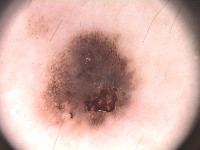</td><td>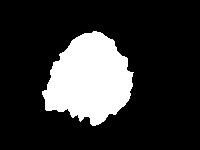</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [1]:
!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar

"wget" ­Ґ пў«пҐвбп ў­гваҐ­­Ґ© Ё«Ё ў­Ґи­Ґ©
Є®¬ ­¤®©, ЁбЇ®«­пҐ¬®© Їа®Ја ¬¬®© Ё«Ё Ї ЄҐв­л¬ д ©«®¬.


In [2]:
!ls

"ls" ­Ґ пў«пҐвбп ў­гваҐ­­Ґ© Ё«Ё ў­Ґи­Ґ©
Є®¬ ­¤®©, ЁбЇ®«­пҐ¬®© Їа®Ја ¬¬®© Ё«Ё Ї ЄҐв­л¬ д ©«®¬.


In [ ]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [1]:
images = []
lesions = []
from skimage.io import imread
import os
root = '\PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [2]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [3]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [4]:
len(lesions)

200

Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

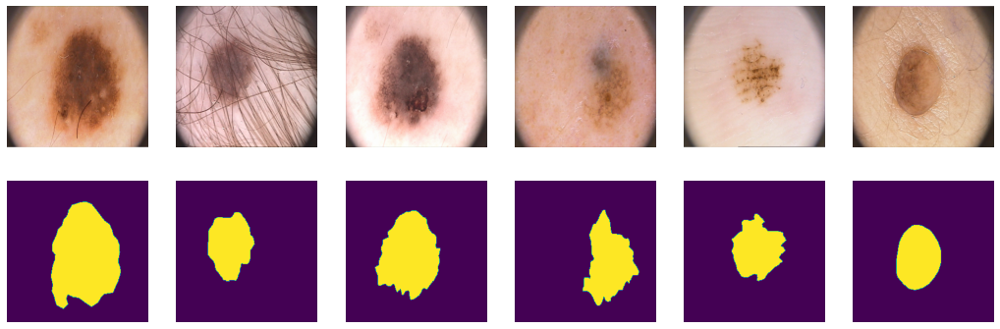

In [5]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [6]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [7]:
print(len(tr), len(val), len(ts))

100 50 50


#### PyTorch DataLoader

In [8]:
from torch.utils.data import DataLoader
batch_size = 25
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])), 
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=10, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=10, shuffle=True)

In [9]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

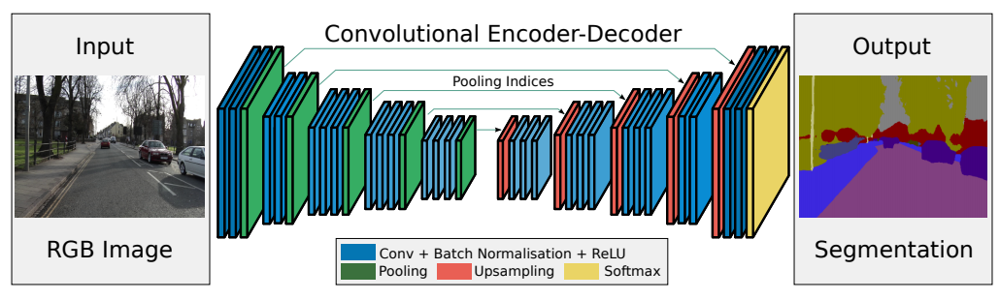

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [11]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.Sigmoid = nn.Sigmoid()
        self.enc_conv0 = self.conv_block_1(in_channels=3, out_channels=16)
        self.pool = nn.MaxPool2d(2, stride=2, return_indices=True)
        self.enc_conv1 = self.conv_block_1(in_channels=16, out_channels=32)
      
        self.enc_conv2 = self.conv_block_2(in_channels=32, out_channels=64)
     
        self.enc_conv3 = self.conv_block_2(in_channels = 64, out_channels=128)
      
        self.enc_conv4 = self.conv_block_2(in_channels=128, out_channels=256)
        '''
        self.bottleneck_conv = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=3, stride=1, padding=1),
                              nn.BatchNorm2d(num_features=1024),      
                              nn.ReLU(),
                                    
                                    nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, stride=1, padding=1),
                                    nn.BatchNorm2d(num_features=512),
                              nn.ReLU())'''

        # decoder (upsampling)
        self.uppool =  nn.MaxUnpool2d(2, stride=2)
        self.dec_conv0 = self.conv_block_2(in_channels=256, out_channels=128)
       
        self.dec_conv1 = self.conv_block_2(in_channels=128, out_channels=64)
     
        self.dec_conv2 = self.conv_block_2(in_channels=64, out_channels=32)
    
        self.dec_conv3 = self.conv_block_1(in_channels=32, out_channels=16)
        
        self.dec_conv4 = self.output(in_channels=16, out_channels=1)
        
    
    def output(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                              nn.BatchNorm2d(num_features=out_channels),      
                              nn.ReLU(),
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1))
        return block
        
    def conv_block_1(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                              nn.BatchNorm2d(num_features=out_channels),      
                              nn.ReLU(),
                                    
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.BatchNorm2d(num_features=out_channels),
                              nn.ReLU())
        return block
    def conv_block_2(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                               nn.BatchNorm2d(num_features=out_channels),      
                              nn.ReLU(),
                                   
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.BatchNorm2d(num_features=out_channels),
                              nn.ReLU(),
                                    
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.BatchNorm2d(num_features=out_channels),
                              nn.ReLU())
        return block


    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0, ind0 = self.pool(e0)
        
        e1 = self.enc_conv1(p0)
        p1, ind1 = self.pool(e1)
        
        e2 = self.enc_conv2(p1)
        p2, ind2 = self.pool(e2)
         
        e3 = self.enc_conv3(p2)
        p3, ind3 = self.pool(e3)
        
        e4 = self.enc_conv4(p3)
        p4, ind4 = self.pool(e4)
        # decoder
        
        #b = self.bottleneck_conv(p4)
        
        up0 = self.uppool(p4, ind4)
        d0 = self.dec_conv0(up0)
        
        up1 = self.uppool(d0, ind3)
        d1 = self.dec_conv1(up1)
        
        up2 = self.uppool(d1, ind2)
        d2 = self.dec_conv2(up2)
        
        up3 = self.uppool(d2, ind1)
        d3 = self.dec_conv3(up3)
        
        up4 = self.uppool(d3, ind0)
        d4 = self.Sigmoid(self.dec_conv4(up4)) # no activation
        return d4
    

In [12]:
model = SegNet()
from torchsummary import summary
summary(model, (3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 16, 256, 256]        --
|    └─Conv2d: 2-1                       [-1, 16, 256, 256]        448
|    └─BatchNorm2d: 2-2                  [-1, 16, 256, 256]        32
|    └─ReLU: 2-3                         [-1, 16, 256, 256]        --
|    └─Conv2d: 2-4                       [-1, 16, 256, 256]        2,320
|    └─BatchNorm2d: 2-5                  [-1, 16, 256, 256]        32
|    └─ReLU: 2-6                         [-1, 16, 256, 256]        --
├─MaxPool2d: 1-2                         [-1, 16, 128, 128]        --
├─Sequential: 1-3                        [-1, 32, 128, 128]        --
|    └─Conv2d: 2-7                       [-1, 32, 128, 128]        4,640
|    └─BatchNorm2d: 2-8                  [-1, 32, 128, 128]        64
|    └─ReLU: 2-9                         [-1, 32, 128, 128]        --
|    └─Conv2d: 2-10                      [-1, 32, 128, 128]        9,248
|    

C:\anaconda3\lib\site-packages\torch\nn\functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 16, 256, 256]        --
|    └─Conv2d: 2-1                       [-1, 16, 256, 256]        448
|    └─BatchNorm2d: 2-2                  [-1, 16, 256, 256]        32
|    └─ReLU: 2-3                         [-1, 16, 256, 256]        --
|    └─Conv2d: 2-4                       [-1, 16, 256, 256]        2,320
|    └─BatchNorm2d: 2-5                  [-1, 16, 256, 256]        32
|    └─ReLU: 2-6                         [-1, 16, 256, 256]        --
├─MaxPool2d: 1-2                         [-1, 16, 128, 128]        --
├─Sequential: 1-3                        [-1, 32, 128, 128]        --
|    └─Conv2d: 2-7                       [-1, 32, 128, 128]        4,640
|    └─BatchNorm2d: 2-8                  [-1, 32, 128, 128]        64
|    └─ReLU: 2-9                         [-1, 32, 128, 128]        --
|    └─Conv2d: 2-10                      [-1, 32, 128, 128]        9,248
|    

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [12]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return thresholded  # 

## Функция потерь [1 балл]

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации. 

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [13]:
def bce_loss(y_real, y_pred):
    y_pred = torch.squeeze(y_pred,dim=1)
    #y_pred = torch.where(y_pred>0.5, 1, 0)
    y_real = torch.squeeze(y_real,dim=1)
    loss = torch.mean(y_pred - y_pred*y_real + torch.log(1+torch.exp(-y_pred)))
    return loss

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [14]:
from tqdm.notebook import tqdm
import datetime
def train(model, optimizer, loss_fn, epochs, data_tr, data_val, scheduler):
    step_losses = []
    epoch_losses_train = []
    epoch_losses_val = []

    for epoch in tqdm(range(epochs)):
        print('* Epoch %d/%d' % (epoch+1, epochs))
        epoch_loss = 0
        epoch_loss_test = 0

        avg_loss = 0
        model.train()  # train mode
        for X_batch, Y_batch in  tqdm(data_tr, total=len(data_tr)):
            # data to device

            # set parameter gradients to zero

            # forward
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            optimizer.zero_grad()
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            step_losses.append(loss.item())
            print(loss)
        '''
        if epoch % 10 == 0:
            state = {'info':      "SegNet + BCE+ больше размерность"+str(optimizer.param_groups[0]['lr']),            # описание
         'date':      datetime.datetime.now(),   # дата и время
         'model' :    model.state_dict(),        # параметры модели
         'optimizer': optimizer.state_dict()}    # состояние оптимизатора
            torch.save(state, '/Big_SegNet + BCE_' + str(epoch)+ '.pth')

         '''   # calculate loss to show the user
        

        # show intermediate results
        with torch.no_grad():
            model.eval()  
            for X_batch, Y_batch in tqdm(data_val, total=len(data_val)):
                X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
                Y_pred = model(X_batch)
                loss_test = loss_fn(Y_batch, Y_pred)
                epoch_loss_test += loss_test.item()
        epoch_losses_val.append(epoch_loss_test/len(data_val))
        epoch_losses_train.append(epoch_loss/len(data_tr))
        scheduler.step(epoch_loss_test/len(data_val))
        curr_lr = optimizer.param_groups[0]['lr']
        print(f'Epoch {epoch}\t \Training Loss: {epoch_loss/len(data_tr)}\t \
        Validation Loss:{epoch_loss_test/len(data_val)}\t \ LR:{curr_lr}')
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].plot(step_losses)
        axes[1].plot(epoch_losses_train, label = 'train')
        axes[1].plot(epoch_losses_val, color = 'red', label = 'val')
        axes[1].legend()
        plt.show()


## Инференс [1 балл]

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [15]:
def predict(model, data):
    model.eval()  # testing mode
    Y_pred = [ X_batch for X_batch, _ in data]
    return np.array(Y_pred)

In [54]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    scores = 0
    for X_batch, Y_label in data:
        Y_pred = model(X_batch)
        Y_pred = torch.where(Y_pred>0.45, 1, 0)
        scores += metric(Y_pred, Y_label.to(device)).mean().item()

    return scores/len(data)

## Основной момент: обучение

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


In [82]:
model = SegNet().to(device)

  0%|          | 0/30 [00:00<?, ?it/s]

* Epoch 1/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.7790, grad_fn=<MeanBackward0>)
tensor(0.7456, grad_fn=<MeanBackward0>)
tensor(0.7495, grad_fn=<MeanBackward0>)
tensor(0.7389, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 0.7532323002815247	         Validation Loss:0.8041800379753112	 \ LR:0.1


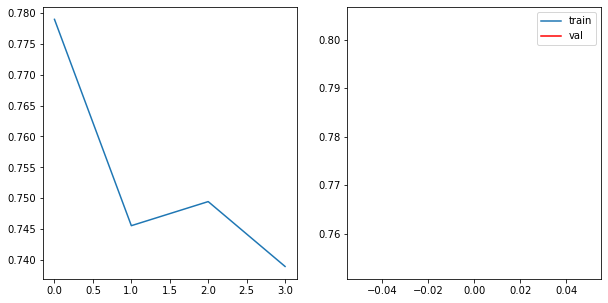

* Epoch 2/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.7084, grad_fn=<MeanBackward0>)
tensor(0.6856, grad_fn=<MeanBackward0>)
tensor(0.6781, grad_fn=<MeanBackward0>)
tensor(0.6889, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 0.6902536004781723	         Validation Loss:0.7822251200675965	 \ LR:0.1


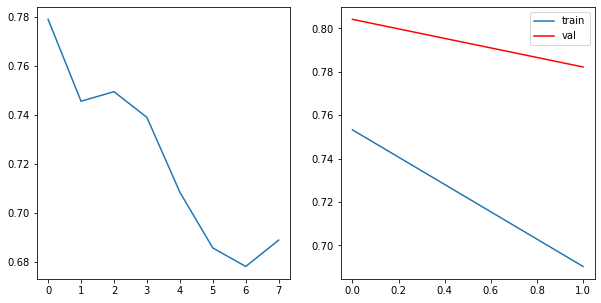

* Epoch 3/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6803, grad_fn=<MeanBackward0>)
tensor(0.6819, grad_fn=<MeanBackward0>)
tensor(0.6816, grad_fn=<MeanBackward0>)
tensor(0.6779, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 0.6804107427597046	         Validation Loss:0.7763381123542785	 \ LR:0.1


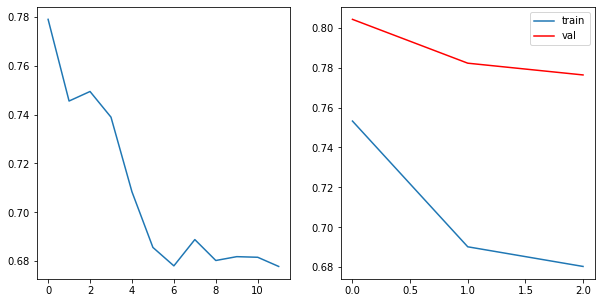

* Epoch 4/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6847, grad_fn=<MeanBackward0>)
tensor(0.6735, grad_fn=<MeanBackward0>)
tensor(0.6711, grad_fn=<MeanBackward0>)
tensor(0.6659, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 0.6738332957029343	         Validation Loss:0.757397472858429	 \ LR:0.1


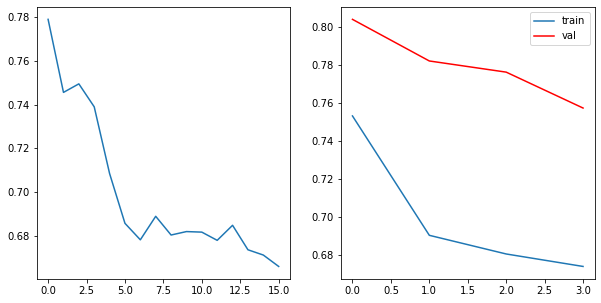

* Epoch 5/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6686, grad_fn=<MeanBackward0>)
tensor(0.6744, grad_fn=<MeanBackward0>)
tensor(0.6618, grad_fn=<MeanBackward0>)
tensor(0.6627, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 0.6668602824211121	         Validation Loss:0.7503760576248169	 \ LR:0.1


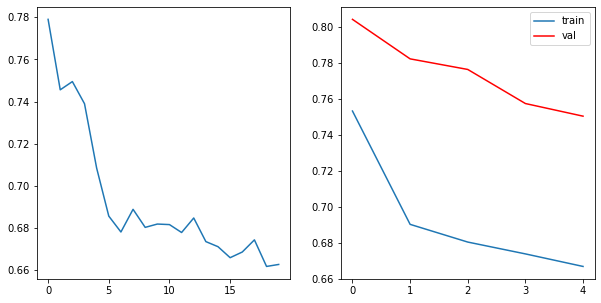

* Epoch 6/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6565, grad_fn=<MeanBackward0>)
tensor(0.6628, grad_fn=<MeanBackward0>)
tensor(0.6636, grad_fn=<MeanBackward0>)
tensor(0.6641, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 0.661710262298584	         Validation Loss:0.7787215709686279	 \ LR:0.1


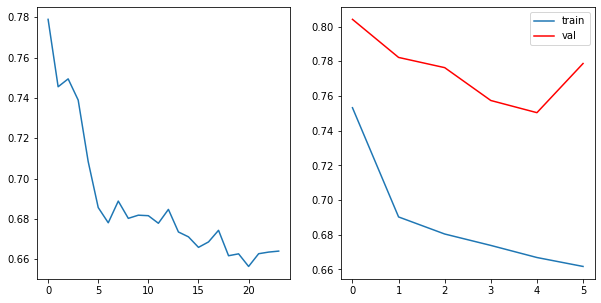

* Epoch 7/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6626, grad_fn=<MeanBackward0>)
tensor(0.6522, grad_fn=<MeanBackward0>)
tensor(0.6475, grad_fn=<MeanBackward0>)
tensor(0.6577, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 0.6549966931343079	         Validation Loss:0.7998077273368835	 \ LR:0.1


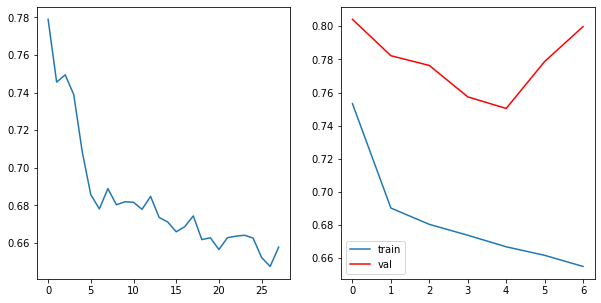

* Epoch 8/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6529, grad_fn=<MeanBackward0>)
tensor(0.6514, grad_fn=<MeanBackward0>)
tensor(0.6445, grad_fn=<MeanBackward0>)
tensor(0.6419, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 0.647667646408081	         Validation Loss:0.8076906800270081	 \ LR:0.1


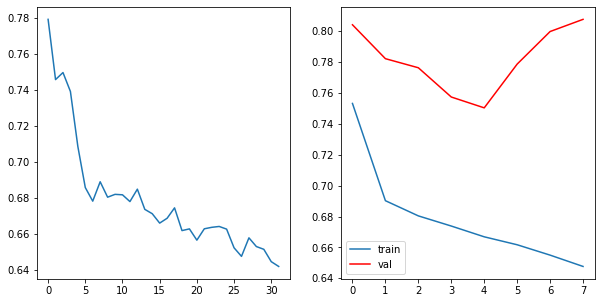

* Epoch 9/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6606, grad_fn=<MeanBackward0>)
tensor(0.6509, grad_fn=<MeanBackward0>)
tensor(0.6379, grad_fn=<MeanBackward0>)
tensor(0.6317, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 0.6452905535697937	         Validation Loss:0.8276495933532715	 \ LR:0.1


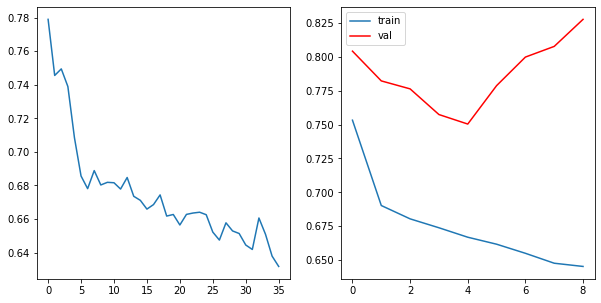

* Epoch 10/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6374, grad_fn=<MeanBackward0>)
tensor(0.6416, grad_fn=<MeanBackward0>)
tensor(0.6284, grad_fn=<MeanBackward0>)
tensor(0.6331, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 0.6351086646318436	         Validation Loss:0.8357105731964112	 \ LR:0.010000000000000002


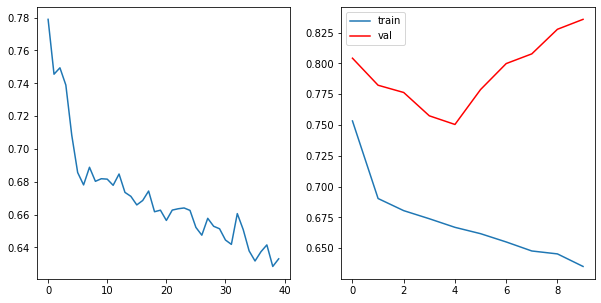

* Epoch 11/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6515, grad_fn=<MeanBackward0>)
tensor(0.6248, grad_fn=<MeanBackward0>)
tensor(0.6226, grad_fn=<MeanBackward0>)
tensor(0.6245, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 0.6308623105287552	         Validation Loss:0.7636704802513122	 \ LR:0.010000000000000002


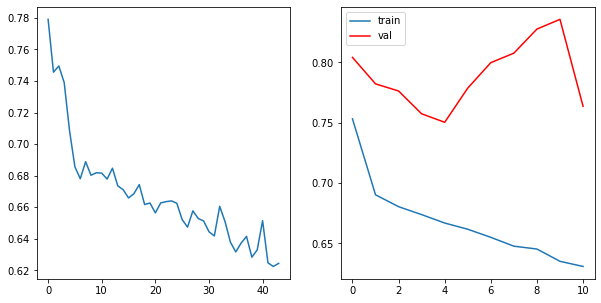

* Epoch 12/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6275, grad_fn=<MeanBackward0>)
tensor(0.6147, grad_fn=<MeanBackward0>)
tensor(0.6448, grad_fn=<MeanBackward0>)
tensor(0.6298, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 0.6291672140359879	         Validation Loss:0.6688807606697083	 \ LR:0.010000000000000002


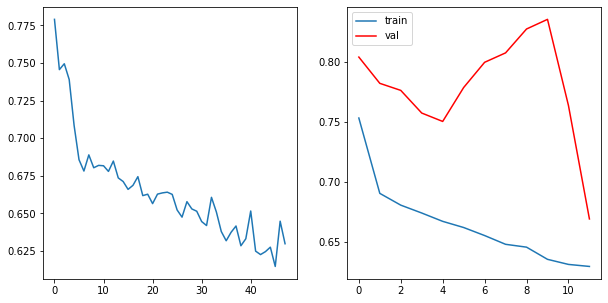

* Epoch 13/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6316, grad_fn=<MeanBackward0>)
tensor(0.6196, grad_fn=<MeanBackward0>)
tensor(0.6170, grad_fn=<MeanBackward0>)
tensor(0.6509, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 0.629753515124321	         Validation Loss:0.6503886580467224	 \ LR:0.010000000000000002


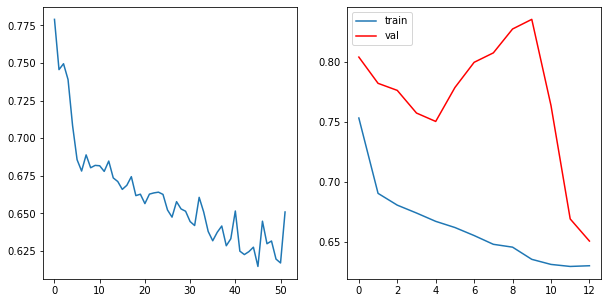

* Epoch 14/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6401, grad_fn=<MeanBackward0>)
tensor(0.6144, grad_fn=<MeanBackward0>)
tensor(0.6185, grad_fn=<MeanBackward0>)
tensor(0.6390, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 0.6279991865158081	         Validation Loss:0.6461556792259217	 \ LR:0.010000000000000002


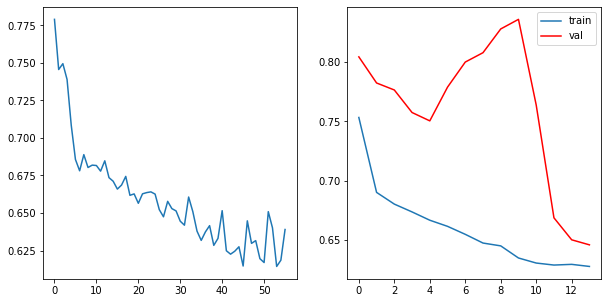

* Epoch 15/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6121, grad_fn=<MeanBackward0>)
tensor(0.6293, grad_fn=<MeanBackward0>)
tensor(0.6322, grad_fn=<MeanBackward0>)
tensor(0.6294, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 0.625772088766098	         Validation Loss:0.6449528574943543	 \ LR:0.010000000000000002


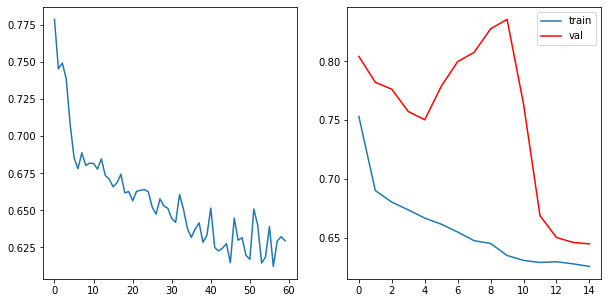

* Epoch 16/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6168, grad_fn=<MeanBackward0>)
tensor(0.6360, grad_fn=<MeanBackward0>)
tensor(0.6169, grad_fn=<MeanBackward0>)
tensor(0.6349, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 0.6261490881443024	         Validation Loss:0.6445555686950684	 \ LR:0.010000000000000002


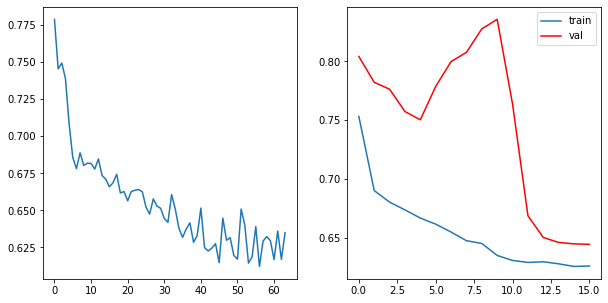

* Epoch 17/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6346, grad_fn=<MeanBackward0>)
tensor(0.6088, grad_fn=<MeanBackward0>)
tensor(0.6267, grad_fn=<MeanBackward0>)
tensor(0.6324, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 0.62564717233181	         Validation Loss:0.6438363790512085	 \ LR:0.010000000000000002


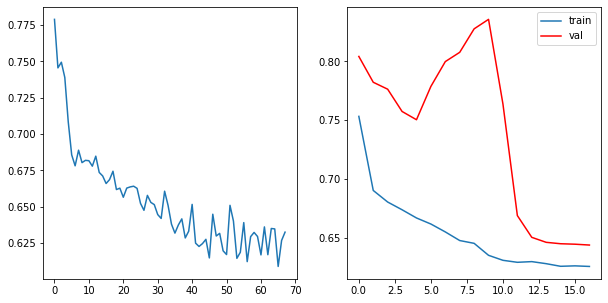

* Epoch 18/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6137, grad_fn=<MeanBackward0>)
tensor(0.6214, grad_fn=<MeanBackward0>)
tensor(0.6438, grad_fn=<MeanBackward0>)
tensor(0.6224, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 0.6253240257501602	         Validation Loss:0.6433021664619446	 \ LR:0.010000000000000002


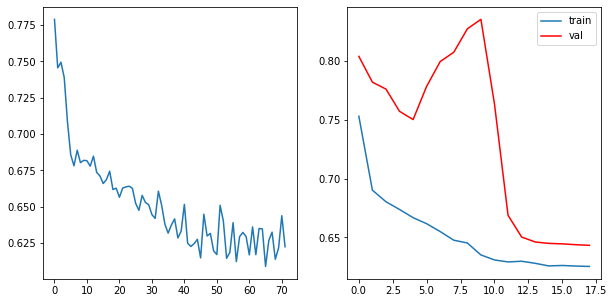

* Epoch 19/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6330, grad_fn=<MeanBackward0>)
tensor(0.6229, grad_fn=<MeanBackward0>)
tensor(0.6047, grad_fn=<MeanBackward0>)
tensor(0.6282, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 0.6222099363803864	         Validation Loss:0.6429521799087524	 \ LR:0.010000000000000002


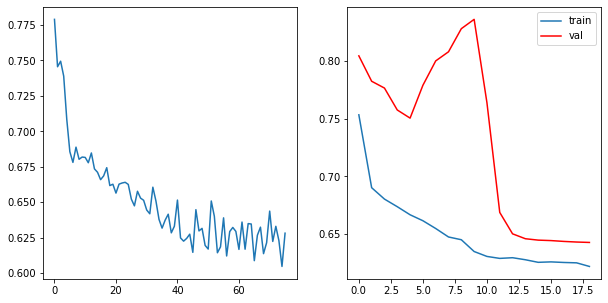

* Epoch 20/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6282, grad_fn=<MeanBackward0>)
tensor(0.6143, grad_fn=<MeanBackward0>)
tensor(0.6297, grad_fn=<MeanBackward0>)
tensor(0.6152, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 0.6218547523021698	         Validation Loss:0.6443107604980469	 \ LR:0.010000000000000002


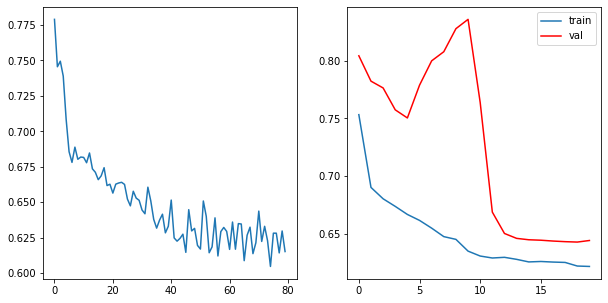

* Epoch 21/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6060, grad_fn=<MeanBackward0>)
tensor(0.6363, grad_fn=<MeanBackward0>)
tensor(0.6231, grad_fn=<MeanBackward0>)
tensor(0.6235, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 0.6221968531608582	         Validation Loss:0.6453796982765198	 \ LR:0.010000000000000002


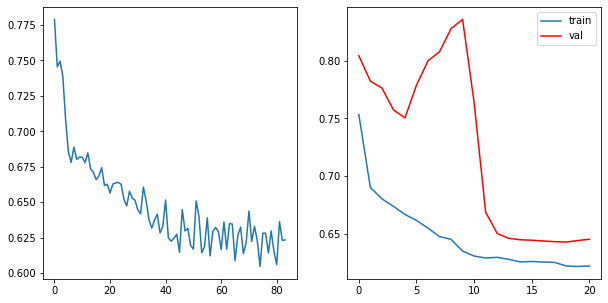

* Epoch 22/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6160, grad_fn=<MeanBackward0>)
tensor(0.6223, grad_fn=<MeanBackward0>)
tensor(0.6275, grad_fn=<MeanBackward0>)
tensor(0.6142, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 0.620014026761055	         Validation Loss:0.6440710186958313	 \ LR:0.010000000000000002


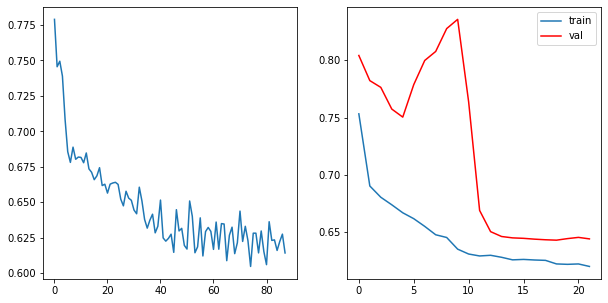

* Epoch 23/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6159, grad_fn=<MeanBackward0>)
tensor(0.6213, grad_fn=<MeanBackward0>)
tensor(0.6344, grad_fn=<MeanBackward0>)
tensor(0.6116, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 0.6207792162895203	         Validation Loss:0.6404476642608643	 \ LR:0.010000000000000002


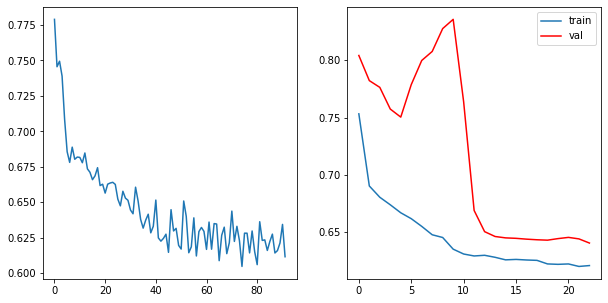

* Epoch 24/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6174, grad_fn=<MeanBackward0>)
tensor(0.6240, grad_fn=<MeanBackward0>)
tensor(0.6098, grad_fn=<MeanBackward0>)
tensor(0.6265, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 0.6194315999746323	         Validation Loss:0.6381222248077393	 \ LR:0.010000000000000002


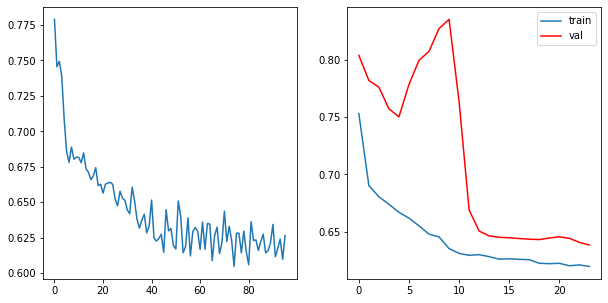

* Epoch 25/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6128, grad_fn=<MeanBackward0>)
tensor(0.6225, grad_fn=<MeanBackward0>)
tensor(0.6212, grad_fn=<MeanBackward0>)
tensor(0.6115, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 0.6170056611299515	         Validation Loss:0.6380014657974243	 \ LR:0.010000000000000002


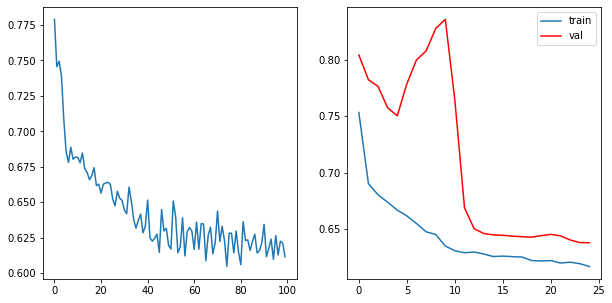

* Epoch 26/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6280, grad_fn=<MeanBackward0>)
tensor(0.6085, grad_fn=<MeanBackward0>)
tensor(0.6194, grad_fn=<MeanBackward0>)
tensor(0.6143, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 0.6175492107868195	         Validation Loss:0.6388330578804016	 \ LR:0.010000000000000002


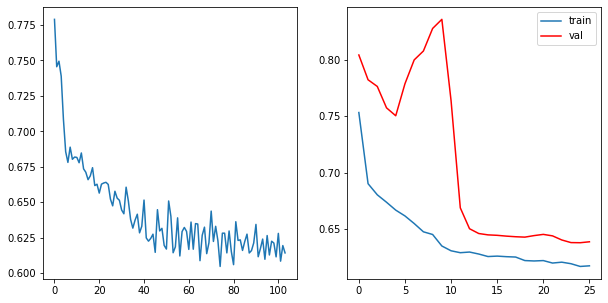

* Epoch 27/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6152, grad_fn=<MeanBackward0>)
tensor(0.6127, grad_fn=<MeanBackward0>)
tensor(0.6175, grad_fn=<MeanBackward0>)
tensor(0.6216, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 0.6167572438716888	         Validation Loss:0.639891505241394	 \ LR:0.010000000000000002


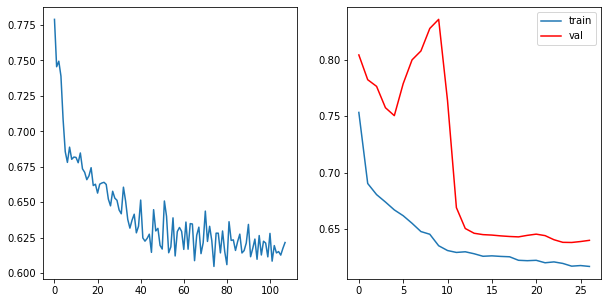

* Epoch 28/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6083, grad_fn=<MeanBackward0>)
tensor(0.6031, grad_fn=<MeanBackward0>)
tensor(0.6141, grad_fn=<MeanBackward0>)
tensor(0.6398, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 0.6163162738084793	         Validation Loss:0.6442815899848938	 \ LR:0.010000000000000002


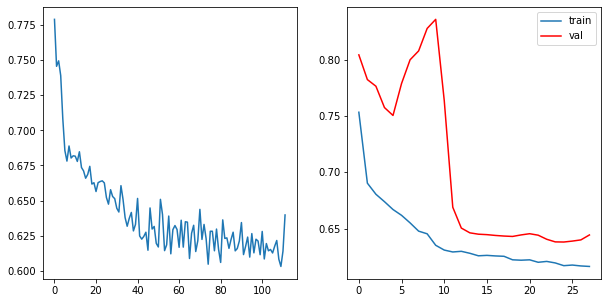

* Epoch 29/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6060, grad_fn=<MeanBackward0>)
tensor(0.6058, grad_fn=<MeanBackward0>)
tensor(0.6103, grad_fn=<MeanBackward0>)
tensor(0.6417, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 0.6159404516220093	         Validation Loss:0.6416609644889831	 \ LR:0.010000000000000002


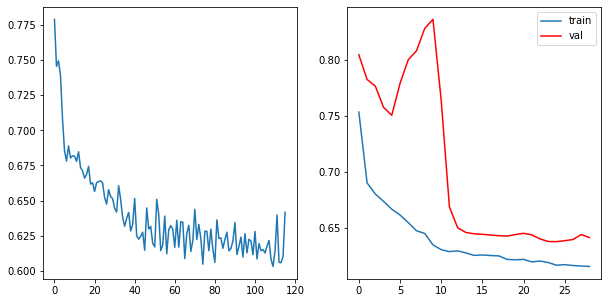

* Epoch 30/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6024, grad_fn=<MeanBackward0>)
tensor(0.6209, grad_fn=<MeanBackward0>)
tensor(0.6255, grad_fn=<MeanBackward0>)
tensor(0.6064, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 0.6137917935848236	         Validation Loss:0.6415528178215026	 \ LR:0.0010000000000000002


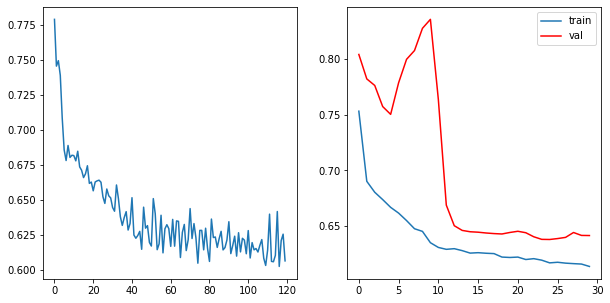

In [83]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
max_epochs = 30
optim = torch.optim.Adam(model.parameters(), lr=0.1)
scheduler = ReduceLROnPlateau(optim, 'min', patience = 4)
train(model, optim, bce_loss, max_epochs, data_tr, data_val, scheduler)

In [88]:
score_model(model, iou_pytorch, data_val)

0.5120000064373016

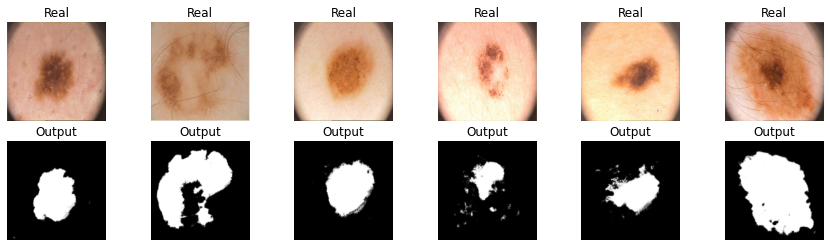

In [90]:
X_val, Y_val = next(iter(data_val))
model.eval()  # testing mode
Y_hat = model(X_val) # detach and put into cpu

        # Visualize tools
clear_output(wait=True)
for k in range(6):
    plt.subplot(2, 6, k+1)
    plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
    plt.title('Real')
    plt.axis('off')

    plt.subplot(2, 6, k+7)
    plt.imshow(Y_hat[k, 0].detach().numpy(), cmap='gray')
    plt.title('Output')
    plt.axis('off')
plt.show()

Ответьте себе на вопрос: не переобучается ли моя модель?

Судя по правому графику модель не переобучилась. Разница между валидационным лосом и тренировочным не расходится 

-----------------------------------------------------------------------------------------

## Дополнительные функции потерь [2 балла] 

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss. 
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало эпох, прежде чем бить тревогу попробуйте перебрать различные варианты и убедитесь, что во всех других сетапах сеть достигает желанного результата. СПОЙЛЕР: учиться она будет при всех лоссах, предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.


In [48]:
def dice_loss(y_real, y_pred):
    smooth = 1e-8
    outputs = torch.squeeze(y_pred,dim=1)
    labels = torch.squeeze(y_real,dim=1)
    num = torch.sum(outputs * labels)
    den = torch.sum(outputs + labels)
    res = 1 - ((2. * num + smooth) / (den + smooth))#/(256*256)
    return res 

Проводим тестирование:

  0%|          | 0/40 [00:00<?, ?it/s]

* Epoch 1/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6329, grad_fn=<RsubBackward1>)
tensor(0.5807, grad_fn=<RsubBackward1>)
tensor(0.5690, grad_fn=<RsubBackward1>)
tensor(0.5291, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 0.5778933465480804	         Validation Loss:0.6027799725532532	 \ LR:0.1


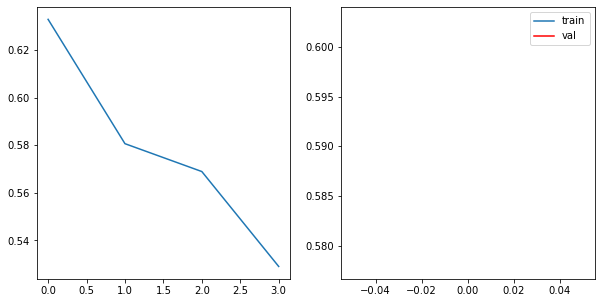

* Epoch 2/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5423, grad_fn=<RsubBackward1>)
tensor(0.4991, grad_fn=<RsubBackward1>)
tensor(0.4727, grad_fn=<RsubBackward1>)
tensor(0.5189, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 0.5082557052373886	         Validation Loss:0.5864484667778015	 \ LR:0.1


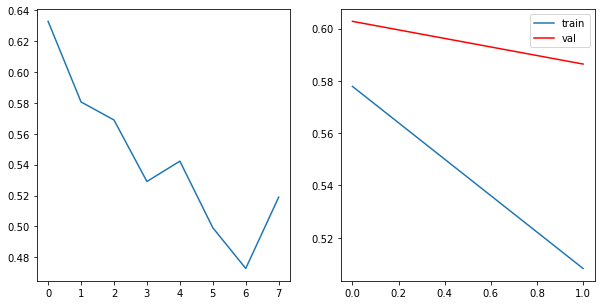

* Epoch 3/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4713, grad_fn=<RsubBackward1>)
tensor(0.4679, grad_fn=<RsubBackward1>)
tensor(0.4748, grad_fn=<RsubBackward1>)
tensor(0.4731, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 0.47177010774612427	         Validation Loss:0.5642508745193482	 \ LR:0.1


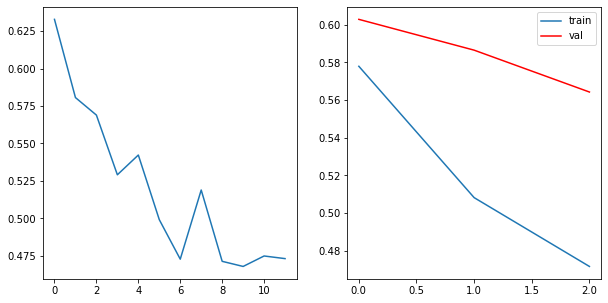

* Epoch 4/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4825, grad_fn=<RsubBackward1>)
tensor(0.4504, grad_fn=<RsubBackward1>)
tensor(0.4525, grad_fn=<RsubBackward1>)
tensor(0.4729, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 0.46458229422569275	         Validation Loss:0.5596194386482238	 \ LR:0.1


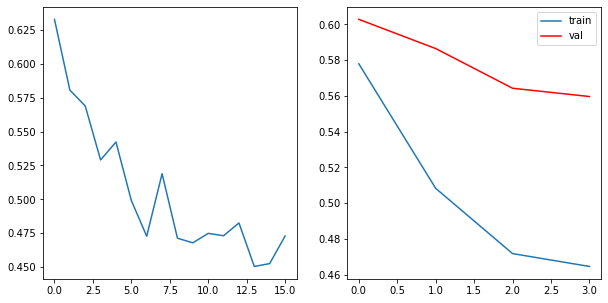

* Epoch 5/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3855, grad_fn=<RsubBackward1>)
tensor(0.5344, grad_fn=<RsubBackward1>)
tensor(0.4396, grad_fn=<RsubBackward1>)
tensor(0.4877, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 0.46180224418640137	         Validation Loss:0.5659493684768677	 \ LR:0.1


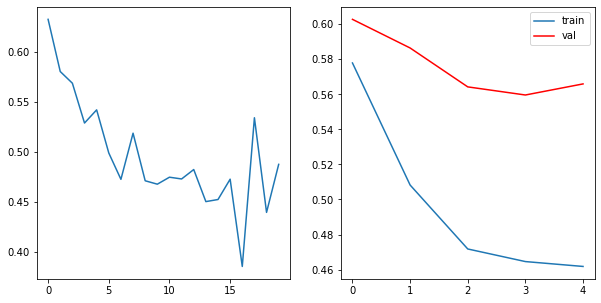

* Epoch 6/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4754, grad_fn=<RsubBackward1>)
tensor(0.3946, grad_fn=<RsubBackward1>)
tensor(0.4574, grad_fn=<RsubBackward1>)
tensor(0.4944, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 0.45544861257076263	         Validation Loss:0.5720554828643799	 \ LR:0.1


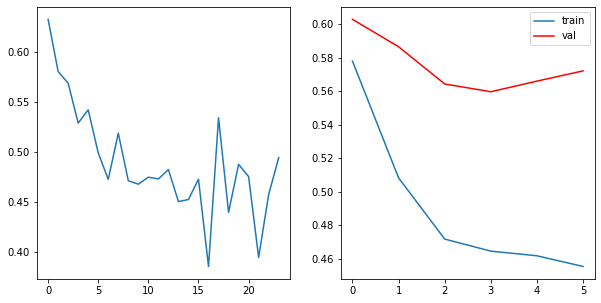

* Epoch 7/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4022, grad_fn=<RsubBackward1>)
tensor(0.4795, grad_fn=<RsubBackward1>)
tensor(0.5589, grad_fn=<RsubBackward1>)
tensor(0.3656, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 0.45158687233924866	         Validation Loss:0.5792686700820923	 \ LR:0.1


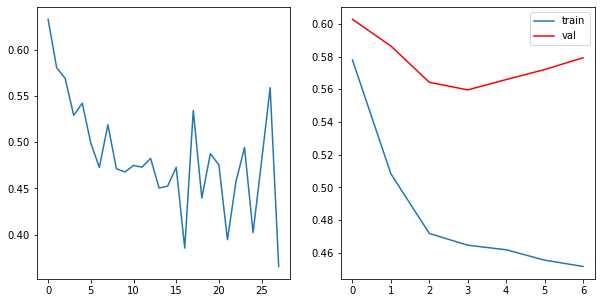

* Epoch 8/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4373, grad_fn=<RsubBackward1>)
tensor(0.3970, grad_fn=<RsubBackward1>)
tensor(0.4748, grad_fn=<RsubBackward1>)
tensor(0.4310, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 0.4350315034389496	         Validation Loss:0.5602964878082275	 \ LR:0.1


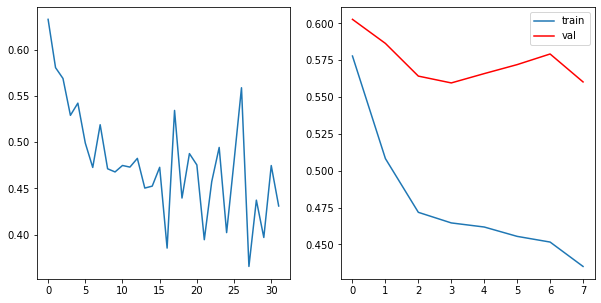

* Epoch 9/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3796, grad_fn=<RsubBackward1>)
tensor(0.4364, grad_fn=<RsubBackward1>)
tensor(0.3742, grad_fn=<RsubBackward1>)
tensor(0.5133, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 0.42588944733142853	         Validation Loss:0.541987955570221	 \ LR:0.1


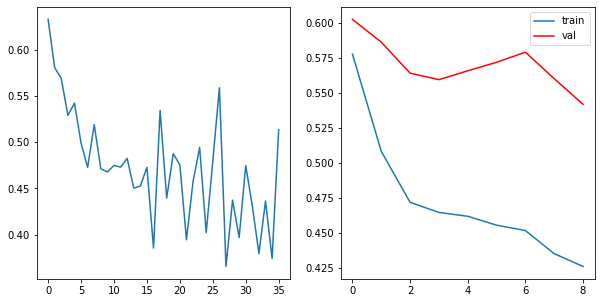

* Epoch 10/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4327, grad_fn=<RsubBackward1>)
tensor(0.4234, grad_fn=<RsubBackward1>)
tensor(0.4048, grad_fn=<RsubBackward1>)
tensor(0.3691, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 0.40751461684703827	         Validation Loss:0.5225393652915955	 \ LR:0.1


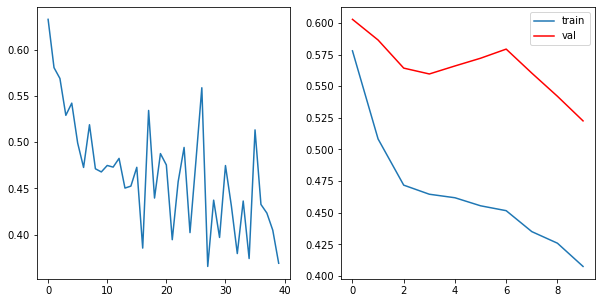

* Epoch 11/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3365, grad_fn=<RsubBackward1>)
tensor(0.4172, grad_fn=<RsubBackward1>)
tensor(0.4263, grad_fn=<RsubBackward1>)
tensor(0.3749, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 0.38873475790023804	         Validation Loss:0.4396424174308777	 \ LR:0.1


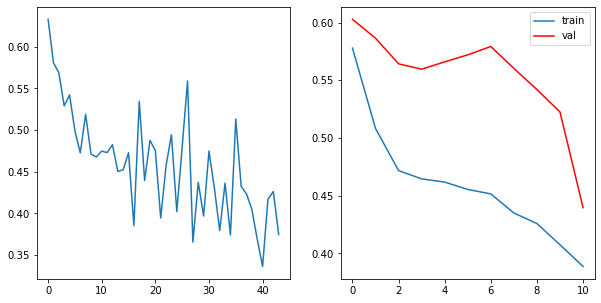

* Epoch 12/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4510, grad_fn=<RsubBackward1>)
tensor(0.3258, grad_fn=<RsubBackward1>)
tensor(0.3576, grad_fn=<RsubBackward1>)
tensor(0.3327, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 0.3667770326137543	         Validation Loss:0.422689688205719	 \ LR:0.1


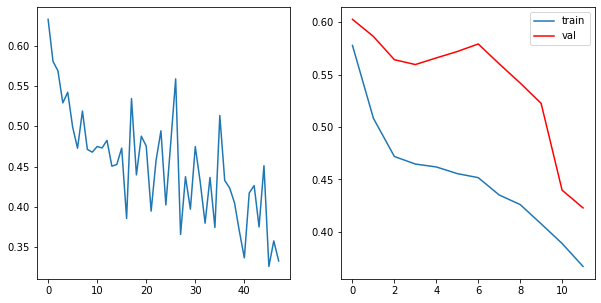

* Epoch 13/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3817, grad_fn=<RsubBackward1>)
tensor(0.4154, grad_fn=<RsubBackward1>)
tensor(0.3516, grad_fn=<RsubBackward1>)
tensor(0.2534, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 0.35053780674934387	         Validation Loss:0.45801544189453125	 \ LR:0.1


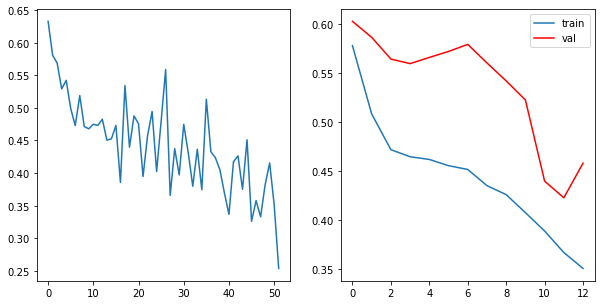

* Epoch 14/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2940, grad_fn=<RsubBackward1>)
tensor(0.2568, grad_fn=<RsubBackward1>)
tensor(0.3647, grad_fn=<RsubBackward1>)
tensor(0.3938, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 0.32730937004089355	         Validation Loss:0.48662519454956055	 \ LR:0.1


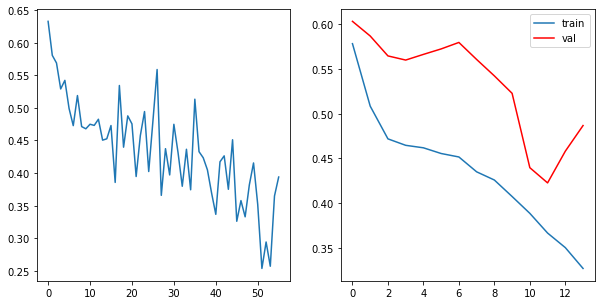

* Epoch 15/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2627, grad_fn=<RsubBackward1>)
tensor(0.3337, grad_fn=<RsubBackward1>)
tensor(0.3001, grad_fn=<RsubBackward1>)
tensor(0.2799, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 0.294095441699028	         Validation Loss:0.39550334215164185	 \ LR:0.1


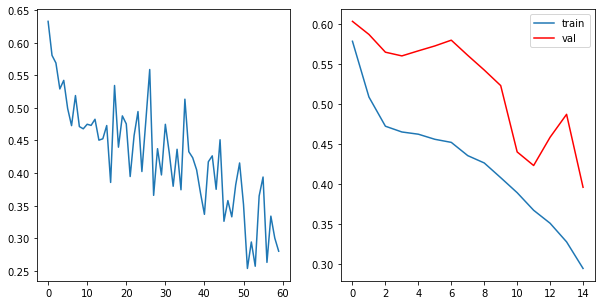

* Epoch 16/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2574, grad_fn=<RsubBackward1>)
tensor(0.3492, grad_fn=<RsubBackward1>)
tensor(0.3230, grad_fn=<RsubBackward1>)
tensor(0.3254, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 0.31375573575496674	         Validation Loss:0.5799314141273498	 \ LR:0.1


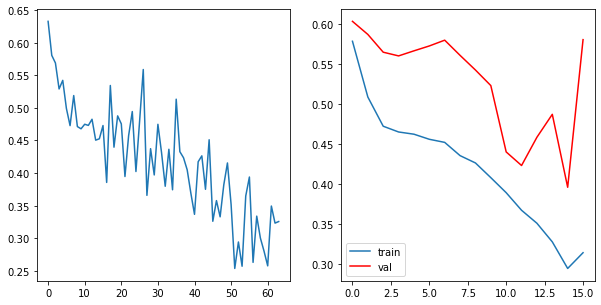

* Epoch 17/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2568, grad_fn=<RsubBackward1>)
tensor(0.2298, grad_fn=<RsubBackward1>)
tensor(0.2113, grad_fn=<RsubBackward1>)
tensor(0.2660, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 0.24095621705055237	         Validation Loss:0.4638140559196472	 \ LR:0.1


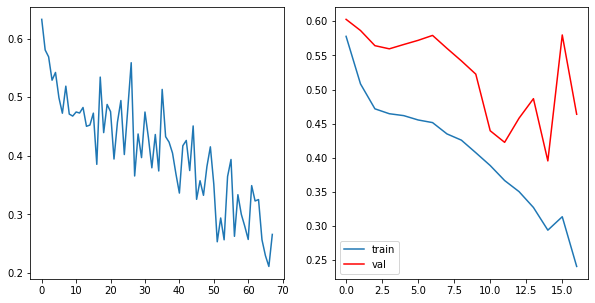

* Epoch 18/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2400, grad_fn=<RsubBackward1>)
tensor(0.2034, grad_fn=<RsubBackward1>)
tensor(0.2698, grad_fn=<RsubBackward1>)
tensor(0.1710, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 0.22105225920677185	         Validation Loss:0.5188910603523255	 \ LR:0.1


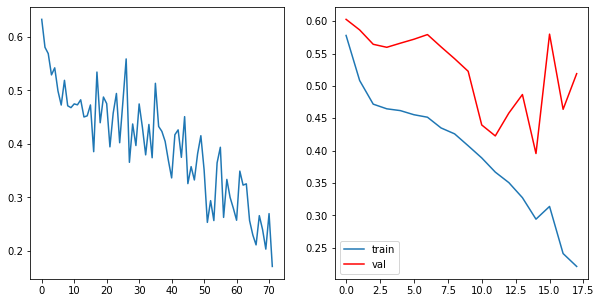

* Epoch 19/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2213, grad_fn=<RsubBackward1>)
tensor(0.2024, grad_fn=<RsubBackward1>)
tensor(0.2195, grad_fn=<RsubBackward1>)
tensor(0.2582, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 0.2253488451242447	         Validation Loss:0.5193677186965943	 \ LR:0.1


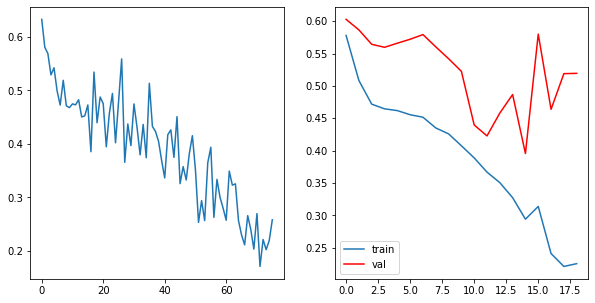

* Epoch 20/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1676, grad_fn=<RsubBackward1>)
tensor(0.1516, grad_fn=<RsubBackward1>)
tensor(0.1583, grad_fn=<RsubBackward1>)
tensor(0.2108, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 0.17205947637557983	         Validation Loss:0.4439424753189087	 \ LR:0.010000000000000002


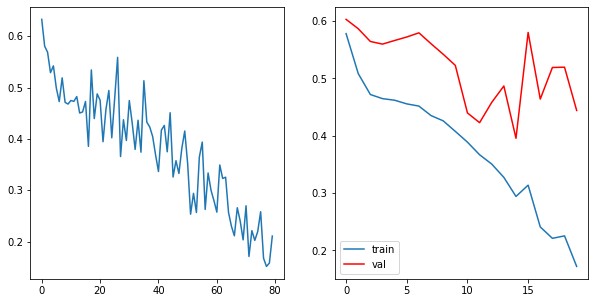

* Epoch 21/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1539, grad_fn=<RsubBackward1>)
tensor(0.1505, grad_fn=<RsubBackward1>)
tensor(0.1483, grad_fn=<RsubBackward1>)
tensor(0.1774, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 0.15750844776630402	         Validation Loss:0.3991725206375122	 \ LR:0.010000000000000002


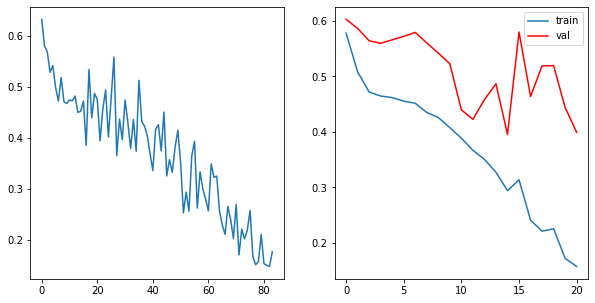

* Epoch 22/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1853, grad_fn=<RsubBackward1>)
tensor(0.1238, grad_fn=<RsubBackward1>)
tensor(0.1425, grad_fn=<RsubBackward1>)
tensor(0.1660, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 0.15440170466899872	         Validation Loss:0.36770949363708494	 \ LR:0.010000000000000002


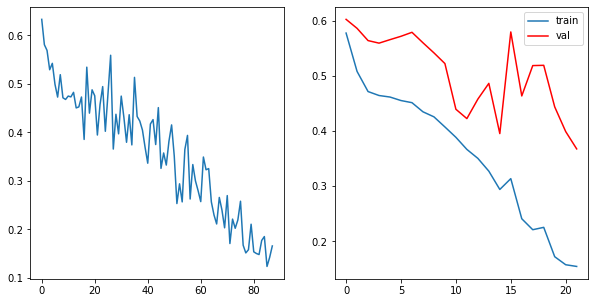

* Epoch 23/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1822, grad_fn=<RsubBackward1>)
tensor(0.1460, grad_fn=<RsubBackward1>)
tensor(0.1296, grad_fn=<RsubBackward1>)
tensor(0.1985, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 0.16408447921276093	         Validation Loss:0.36288291215896606	 \ LR:0.010000000000000002


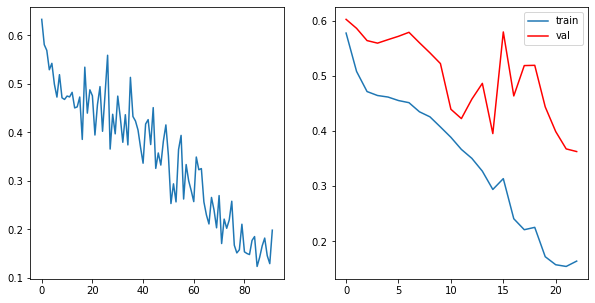

* Epoch 24/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1307, grad_fn=<RsubBackward1>)
tensor(0.1208, grad_fn=<RsubBackward1>)
tensor(0.1512, grad_fn=<RsubBackward1>)
tensor(0.2428, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 0.16137954592704773	         Validation Loss:0.38870714902877807	 \ LR:0.010000000000000002


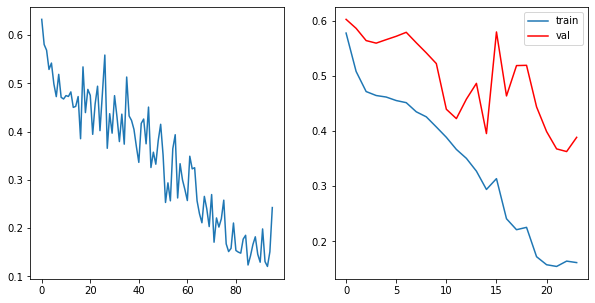

* Epoch 25/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1243, grad_fn=<RsubBackward1>)
tensor(0.1380, grad_fn=<RsubBackward1>)
tensor(0.1456, grad_fn=<RsubBackward1>)
tensor(0.1586, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 0.14160534739494324	         Validation Loss:0.38165477514266966	 \ LR:0.010000000000000002


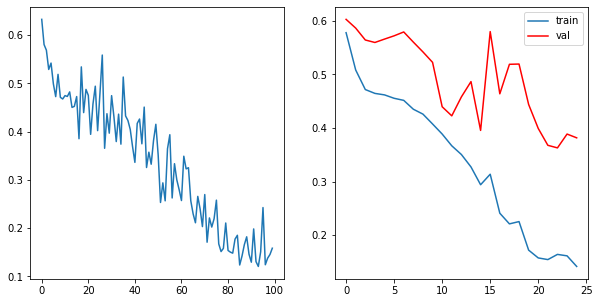

* Epoch 26/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1147, grad_fn=<RsubBackward1>)
tensor(0.1364, grad_fn=<RsubBackward1>)
tensor(0.1670, grad_fn=<RsubBackward1>)
tensor(0.1721, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 0.14755727350711823	         Validation Loss:0.3714614748954773	 \ LR:0.010000000000000002


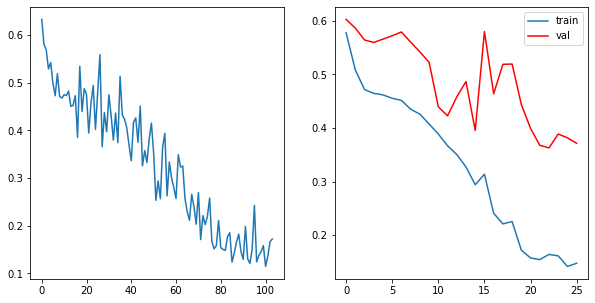

* Epoch 27/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1349, grad_fn=<RsubBackward1>)
tensor(0.1770, grad_fn=<RsubBackward1>)
tensor(0.1106, grad_fn=<RsubBackward1>)
tensor(0.1573, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 0.14495106041431427	         Validation Loss:0.27758426666259767	 \ LR:0.010000000000000002


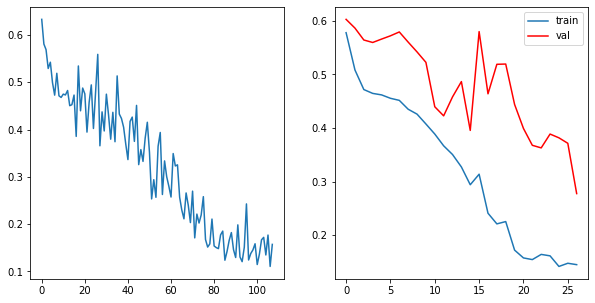

* Epoch 28/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1263, grad_fn=<RsubBackward1>)
tensor(0.1749, grad_fn=<RsubBackward1>)
tensor(0.1345, grad_fn=<RsubBackward1>)
tensor(0.1642, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 0.14999058842658997	         Validation Loss:0.2131829023361206	 \ LR:0.010000000000000002


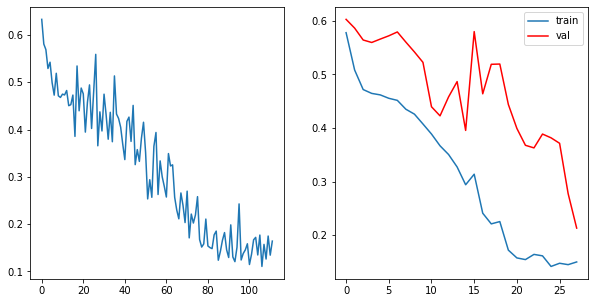

* Epoch 29/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1229, grad_fn=<RsubBackward1>)
tensor(0.1456, grad_fn=<RsubBackward1>)
tensor(0.1436, grad_fn=<RsubBackward1>)
tensor(0.1560, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 0.14200283586978912	         Validation Loss:0.20677956342697143	 \ LR:0.010000000000000002


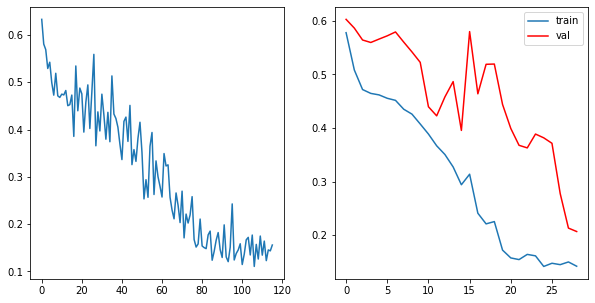

* Epoch 30/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1661, grad_fn=<RsubBackward1>)
tensor(0.1548, grad_fn=<RsubBackward1>)
tensor(0.1290, grad_fn=<RsubBackward1>)
tensor(0.1347, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 0.14613844454288483	         Validation Loss:0.2213370680809021	 \ LR:0.010000000000000002


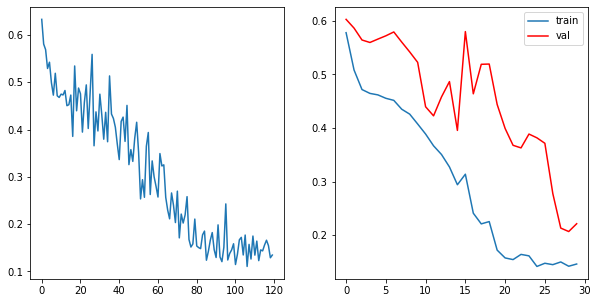

* Epoch 31/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1475, grad_fn=<RsubBackward1>)
tensor(0.1632, grad_fn=<RsubBackward1>)
tensor(0.1044, grad_fn=<RsubBackward1>)
tensor(0.1388, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30	 \Training Loss: 0.13845105469226837	         Validation Loss:0.2375569224357605	 \ LR:0.010000000000000002


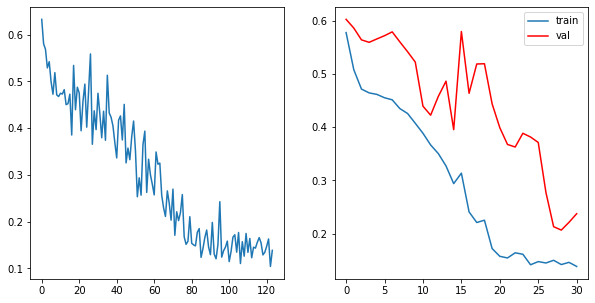

* Epoch 32/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1533, grad_fn=<RsubBackward1>)
tensor(0.1531, grad_fn=<RsubBackward1>)
tensor(0.1548, grad_fn=<RsubBackward1>)
tensor(0.1230, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31	 \Training Loss: 0.14606623351573944	         Validation Loss:0.22499996423721313	 \ LR:0.010000000000000002


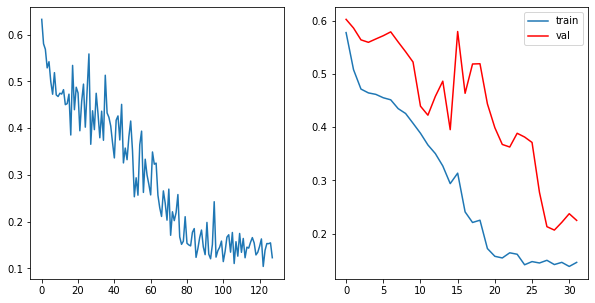

* Epoch 33/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1654, grad_fn=<RsubBackward1>)
tensor(0.1195, grad_fn=<RsubBackward1>)
tensor(0.1502, grad_fn=<RsubBackward1>)
tensor(0.1317, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32	 \Training Loss: 0.14170010387897491	         Validation Loss:0.2207139849662781	 \ LR:0.010000000000000002


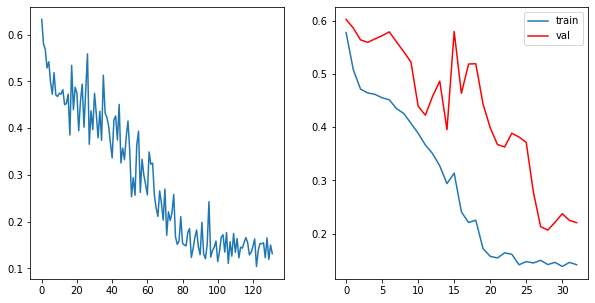

* Epoch 34/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1356, grad_fn=<RsubBackward1>)
tensor(0.1233, grad_fn=<RsubBackward1>)
tensor(0.1277, grad_fn=<RsubBackward1>)
tensor(0.1582, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33	 \Training Loss: 0.13621388375759125	         Validation Loss:0.2189284086227417	 \ LR:0.0010000000000000002


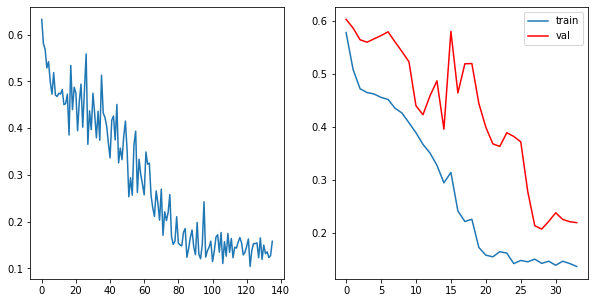

* Epoch 35/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1369, grad_fn=<RsubBackward1>)
tensor(0.1246, grad_fn=<RsubBackward1>)
tensor(0.1355, grad_fn=<RsubBackward1>)
tensor(0.1725, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34	 \Training Loss: 0.14234720170497894	         Validation Loss:0.21256505250930785	 \ LR:0.0010000000000000002


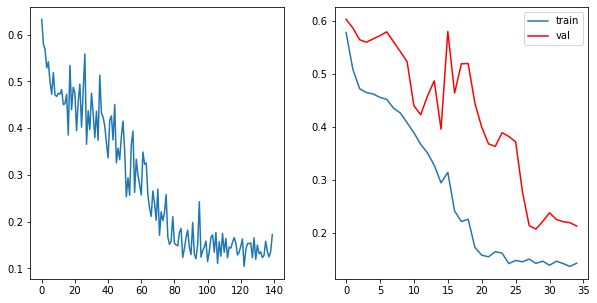

* Epoch 36/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1242, grad_fn=<RsubBackward1>)
tensor(0.1669, grad_fn=<RsubBackward1>)
tensor(0.1730, grad_fn=<RsubBackward1>)
tensor(0.1417, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35	 \Training Loss: 0.15146049857139587	         Validation Loss:0.20376476049423217	 \ LR:0.0010000000000000002


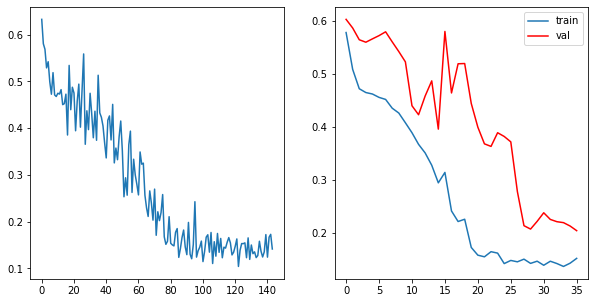

* Epoch 37/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1071, grad_fn=<RsubBackward1>)
tensor(0.1758, grad_fn=<RsubBackward1>)
tensor(0.1457, grad_fn=<RsubBackward1>)
tensor(0.1439, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36	 \Training Loss: 0.1430978924036026	         Validation Loss:0.19838720560073853	 \ LR:0.0010000000000000002


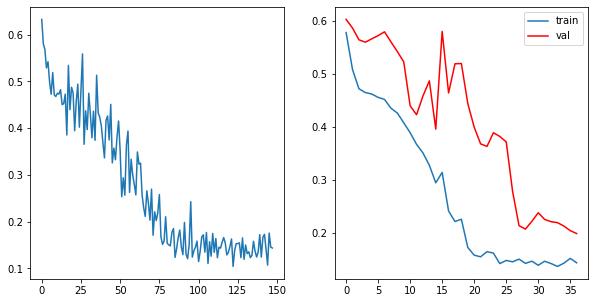

* Epoch 38/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1293, grad_fn=<RsubBackward1>)
tensor(0.1444, grad_fn=<RsubBackward1>)
tensor(0.1313, grad_fn=<RsubBackward1>)
tensor(0.1526, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37	 \Training Loss: 0.1393953561782837	         Validation Loss:0.20012601613998413	 \ LR:0.0010000000000000002


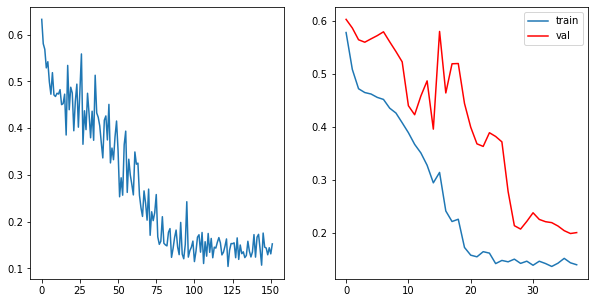

* Epoch 39/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1148, grad_fn=<RsubBackward1>)
tensor(0.1441, grad_fn=<RsubBackward1>)
tensor(0.1641, grad_fn=<RsubBackward1>)
tensor(0.1355, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38	 \Training Loss: 0.13964368402957916	         Validation Loss:0.19011446237564086	 \ LR:0.0010000000000000002


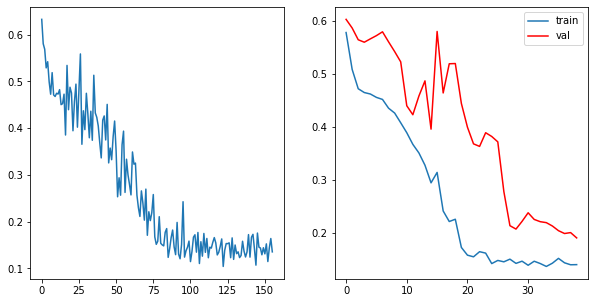

* Epoch 40/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1350, grad_fn=<RsubBackward1>)
tensor(0.1451, grad_fn=<RsubBackward1>)
tensor(0.1243, grad_fn=<RsubBackward1>)
tensor(0.1506, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39	 \Training Loss: 0.13876506686210632	         Validation Loss:0.19326962232589723	 \ LR:0.0010000000000000002


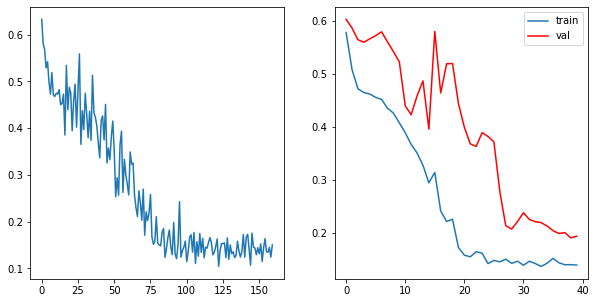

In [49]:
model_dice = SegNet().to(device)

max_epochs = 40
optimaizer = torch.optim.Adam(model_dice.parameters(),  lr=0.1)
scheduler = ReduceLROnPlateau(optimaizer, 'min', patience = 4)
train(model_dice, optimaizer, dice_loss, max_epochs, data_tr, data_val, scheduler)

In [79]:
score_model(model_dice, iou_pytorch, data_val)

0.5239999949932098

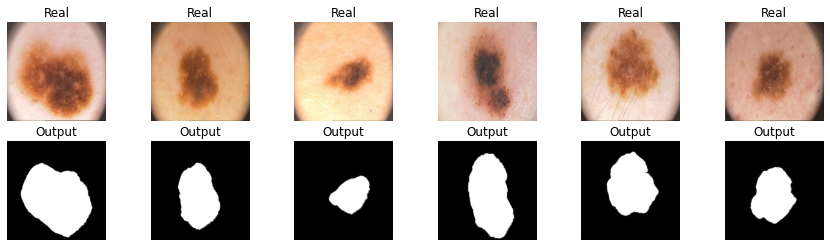

In [69]:
X_val, Y_val = next(iter(data_val))
model_dice.eval()  # testing mode
Y_hat = model_dice(X_val) # detach and put into cpu

        # Visualize tools
clear_output(wait=True)
for k in range(6):
    plt.subplot(2, 6, k+1)
    plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
    plt.title('Real')
    plt.axis('off')

    plt.subplot(2, 6, k+7)
    plt.imshow(Y_hat[k, 0].detach().numpy(), cmap='gray')
    plt.title('Output')
    plt.axis('off')
plt.show()

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf) 

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [22]:
def focal_loss(y_real, y_pred, eps = 1e-8, gamma = 2):
    y_pred = torch.squeeze(y_pred,dim=1)
    y_real = torch.squeeze(y_real,dim=1)
    y = y_pred+eps
    loss = torch.mean(-(((1-y)**gamma)*y_real*torch.log(y)+(1-y_real)*torch.log(1-y)))
    return loss


  0%|          | 0/40 [00:00<?, ?it/s]

* Epoch 1/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5315, grad_fn=<MeanBackward0>)
tensor(0.4826, grad_fn=<MeanBackward0>)
tensor(0.4424, grad_fn=<MeanBackward0>)
tensor(0.3811, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 0.45941246300935745	         Validation Loss:0.4629146337509155	 \ LR:0.1


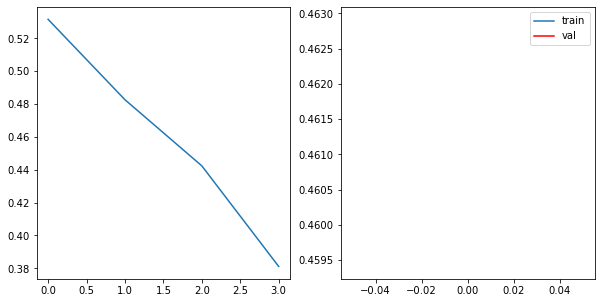

* Epoch 2/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4434, grad_fn=<MeanBackward0>)
tensor(0.3676, grad_fn=<MeanBackward0>)
tensor(0.3515, grad_fn=<MeanBackward0>)
tensor(0.3725, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 0.383775532245636	         Validation Loss:0.464945387840271	 \ LR:0.1


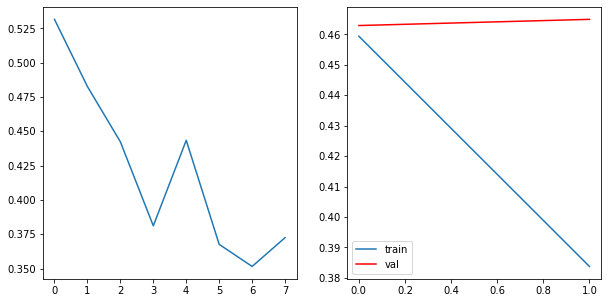

* Epoch 3/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3190, grad_fn=<MeanBackward0>)
tensor(0.3087, grad_fn=<MeanBackward0>)
tensor(0.3430, grad_fn=<MeanBackward0>)
tensor(0.2534, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 0.3060392886400223	         Validation Loss:0.4804082751274109	 \ LR:0.1


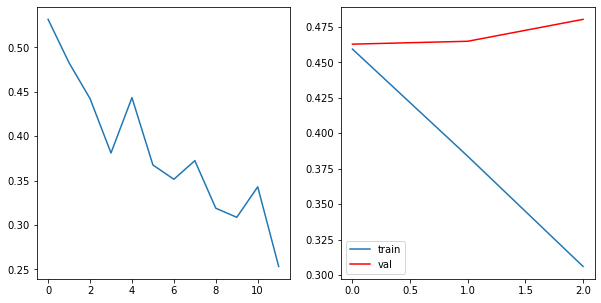

* Epoch 4/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2845, grad_fn=<MeanBackward0>)
tensor(0.2814, grad_fn=<MeanBackward0>)
tensor(0.2405, grad_fn=<MeanBackward0>)
tensor(0.2182, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 0.25616854429244995	         Validation Loss:0.5147255718708038	 \ LR:0.1


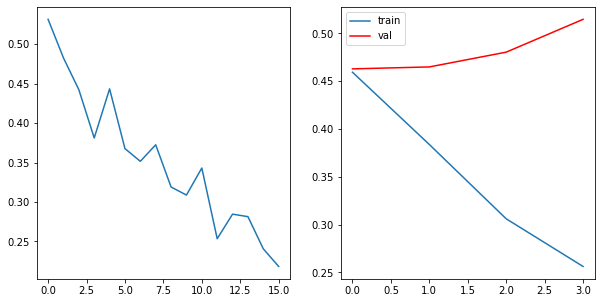

* Epoch 5/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2925, grad_fn=<MeanBackward0>)
tensor(0.2217, grad_fn=<MeanBackward0>)
tensor(0.2381, grad_fn=<MeanBackward0>)
tensor(0.2301, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 0.24562249705195427	         Validation Loss:0.5562648415565491	 \ LR:0.1


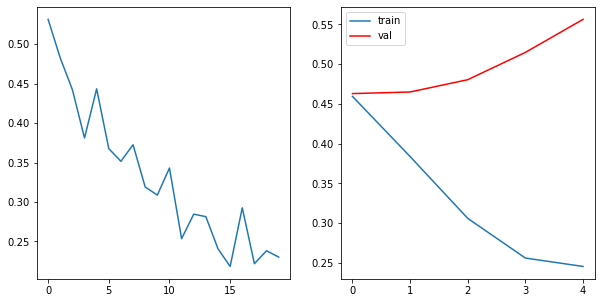

* Epoch 6/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2141, grad_fn=<MeanBackward0>)
tensor(0.2406, grad_fn=<MeanBackward0>)
tensor(0.2706, grad_fn=<MeanBackward0>)
tensor(0.2585, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 0.24594048410654068	         Validation Loss:0.6126043677330018	 \ LR:0.010000000000000002


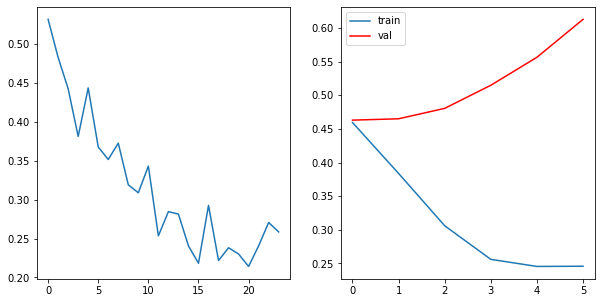

* Epoch 7/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2331, grad_fn=<MeanBackward0>)
tensor(0.2491, grad_fn=<MeanBackward0>)
tensor(0.2503, grad_fn=<MeanBackward0>)
tensor(0.2061, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 0.23464354500174522	         Validation Loss:0.595603609085083	 \ LR:0.010000000000000002


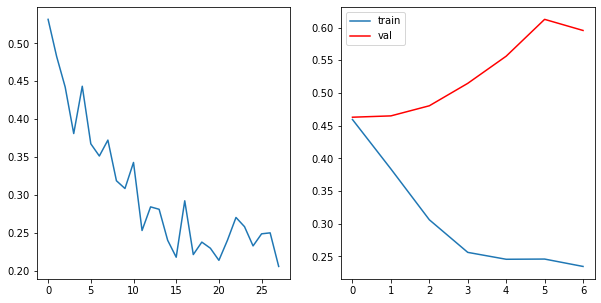

* Epoch 8/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2073, grad_fn=<MeanBackward0>)
tensor(0.2391, grad_fn=<MeanBackward0>)
tensor(0.3101, grad_fn=<MeanBackward0>)
tensor(0.1899, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 0.236610259860754	         Validation Loss:0.6175145506858826	 \ LR:0.010000000000000002


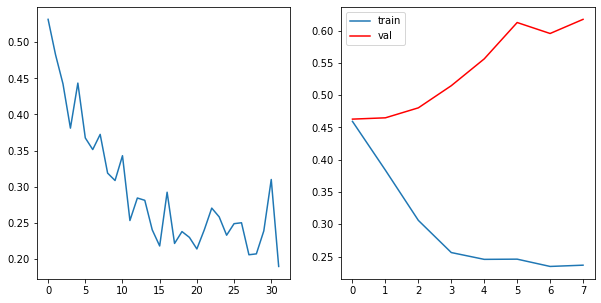

* Epoch 9/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2424, grad_fn=<MeanBackward0>)
tensor(0.2134, grad_fn=<MeanBackward0>)
tensor(0.1703, grad_fn=<MeanBackward0>)
tensor(0.1924, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 0.20461827144026756	         Validation Loss:0.524387800693512	 \ LR:0.010000000000000002


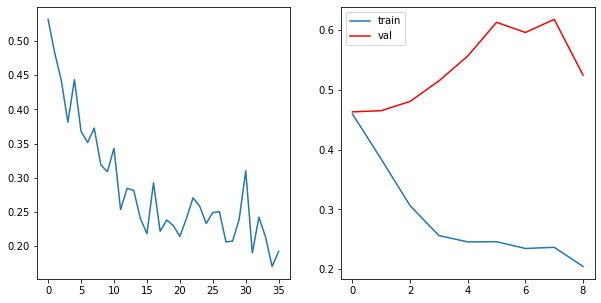

* Epoch 10/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1977, grad_fn=<MeanBackward0>)
tensor(0.1772, grad_fn=<MeanBackward0>)
tensor(0.2036, grad_fn=<MeanBackward0>)
tensor(0.2136, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 0.19804424047470093	         Validation Loss:0.35230098366737367	 \ LR:0.010000000000000002


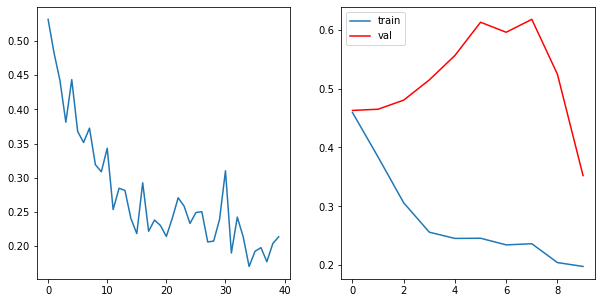

* Epoch 11/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2270, grad_fn=<MeanBackward0>)
tensor(0.1586, grad_fn=<MeanBackward0>)
tensor(0.1901, grad_fn=<MeanBackward0>)
tensor(0.1934, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 0.19231581315398216	         Validation Loss:0.2822892665863037	 \ LR:0.010000000000000002


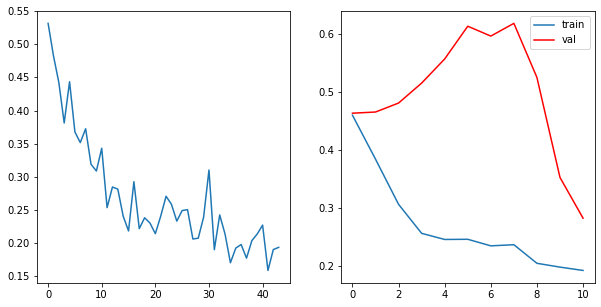

* Epoch 12/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2175, grad_fn=<MeanBackward0>)
tensor(0.1691, grad_fn=<MeanBackward0>)
tensor(0.1894, grad_fn=<MeanBackward0>)
tensor(0.2317, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 0.20191190764307976	         Validation Loss:0.2533829063177109	 \ LR:0.010000000000000002


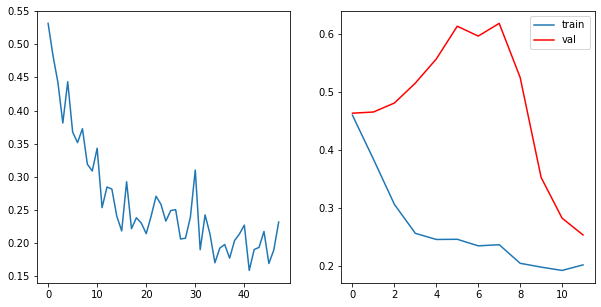

* Epoch 13/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1968, grad_fn=<MeanBackward0>)
tensor(0.2038, grad_fn=<MeanBackward0>)
tensor(0.1711, grad_fn=<MeanBackward0>)
tensor(0.1760, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 0.18693160265684128	         Validation Loss:0.24104149639606476	 \ LR:0.010000000000000002


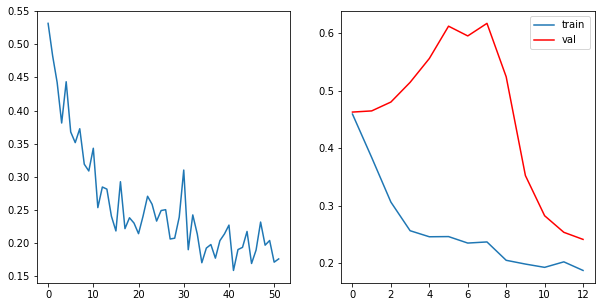

* Epoch 14/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1779, grad_fn=<MeanBackward0>)
tensor(0.2185, grad_fn=<MeanBackward0>)
tensor(0.1918, grad_fn=<MeanBackward0>)
tensor(0.1755, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 0.1909353882074356	         Validation Loss:0.2477798879146576	 \ LR:0.010000000000000002


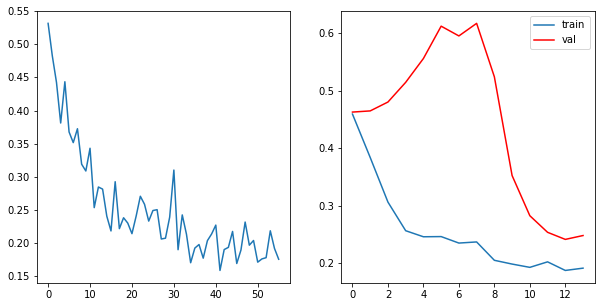

* Epoch 15/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1832, grad_fn=<MeanBackward0>)
tensor(0.2001, grad_fn=<MeanBackward0>)
tensor(0.2100, grad_fn=<MeanBackward0>)
tensor(0.1630, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 0.18908946961164474	         Validation Loss:0.2823866426944733	 \ LR:0.010000000000000002


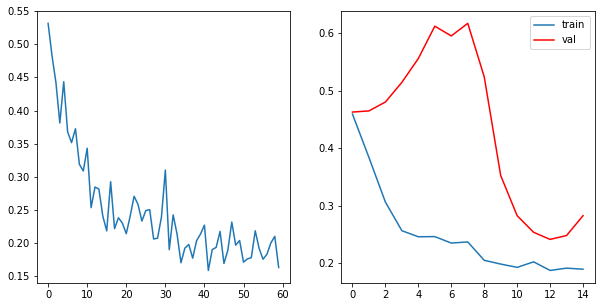

* Epoch 16/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2153, grad_fn=<MeanBackward0>)
tensor(0.1772, grad_fn=<MeanBackward0>)
tensor(0.1625, grad_fn=<MeanBackward0>)
tensor(0.2010, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 0.189003124833107	         Validation Loss:0.35544857382774353	 \ LR:0.010000000000000002


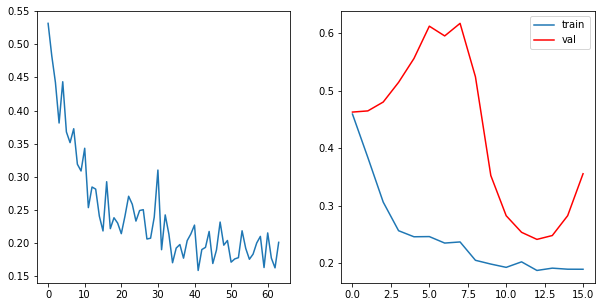

* Epoch 17/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1810, grad_fn=<MeanBackward0>)
tensor(0.1522, grad_fn=<MeanBackward0>)
tensor(0.1742, grad_fn=<MeanBackward0>)
tensor(0.1941, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 0.1753794215619564	         Validation Loss:0.3949168801307678	 \ LR:0.010000000000000002


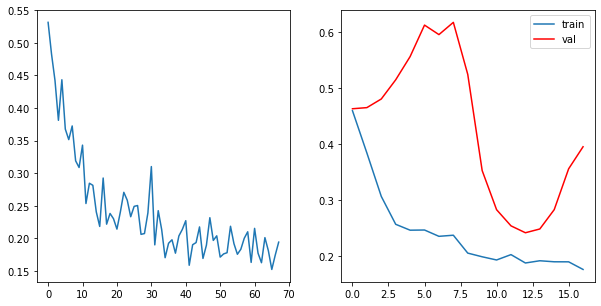

* Epoch 18/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1594, grad_fn=<MeanBackward0>)
tensor(0.1953, grad_fn=<MeanBackward0>)
tensor(0.1903, grad_fn=<MeanBackward0>)
tensor(0.1576, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 0.17564735934138298	         Validation Loss:0.36495516896247865	 \ LR:0.0010000000000000002


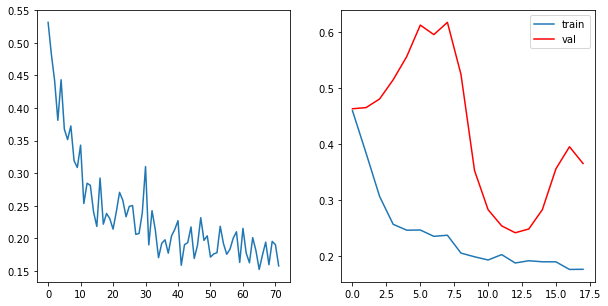

* Epoch 19/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1709, grad_fn=<MeanBackward0>)
tensor(0.1620, grad_fn=<MeanBackward0>)
tensor(0.1893, grad_fn=<MeanBackward0>)
tensor(0.1808, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 0.17578506842255592	         Validation Loss:0.26216713786125184	 \ LR:0.0010000000000000002


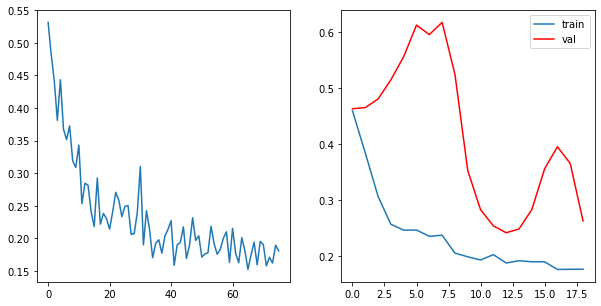

* Epoch 20/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1659, grad_fn=<MeanBackward0>)
tensor(0.1948, grad_fn=<MeanBackward0>)
tensor(0.1715, grad_fn=<MeanBackward0>)
tensor(0.1581, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 0.1725921519100666	         Validation Loss:0.21379140615463257	 \ LR:0.0010000000000000002


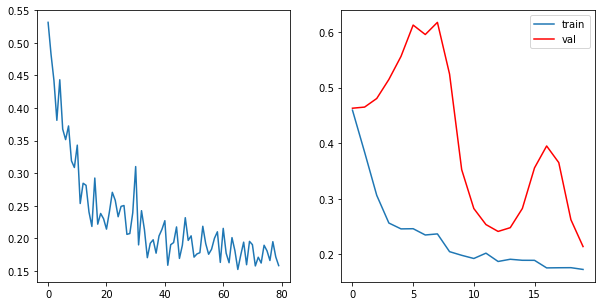

* Epoch 21/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1543, grad_fn=<MeanBackward0>)
tensor(0.1761, grad_fn=<MeanBackward0>)
tensor(0.1924, grad_fn=<MeanBackward0>)
tensor(0.1558, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 0.16965795308351517	         Validation Loss:0.19869505763053893	 \ LR:0.0010000000000000002


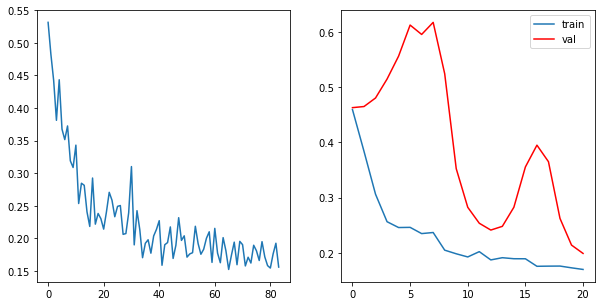

* Epoch 22/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1887, grad_fn=<MeanBackward0>)
tensor(0.1462, grad_fn=<MeanBackward0>)
tensor(0.1510, grad_fn=<MeanBackward0>)
tensor(0.1816, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 0.16689635440707207	         Validation Loss:0.19262852221727372	 \ LR:0.0010000000000000002


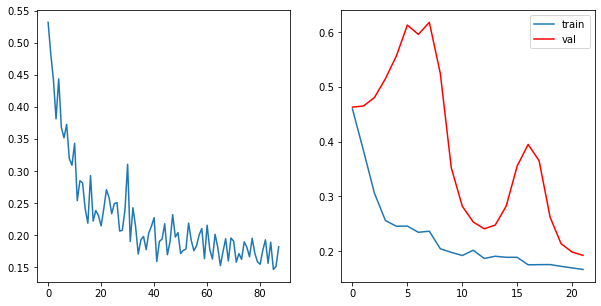

* Epoch 23/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1828, grad_fn=<MeanBackward0>)
tensor(0.1680, grad_fn=<MeanBackward0>)
tensor(0.1597, grad_fn=<MeanBackward0>)
tensor(0.1736, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 0.1710422821342945	         Validation Loss:0.18670452535152435	 \ LR:0.0010000000000000002


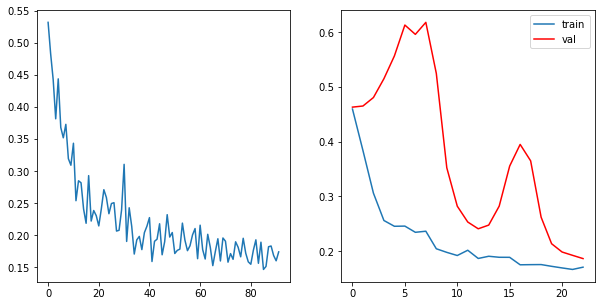

* Epoch 24/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2348, grad_fn=<MeanBackward0>)
tensor(0.1837, grad_fn=<MeanBackward0>)
tensor(0.1415, grad_fn=<MeanBackward0>)
tensor(0.1399, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 0.17496279254555702	         Validation Loss:0.18519482314586638	 \ LR:0.0010000000000000002


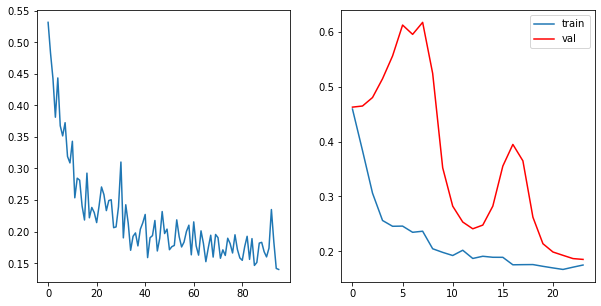

* Epoch 25/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1487, grad_fn=<MeanBackward0>)
tensor(0.1754, grad_fn=<MeanBackward0>)
tensor(0.2101, grad_fn=<MeanBackward0>)
tensor(0.1439, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 0.16954315081238747	         Validation Loss:0.18438475131988524	 \ LR:0.0010000000000000002


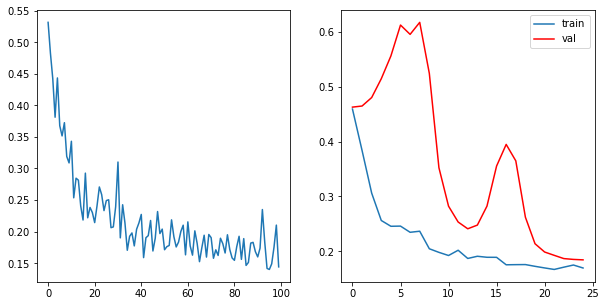

* Epoch 26/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1813, grad_fn=<MeanBackward0>)
tensor(0.1988, grad_fn=<MeanBackward0>)
tensor(0.1180, grad_fn=<MeanBackward0>)
tensor(0.1868, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 0.17123146541416645	         Validation Loss:0.18429007530212402	 \ LR:0.0010000000000000002


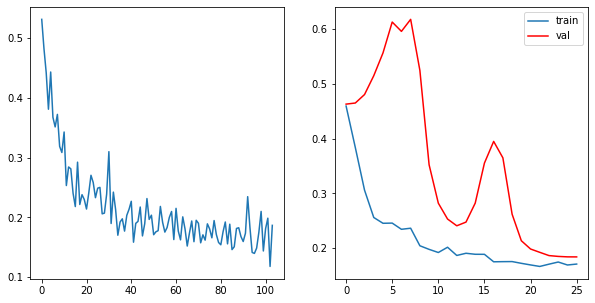

* Epoch 27/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1739, grad_fn=<MeanBackward0>)
tensor(0.1660, grad_fn=<MeanBackward0>)
tensor(0.1651, grad_fn=<MeanBackward0>)
tensor(0.1666, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 0.16788693889975548	         Validation Loss:0.18373597860336305	 \ LR:0.0010000000000000002


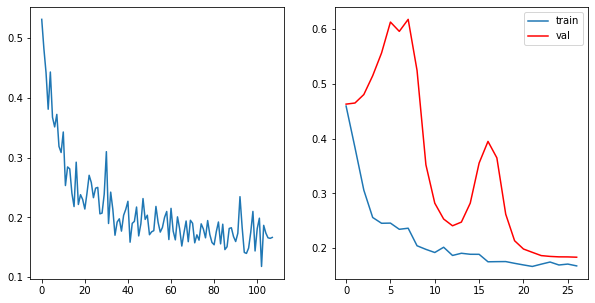

* Epoch 28/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2307, grad_fn=<MeanBackward0>)
tensor(0.1414, grad_fn=<MeanBackward0>)
tensor(0.1711, grad_fn=<MeanBackward0>)
tensor(0.1396, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 0.17070065811276436	         Validation Loss:0.18392521739006043	 \ LR:0.0010000000000000002


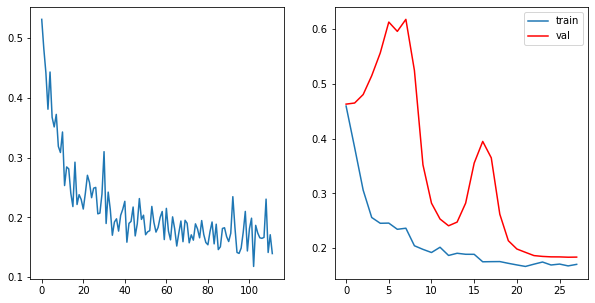

* Epoch 29/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1595, grad_fn=<MeanBackward0>)
tensor(0.1719, grad_fn=<MeanBackward0>)
tensor(0.2365, grad_fn=<MeanBackward0>)
tensor(0.1463, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 0.17852994054555893	         Validation Loss:0.18378636837005616	 \ LR:0.0010000000000000002


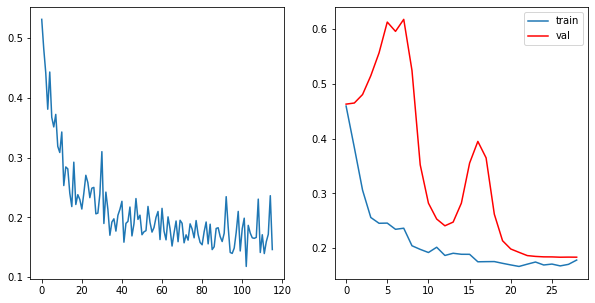

* Epoch 30/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1381, grad_fn=<MeanBackward0>)
tensor(0.1610, grad_fn=<MeanBackward0>)
tensor(0.1602, grad_fn=<MeanBackward0>)
tensor(0.1909, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 0.16253712028265	         Validation Loss:0.18432871848344803	 \ LR:0.0010000000000000002


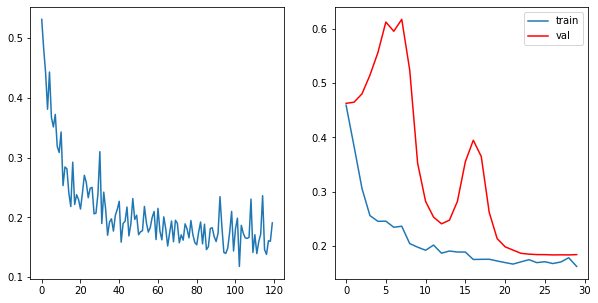

* Epoch 31/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1585, grad_fn=<MeanBackward0>)
tensor(0.1463, grad_fn=<MeanBackward0>)
tensor(0.1974, grad_fn=<MeanBackward0>)
tensor(0.1596, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30	 \Training Loss: 0.1654563583433628	         Validation Loss:0.18635160923004152	 \ LR:0.0010000000000000002


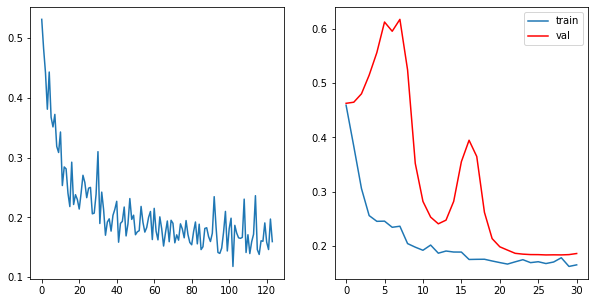

* Epoch 32/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1520, grad_fn=<MeanBackward0>)
tensor(0.1643, grad_fn=<MeanBackward0>)
tensor(0.1372, grad_fn=<MeanBackward0>)
tensor(0.1983, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31	 \Training Loss: 0.1629573404788971	         Validation Loss:0.1864629030227661	 \ LR:0.00010000000000000003


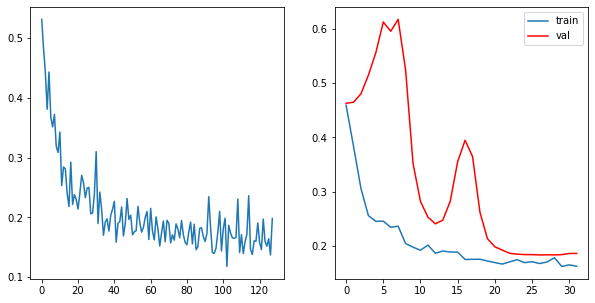

* Epoch 33/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1818, grad_fn=<MeanBackward0>)
tensor(0.1607, grad_fn=<MeanBackward0>)
tensor(0.1338, grad_fn=<MeanBackward0>)
tensor(0.1634, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32	 \Training Loss: 0.15992430225014687	         Validation Loss:0.18566043376922609	 \ LR:0.00010000000000000003


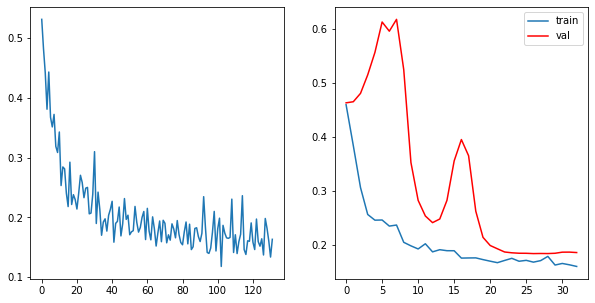

* Epoch 34/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1504, grad_fn=<MeanBackward0>)
tensor(0.1809, grad_fn=<MeanBackward0>)
tensor(0.1758, grad_fn=<MeanBackward0>)
tensor(0.1403, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33	 \Training Loss: 0.16184872388839722	         Validation Loss:0.1853475883603096	 \ LR:0.00010000000000000003


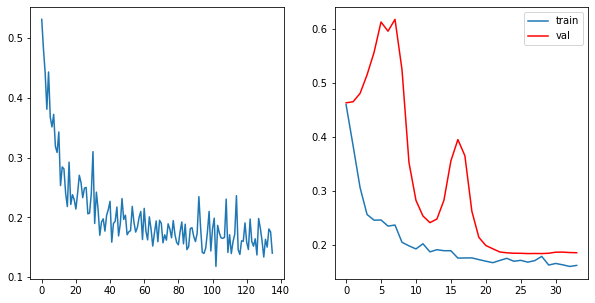

* Epoch 35/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2049, grad_fn=<MeanBackward0>)
tensor(0.1309, grad_fn=<MeanBackward0>)
tensor(0.1629, grad_fn=<MeanBackward0>)
tensor(0.1649, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34	 \Training Loss: 0.16592418774962425	         Validation Loss:0.18544583320617675	 \ LR:0.00010000000000000003


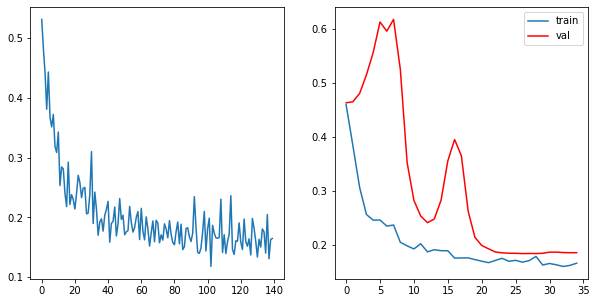

* Epoch 36/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1596, grad_fn=<MeanBackward0>)
tensor(0.1811, grad_fn=<MeanBackward0>)
tensor(0.1630, grad_fn=<MeanBackward0>)
tensor(0.1793, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35	 \Training Loss: 0.17075427249073982	         Validation Loss:0.1852348268032074	 \ LR:0.00010000000000000003


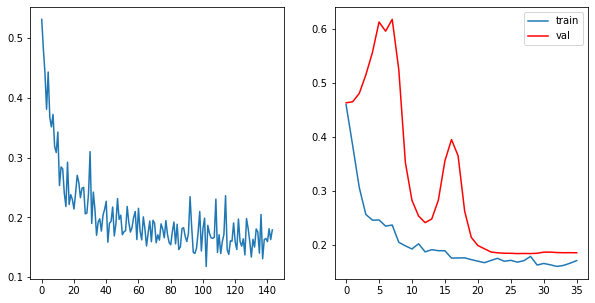

* Epoch 37/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1361, grad_fn=<MeanBackward0>)
tensor(0.1427, grad_fn=<MeanBackward0>)
tensor(0.1533, grad_fn=<MeanBackward0>)
tensor(0.2344, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36	 \Training Loss: 0.16663814708590508	         Validation Loss:0.18535728603601456	 \ LR:1.0000000000000004e-05


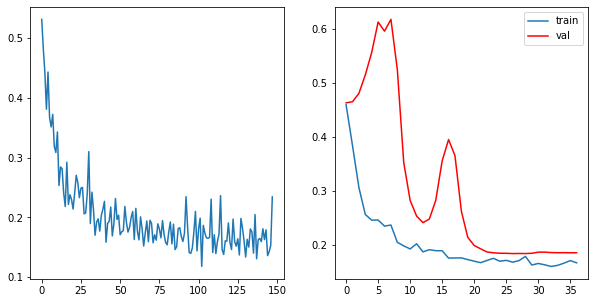

* Epoch 38/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1673, grad_fn=<MeanBackward0>)
tensor(0.1751, grad_fn=<MeanBackward0>)
tensor(0.1871, grad_fn=<MeanBackward0>)
tensor(0.1638, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37	 \Training Loss: 0.17336226254701614	         Validation Loss:0.18508075773715973	 \ LR:1.0000000000000004e-05


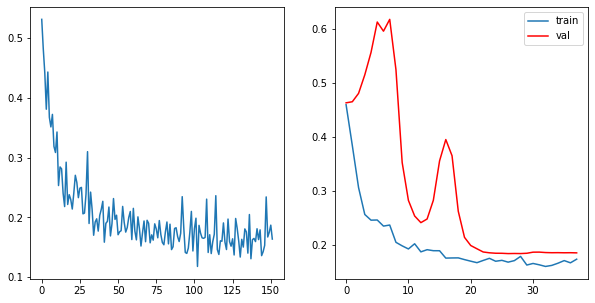

* Epoch 39/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3021, grad_fn=<MeanBackward0>)
tensor(0.1517, grad_fn=<MeanBackward0>)
tensor(0.1932, grad_fn=<MeanBackward0>)
tensor(0.1983, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38	 \Training Loss: 0.211340494453907	         Validation Loss:0.18482038378715515	 \ LR:1.0000000000000004e-05


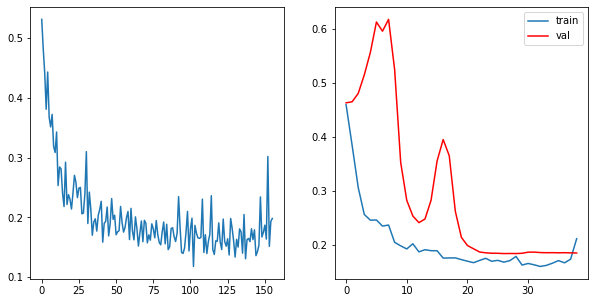

* Epoch 40/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1720, grad_fn=<MeanBackward0>)
tensor(0.1899, grad_fn=<MeanBackward0>)
tensor(0.1666, grad_fn=<MeanBackward0>)
tensor(0.1244, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39	 \Training Loss: 0.16325736045837402	         Validation Loss:0.18476742506027222	 \ LR:1.0000000000000004e-05


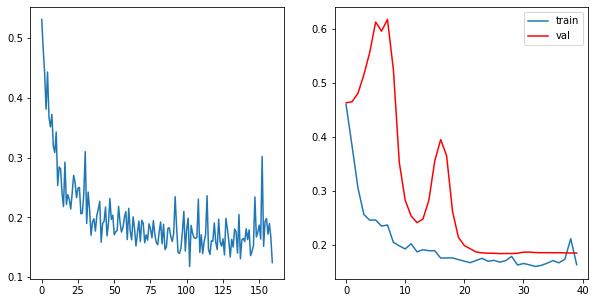

In [64]:
model_focal = SegNet().to(device)

max_epochs = 40
optimaizer = torch.optim.Adam(model_focal.parameters(),  lr=0.1)
scheduler = ReduceLROnPlateau(optimaizer, 'min', patience = 4)
train(model_focal, optimaizer, focal_loss, max_epochs, data_tr, data_val, scheduler)

In [80]:
score_model(model_focal, iou_pytorch, data_val)

0.5620000243186951

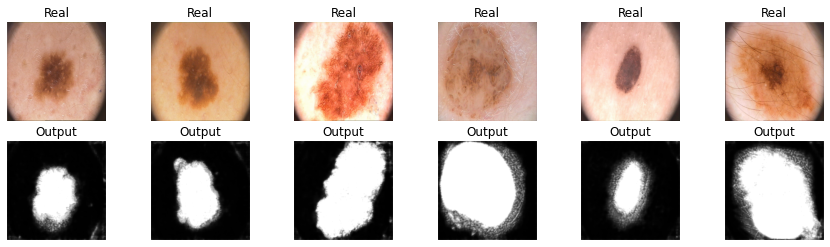

In [67]:
X_val, Y_val = next(iter(data_val))
model_focal.eval()  # testing mode
Y_hat = model_focal(X_val) # detach and put into cpu

        # Visualize tools
clear_output(wait=True)
for k in range(6):
    plt.subplot(2, 6, k+1)
    plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
    plt.title('Real')
    plt.axis('off')

    plt.subplot(2, 6, k+7)
    plt.imshow(Y_hat[k, 0].detach().numpy(), cmap='gray')
    plt.title('Output')
    plt.axis('off')
plt.show()

----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме тако провести численное сравнение с предыдущими функциями.
Какие варианты? 

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Любой другой 

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

In [26]:
def tversky_loss(y_real, y_pred, smooth=1e-8, alpha=0.3, beta=0.7):
    y_pred = torch.squeeze(y_pred,dim=1)
    y_real = torch.squeeze(y_real,dim=1)
    TP = torch.sum(y_pred * y_real) #True Positive
    FP = torch.sum((1-y_real) * y_pred) #False Positive
    FN = torch.sum(y_real * (1-y_pred)) #False Negative

    return 1 - (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  

  0%|          | 0/30 [00:00<?, ?it/s]

* Epoch 1/30


  0%|          | 0/4 [00:00<?, ?it/s]

C:\anaconda3\lib\site-packages\torch\nn\functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


tensor(0.5287, grad_fn=<RsubBackward1>)
tensor(0.5673, grad_fn=<RsubBackward1>)
tensor(0.5373, grad_fn=<RsubBackward1>)
tensor(0.5478, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 0.5452953428030014	         Validation Loss:0.6059118032455444	 \ LR:0.01


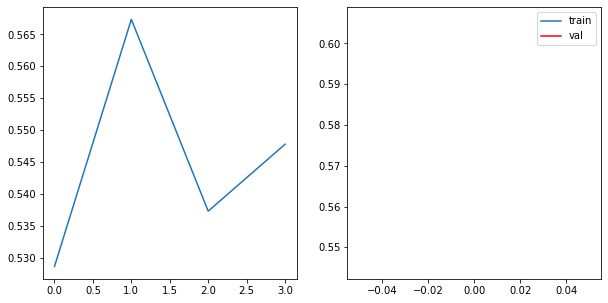

* Epoch 2/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5210, grad_fn=<RsubBackward1>)
tensor(0.5773, grad_fn=<RsubBackward1>)
tensor(0.5344, grad_fn=<RsubBackward1>)
tensor(0.5181, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 0.5376931577920914	         Validation Loss:0.5959291934967041	 \ LR:0.01


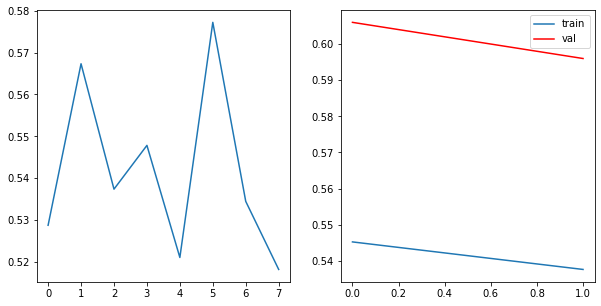

* Epoch 3/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5240, grad_fn=<RsubBackward1>)
tensor(0.5062, grad_fn=<RsubBackward1>)
tensor(0.5218, grad_fn=<RsubBackward1>)
tensor(0.5862, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 0.5345365405082703	         Validation Loss:0.5383513927459717	 \ LR:0.01


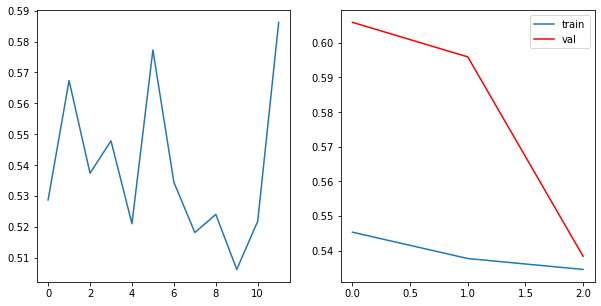

* Epoch 4/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5555, grad_fn=<RsubBackward1>)
tensor(0.5148, grad_fn=<RsubBackward1>)
tensor(0.5354, grad_fn=<RsubBackward1>)
tensor(0.4916, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 0.5243335664272308	         Validation Loss:0.44898446798324587	 \ LR:0.01


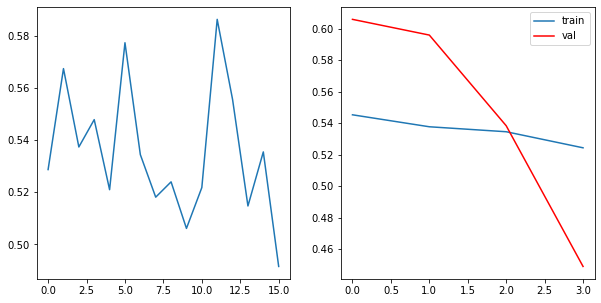

* Epoch 5/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5190, grad_fn=<RsubBackward1>)
tensor(0.5053, grad_fn=<RsubBackward1>)
tensor(0.4631, grad_fn=<RsubBackward1>)
tensor(0.5407, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 0.5070196241140366	         Validation Loss:0.44576798677444457	 \ LR:0.01


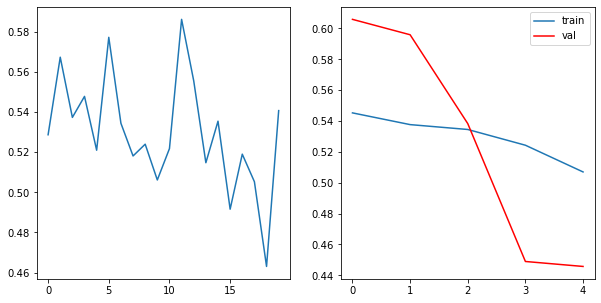

* Epoch 6/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5172, grad_fn=<RsubBackward1>)
tensor(0.4695, grad_fn=<RsubBackward1>)
tensor(0.5279, grad_fn=<RsubBackward1>)
tensor(0.4595, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 0.49350015819072723	         Validation Loss:0.3868147969245911	 \ LR:0.01


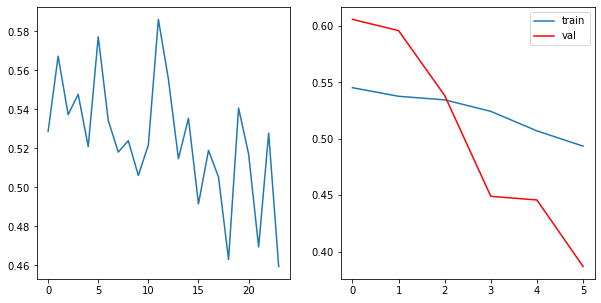

* Epoch 7/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4334, grad_fn=<RsubBackward1>)
tensor(0.4659, grad_fn=<RsubBackward1>)
tensor(0.4927, grad_fn=<RsubBackward1>)
tensor(0.4901, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 0.4705009013414383	         Validation Loss:0.4315823197364807	 \ LR:0.01


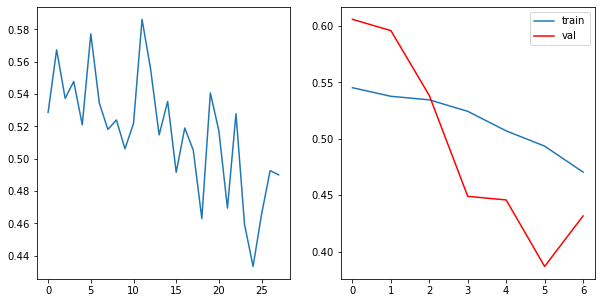

* Epoch 8/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4782, grad_fn=<RsubBackward1>)
tensor(0.4343, grad_fn=<RsubBackward1>)
tensor(0.3945, grad_fn=<RsubBackward1>)
tensor(0.4110, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 0.42951296269893646	         Validation Loss:0.3874414563179016	 \ LR:0.01


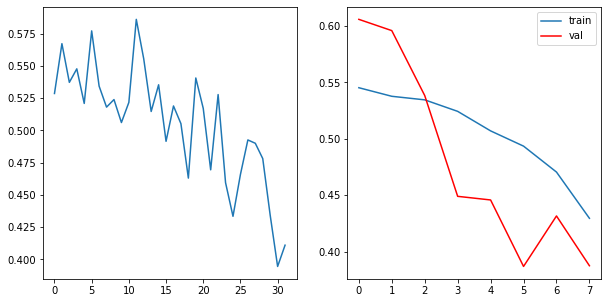

* Epoch 9/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3719, grad_fn=<RsubBackward1>)
tensor(0.3888, grad_fn=<RsubBackward1>)
tensor(0.4010, grad_fn=<RsubBackward1>)
tensor(0.3767, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 0.3845895975828171	         Validation Loss:0.41768722534179686	 \ LR:0.01


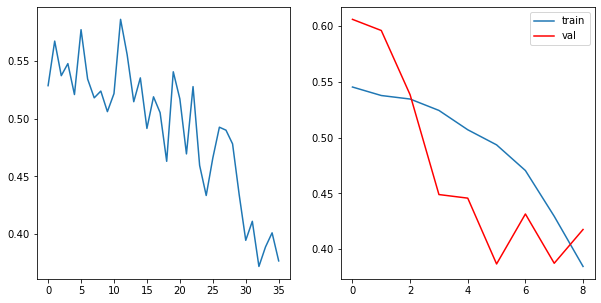

* Epoch 10/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3376, grad_fn=<RsubBackward1>)
tensor(0.3554, grad_fn=<RsubBackward1>)
tensor(0.3661, grad_fn=<RsubBackward1>)
tensor(0.3475, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 0.35165703296661377	         Validation Loss:0.38875954151153563	 \ LR:0.01


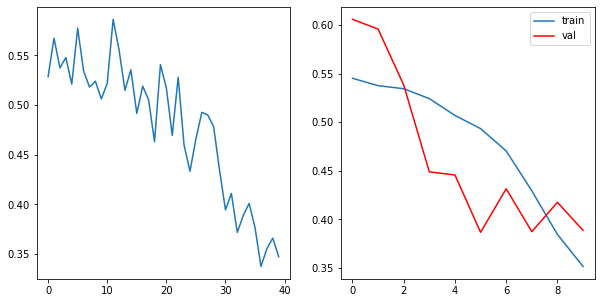

* Epoch 11/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3598, grad_fn=<RsubBackward1>)
tensor(0.3717, grad_fn=<RsubBackward1>)
tensor(0.3212, grad_fn=<RsubBackward1>)
tensor(0.3249, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 0.34437714517116547	         Validation Loss:0.4033345699310303	 \ LR:0.001


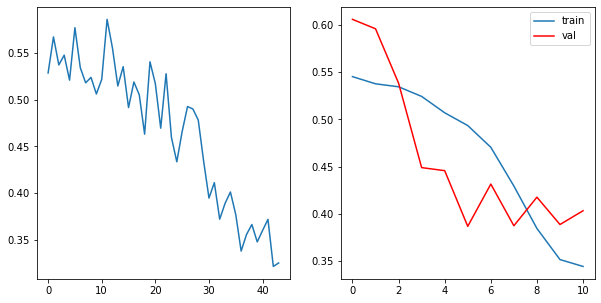

* Epoch 12/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3856, grad_fn=<RsubBackward1>)
tensor(0.3258, grad_fn=<RsubBackward1>)
tensor(0.3038, grad_fn=<RsubBackward1>)
tensor(0.3486, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 0.3409678041934967	         Validation Loss:0.37346320152282714	 \ LR:0.001


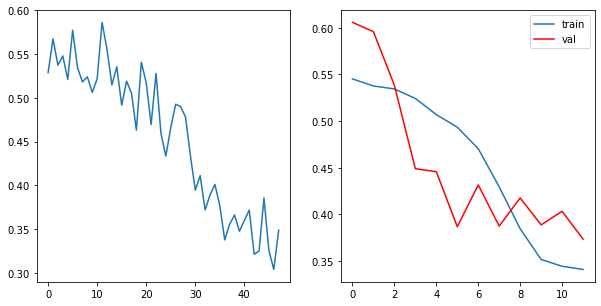

* Epoch 13/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3277, grad_fn=<RsubBackward1>)
tensor(0.2822, grad_fn=<RsubBackward1>)
tensor(0.4155, grad_fn=<RsubBackward1>)
tensor(0.3360, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 0.34035949409008026	         Validation Loss:0.3727195978164673	 \ LR:0.001


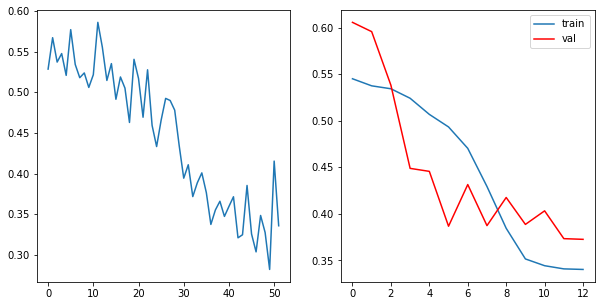

* Epoch 14/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3785, grad_fn=<RsubBackward1>)
tensor(0.3571, grad_fn=<RsubBackward1>)
tensor(0.3025, grad_fn=<RsubBackward1>)
tensor(0.3109, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 0.33724574744701385	         Validation Loss:0.34674283266067507	 \ LR:0.001


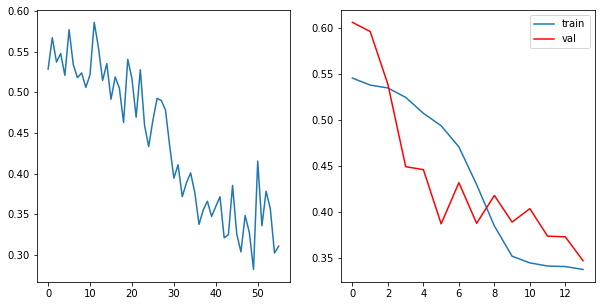

* Epoch 15/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3357, grad_fn=<RsubBackward1>)
tensor(0.3554, grad_fn=<RsubBackward1>)
tensor(0.2737, grad_fn=<RsubBackward1>)
tensor(0.3939, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 0.3396921753883362	         Validation Loss:0.3272963047027588	 \ LR:0.001


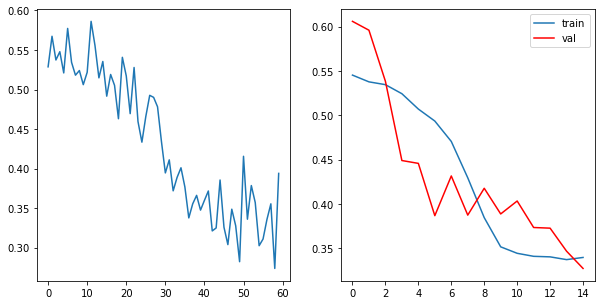

* Epoch 16/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3679, grad_fn=<RsubBackward1>)
tensor(0.3281, grad_fn=<RsubBackward1>)
tensor(0.3304, grad_fn=<RsubBackward1>)
tensor(0.3222, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 0.33713971078395844	         Validation Loss:0.3286972641944885	 \ LR:0.001


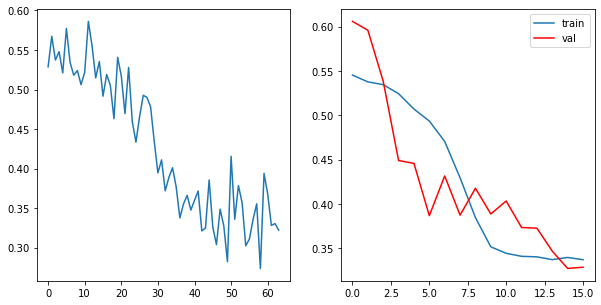

* Epoch 17/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2673, grad_fn=<RsubBackward1>)
tensor(0.3246, grad_fn=<RsubBackward1>)
tensor(0.3875, grad_fn=<RsubBackward1>)
tensor(0.3790, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 0.33956897258758545	         Validation Loss:0.3291494369506836	 \ LR:0.001


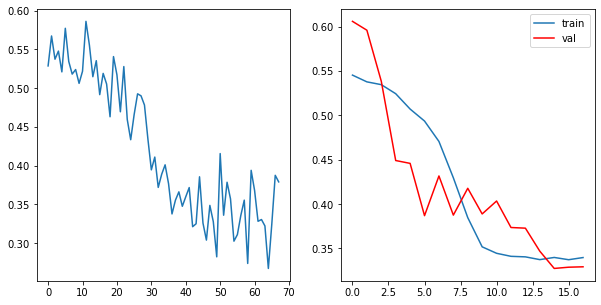

* Epoch 18/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3069, grad_fn=<RsubBackward1>)
tensor(0.3851, grad_fn=<RsubBackward1>)
tensor(0.2805, grad_fn=<RsubBackward1>)
tensor(0.3744, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 0.336718812584877	         Validation Loss:0.3294829368591309	 \ LR:0.001


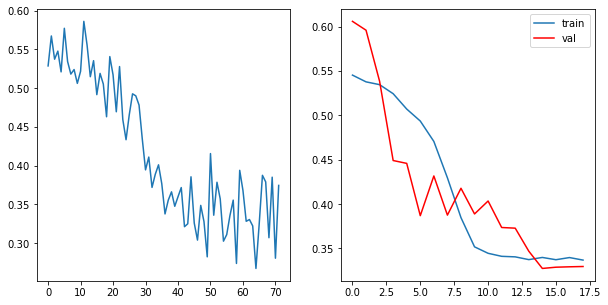

* Epoch 19/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3436, grad_fn=<RsubBackward1>)
tensor(0.3345, grad_fn=<RsubBackward1>)
tensor(0.3227, grad_fn=<RsubBackward1>)
tensor(0.3310, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 0.3329642564058304	         Validation Loss:0.3356172204017639	 \ LR:0.001


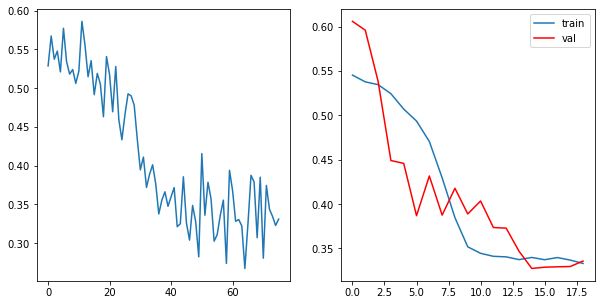

* Epoch 20/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3436, grad_fn=<RsubBackward1>)
tensor(0.3694, grad_fn=<RsubBackward1>)
tensor(0.3617, grad_fn=<RsubBackward1>)
tensor(0.2721, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 0.33671677112579346	         Validation Loss:0.32651581764221194	 \ LR:0.001


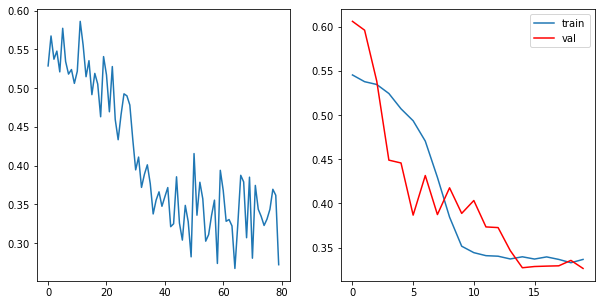

* Epoch 21/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3374, grad_fn=<RsubBackward1>)
tensor(0.3206, grad_fn=<RsubBackward1>)
tensor(0.3219, grad_fn=<RsubBackward1>)
tensor(0.3463, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 0.3315453976392746	         Validation Loss:0.3294838070869446	 \ LR:0.001


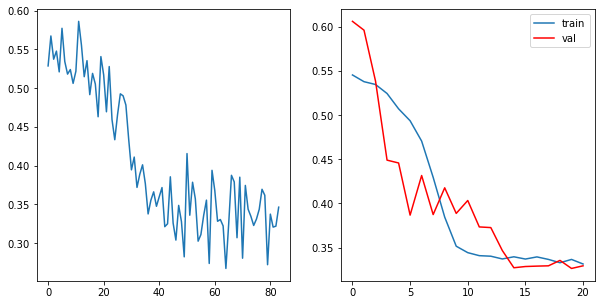

* Epoch 22/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3384, grad_fn=<RsubBackward1>)
tensor(0.3137, grad_fn=<RsubBackward1>)
tensor(0.4166, grad_fn=<RsubBackward1>)
tensor(0.2906, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 0.33981576561927795	         Validation Loss:0.3245049715042114	 \ LR:0.001


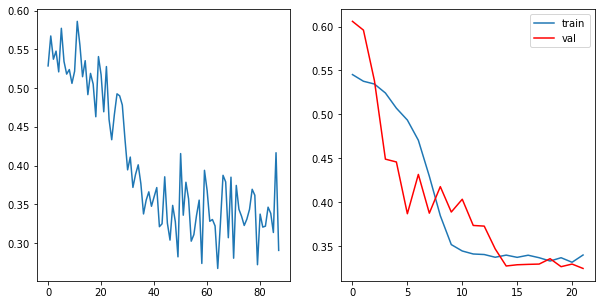

* Epoch 23/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3354, grad_fn=<RsubBackward1>)
tensor(0.3311, grad_fn=<RsubBackward1>)
tensor(0.3456, grad_fn=<RsubBackward1>)
tensor(0.3121, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 0.33105477690696716	         Validation Loss:0.31706379652023314	 \ LR:0.001


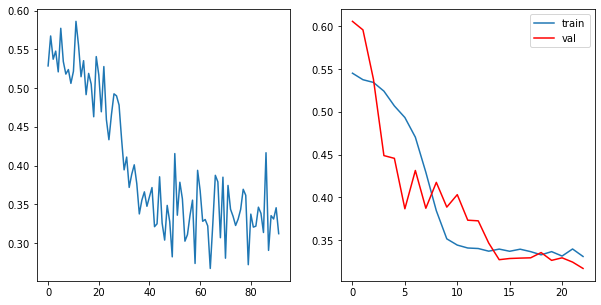

* Epoch 24/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3783, grad_fn=<RsubBackward1>)
tensor(0.3395, grad_fn=<RsubBackward1>)
tensor(0.3002, grad_fn=<RsubBackward1>)
tensor(0.3163, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 0.33355799317359924	         Validation Loss:0.31458148956298826	 \ LR:0.001


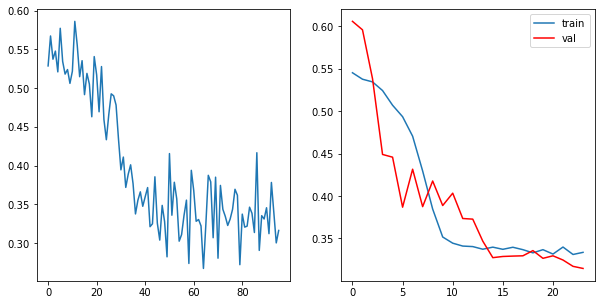

* Epoch 25/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3431, grad_fn=<RsubBackward1>)
tensor(0.3172, grad_fn=<RsubBackward1>)
tensor(0.3359, grad_fn=<RsubBackward1>)
tensor(0.3224, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 0.329667866230011	         Validation Loss:0.31735657453536986	 \ LR:0.001


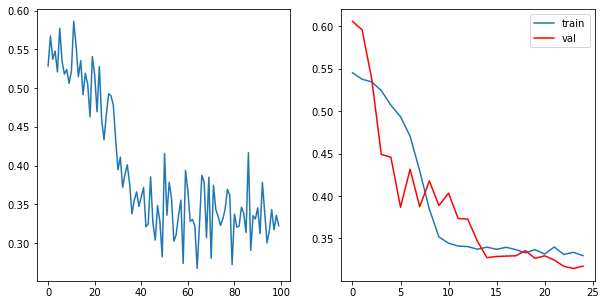

* Epoch 26/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3591, grad_fn=<RsubBackward1>)
tensor(0.2787, grad_fn=<RsubBackward1>)
tensor(0.3441, grad_fn=<RsubBackward1>)
tensor(0.3413, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 0.33079393208026886	         Validation Loss:0.31807130575180054	 \ LR:0.001


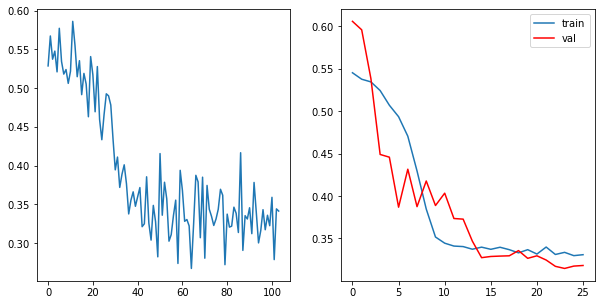

* Epoch 27/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3721, grad_fn=<RsubBackward1>)
tensor(0.2926, grad_fn=<RsubBackward1>)
tensor(0.2926, grad_fn=<RsubBackward1>)
tensor(0.3624, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 0.3299206793308258	         Validation Loss:0.31811708211898804	 \ LR:0.001


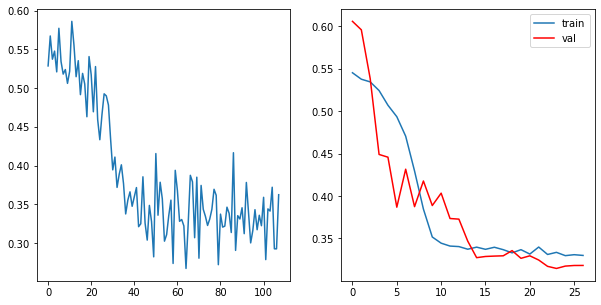

* Epoch 28/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.3475, grad_fn=<RsubBackward1>)
tensor(0.3160, grad_fn=<RsubBackward1>)
tensor(0.2799, grad_fn=<RsubBackward1>)
tensor(0.3762, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 0.32989637553691864	         Validation Loss:0.31457200050354006	 \ LR:0.001


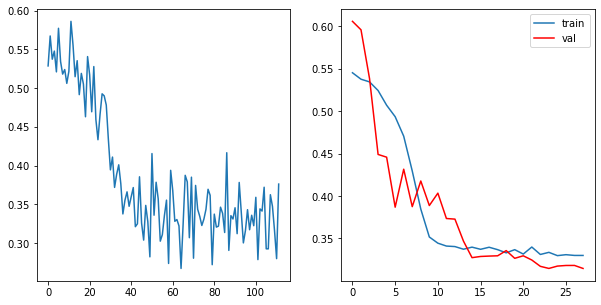

* Epoch 29/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2833, grad_fn=<RsubBackward1>)
tensor(0.3793, grad_fn=<RsubBackward1>)
tensor(0.3292, grad_fn=<RsubBackward1>)
tensor(0.3209, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 0.32816436886787415	         Validation Loss:0.3371978998184204	 \ LR:0.0001


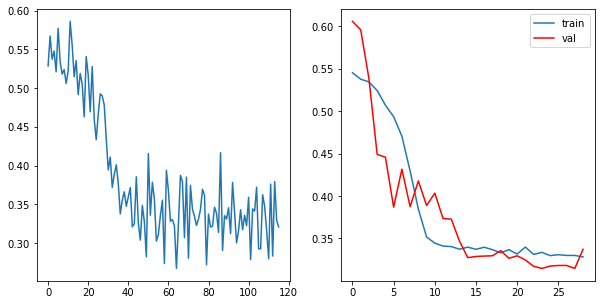

* Epoch 30/30


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2672, grad_fn=<RsubBackward1>)
tensor(0.4043, grad_fn=<RsubBackward1>)
tensor(0.2751, grad_fn=<RsubBackward1>)
tensor(0.4153, grad_fn=<RsubBackward1>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 0.3404652178287506	         Validation Loss:0.3251986265182495	 \ LR:0.0001


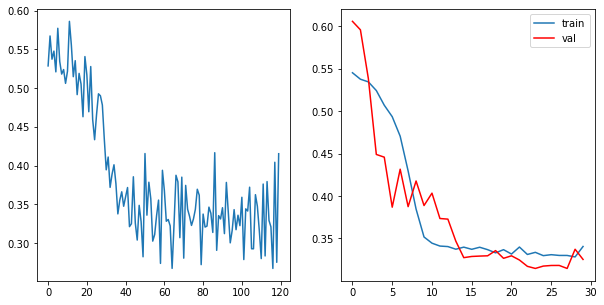

In [28]:
model_tversky = SegNet().to(device)

max_epochs = 30
optimaizer = torch.optim.Adam(model_tversky.parameters(),  lr=0.1)
scheduler = ReduceLROnPlateau(optimaizer, 'min', patience = 4)
train(model_tversky, optimaizer, tversky_loss, max_epochs, data_tr, data_val, scheduler)

In [53]:
score_model(model_tversky, iou_pytorch, data_val)

0.1299999997019768

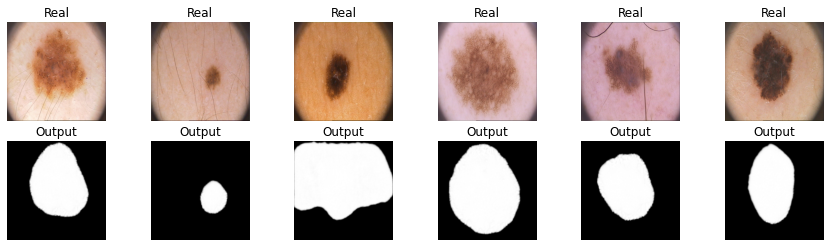

In [32]:
X_val, Y_val = next(iter(data_val))
model_tversky.eval()  # testing mode
Y_hat = model_tversky(X_val) # detach and put into cpu

        # Visualize tools
clear_output(wait=True)
for k in range(6):
    plt.subplot(2, 6, k+1)
    plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
    plt.title('Real')
    plt.axis('off')

    plt.subplot(2, 6, k+7)
    plt.imshow(Y_hat[k, 0].detach().numpy(), cmap='gray')
    plt.title('Output')
    plt.axis('off')
plt.show()

-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

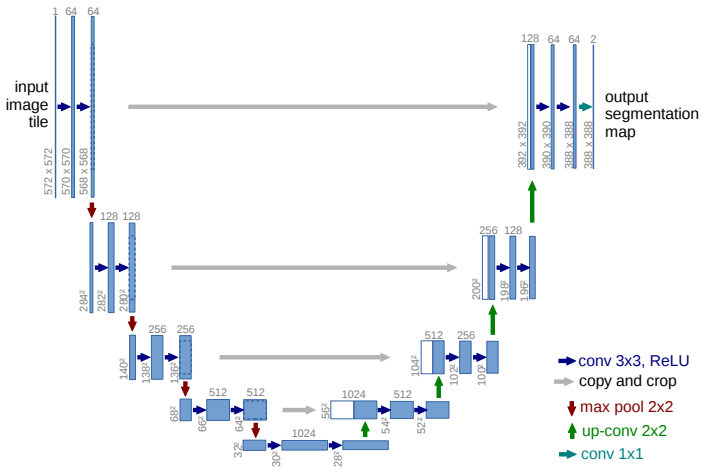

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [17]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.Sigmoid = nn.Sigmoid()
        self.Upsample = nn.Upsample(scale_factor=2)
        self.enc_conv0 = self.conv_block(in_channels=3, out_channels=32)
        self.pool0 =  nn.MaxPool2d(kernel_size=2, stride=2) # 256 -> 128
        self.enc_conv1 = self.conv_block(in_channels=32, out_channels=64)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2) # 128 -> 64
        self.enc_conv2 = self.conv_block(in_channels=64, out_channels=128)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2) # 64 -> 32
        self.enc_conv3 = self.conv_block(in_channels=128, out_channels=256)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = self.conv_block(in_channels=256, out_channels=512)

        # decoder (upsampling)
        self.upsample0 = self.Up_conv_block(in_channels=512, out_channels=256)  # 16 -> 32
        self.dec_conv0 = self.conv_block(in_channels=512, out_channels=256)
        self.upsample1 = self.Up_conv_block(in_channels=256, out_channels=128) # 32 -> 64
        self.dec_conv1 = self.conv_block(in_channels=256, out_channels=128)
        self.upsample2 = self.Up_conv_block(in_channels=128, out_channels=64)  # 64 -> 128
        self.dec_conv2 = self.conv_block(in_channels=128, out_channels=64)
        self.upsample3 = self.Up_conv_block(in_channels=64, out_channels=32)  # 128 -> 256
        self.dec_conv3 = self.conv_block(in_channels=64, out_channels=32)
        self.dec_conv4 = nn.Conv2d(in_channels=32, out_channels=1, kernel_size=1, stride=1)

    def conv_block(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels),
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels))
        return block
    
    def Up_conv_block(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels))
        return block
    
    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)
        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)
        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)
        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(p3)

        # decoder
        up0 = self.upsample0(self.Upsample(b))
        d0 = self.dec_conv0(torch.cat((up0, e3), dim=1))
        up1 = self.upsample1(self.Upsample(d0))
        d1 = self.dec_conv1(torch.cat((up1, e2), dim=1))
        up2 = self.upsample2(self.Upsample(d1))
        d2 = self.dec_conv2(torch.cat((up2, e1), dim=1))
        up3 = self.upsample3(self.Upsample(d2))
        d3 = self.dec_conv3(torch.cat((up3, e0), dim=1))
        d4 = self.Sigmoid(self.dec_conv4(d3))
        return d4

In [18]:
unet_model = UNet()
from torchsummary import summary
summary(unet_model, (3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 32, 256, 256]        --
|    └─Conv2d: 2-1                       [-1, 32, 256, 256]        896
|    └─ReLU: 2-2                         [-1, 32, 256, 256]        --
|    └─BatchNorm2d: 2-3                  [-1, 32, 256, 256]        64
|    └─Conv2d: 2-4                       [-1, 32, 256, 256]        9,248
|    └─ReLU: 2-5                         [-1, 32, 256, 256]        --
|    └─BatchNorm2d: 2-6                  [-1, 32, 256, 256]        64
├─MaxPool2d: 1-2                         [-1, 32, 128, 128]        --
├─Sequential: 1-3                        [-1, 64, 128, 128]        --
|    └─Conv2d: 2-7                       [-1, 64, 128, 128]        18,496
|    └─ReLU: 2-8                         [-1, 64, 128, 128]        --
|    └─BatchNorm2d: 2-9                  [-1, 64, 128, 128]        128
|    └─Conv2d: 2-10                      [-1, 64, 128, 128]        36,928
| 

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 32, 256, 256]        --
|    └─Conv2d: 2-1                       [-1, 32, 256, 256]        896
|    └─ReLU: 2-2                         [-1, 32, 256, 256]        --
|    └─BatchNorm2d: 2-3                  [-1, 32, 256, 256]        64
|    └─Conv2d: 2-4                       [-1, 32, 256, 256]        9,248
|    └─ReLU: 2-5                         [-1, 32, 256, 256]        --
|    └─BatchNorm2d: 2-6                  [-1, 32, 256, 256]        64
├─MaxPool2d: 1-2                         [-1, 32, 128, 128]        --
├─Sequential: 1-3                        [-1, 64, 128, 128]        --
|    └─Conv2d: 2-7                       [-1, 64, 128, 128]        18,496
|    └─ReLU: 2-8                         [-1, 64, 128, 128]        --
|    └─BatchNorm2d: 2-9                  [-1, 64, 128, 128]        128
|    └─Conv2d: 2-10                      [-1, 64, 128, 128]        36,928
| 

In [19]:
unet_model = UNet()

In [20]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
max_epochs = 40
optim = torch.optim.Adam(unet_model.parameters(), lr=0.01)
scheduler = ReduceLROnPlateau(optim, 'min', patience = 4)

  0%|          | 0/40 [00:00<?, ?it/s]

* Epoch 1/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.8046, grad_fn=<MeanBackward0>)
tensor(0.7020, grad_fn=<MeanBackward0>)
tensor(0.7399, grad_fn=<MeanBackward0>)
tensor(0.7009, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 0.7368386834859848	         Validation Loss:0.9752338051795959	 \ LR:0.01


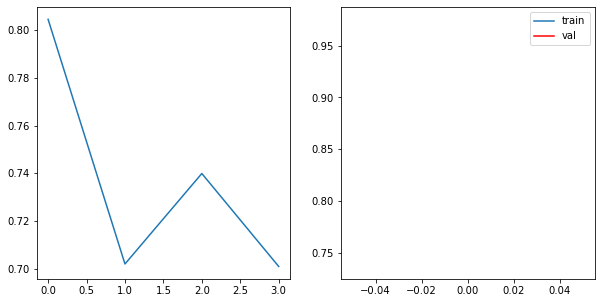

* Epoch 2/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6934, grad_fn=<MeanBackward0>)
tensor(0.6509, grad_fn=<MeanBackward0>)
tensor(0.6707, grad_fn=<MeanBackward0>)
tensor(0.6605, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 0.6688523143529892	         Validation Loss:0.9752338409423829	 \ LR:0.01


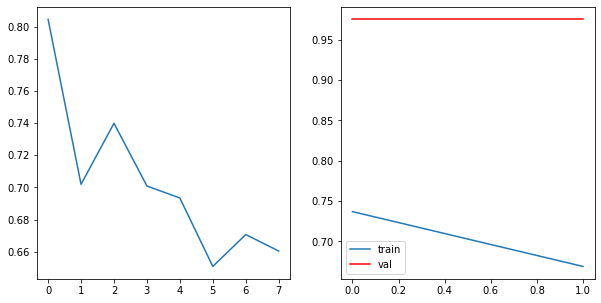

* Epoch 3/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6555, grad_fn=<MeanBackward0>)
tensor(0.6811, grad_fn=<MeanBackward0>)
tensor(0.6107, grad_fn=<MeanBackward0>)
tensor(0.6327, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 0.6449915021657944	         Validation Loss:0.9752338051795959	 \ LR:0.01


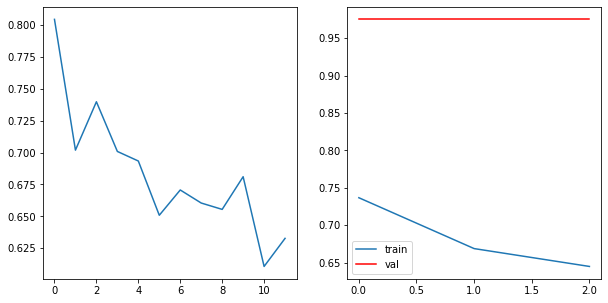

* Epoch 4/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6209, grad_fn=<MeanBackward0>)
tensor(0.6382, grad_fn=<MeanBackward0>)
tensor(0.6253, grad_fn=<MeanBackward0>)
tensor(0.6168, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 0.6252767741680145	         Validation Loss:0.9752310156822205	 \ LR:0.01


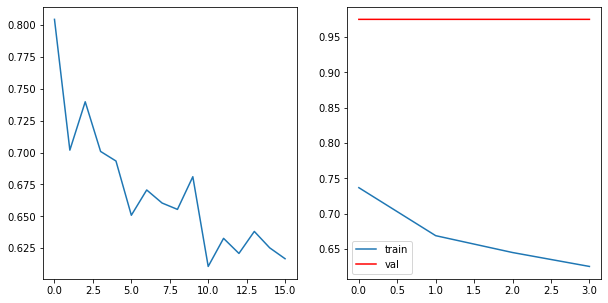

* Epoch 5/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6164, grad_fn=<MeanBackward0>)
tensor(0.6107, grad_fn=<MeanBackward0>)
tensor(0.6206, grad_fn=<MeanBackward0>)
tensor(0.6199, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 0.6169099807739258	         Validation Loss:0.9122185111045837	 \ LR:0.01


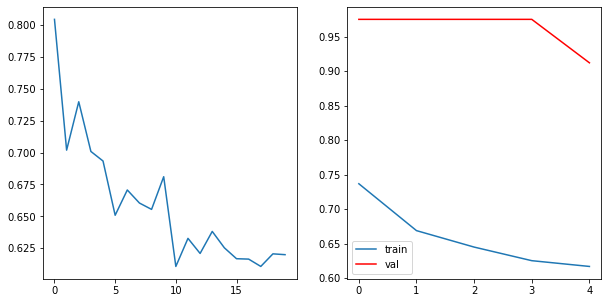

* Epoch 6/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6311, grad_fn=<MeanBackward0>)
tensor(0.6216, grad_fn=<MeanBackward0>)
tensor(0.6107, grad_fn=<MeanBackward0>)
tensor(0.5972, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 0.6151453107595444	         Validation Loss:0.7403647422790527	 \ LR:0.01


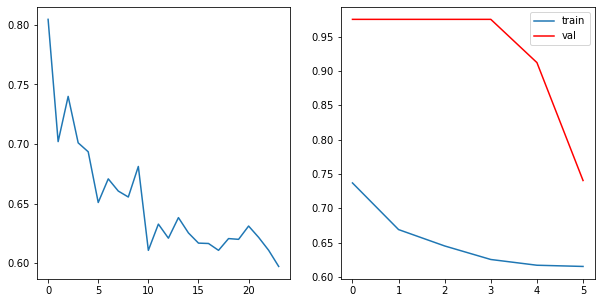

* Epoch 7/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5909, grad_fn=<MeanBackward0>)
tensor(0.6028, grad_fn=<MeanBackward0>)
tensor(0.6294, grad_fn=<MeanBackward0>)
tensor(0.6300, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 0.6132610142230988	         Validation Loss:0.6718388557434082	 \ LR:0.01


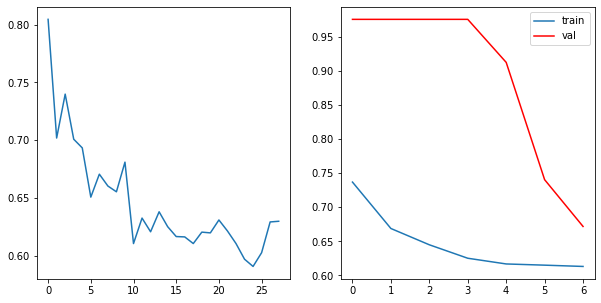

* Epoch 8/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6165, grad_fn=<MeanBackward0>)
tensor(0.6118, grad_fn=<MeanBackward0>)
tensor(0.6207, grad_fn=<MeanBackward0>)
tensor(0.5977, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 0.6116845905780792	         Validation Loss:0.6595095157623291	 \ LR:0.01


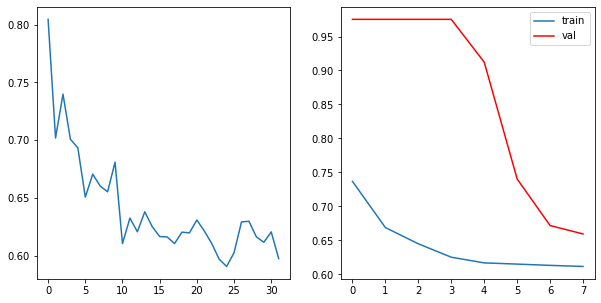

* Epoch 9/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5917, grad_fn=<MeanBackward0>)
tensor(0.6191, grad_fn=<MeanBackward0>)
tensor(0.6082, grad_fn=<MeanBackward0>)
tensor(0.6245, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 0.6108826547861099	         Validation Loss:0.7412650465965271	 \ LR:0.01


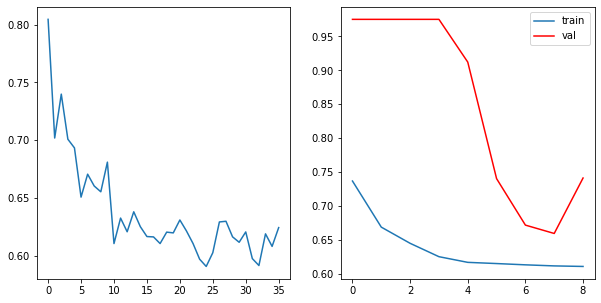

* Epoch 10/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6067, grad_fn=<MeanBackward0>)
tensor(0.6081, grad_fn=<MeanBackward0>)
tensor(0.6079, grad_fn=<MeanBackward0>)
tensor(0.6114, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 0.6085287630558014	         Validation Loss:0.7202033519744873	 \ LR:0.01


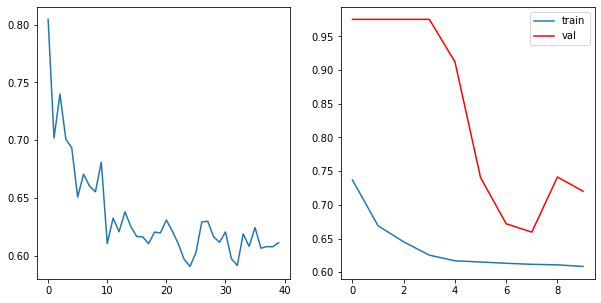

* Epoch 11/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6147, grad_fn=<MeanBackward0>)
tensor(0.6229, grad_fn=<MeanBackward0>)
tensor(0.6177, grad_fn=<MeanBackward0>)
tensor(0.6074, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 0.6156828105449677	         Validation Loss:0.6555832266807556	 \ LR:0.01


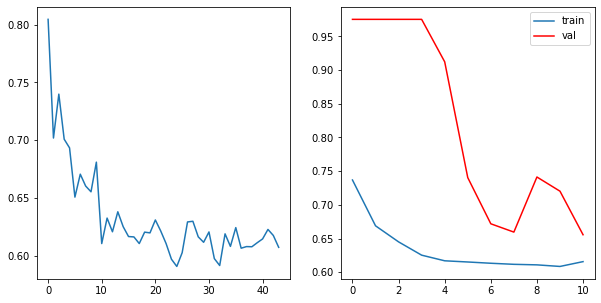

* Epoch 12/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6175, grad_fn=<MeanBackward0>)
tensor(0.6143, grad_fn=<MeanBackward0>)
tensor(0.6134, grad_fn=<MeanBackward0>)
tensor(0.6115, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 0.6141620874404907	         Validation Loss:0.6322772383689881	 \ LR:0.01


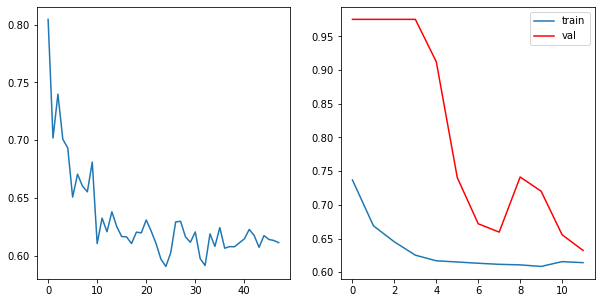

* Epoch 13/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6314, grad_fn=<MeanBackward0>)
tensor(0.6070, grad_fn=<MeanBackward0>)
tensor(0.5856, grad_fn=<MeanBackward0>)
tensor(0.6251, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 0.6122927069664001	         Validation Loss:0.6084564805030823	 \ LR:0.01


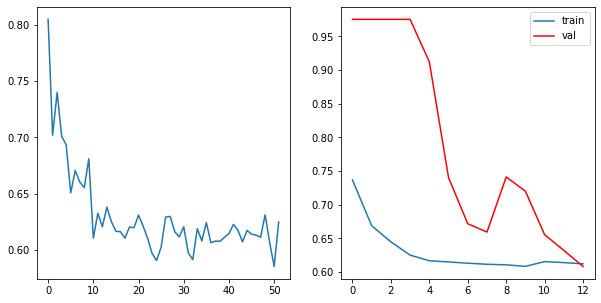

* Epoch 14/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6076, grad_fn=<MeanBackward0>)
tensor(0.6062, grad_fn=<MeanBackward0>)
tensor(0.6006, grad_fn=<MeanBackward0>)
tensor(0.6159, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 0.6075688749551773	         Validation Loss:0.6146756052970886	 \ LR:0.01


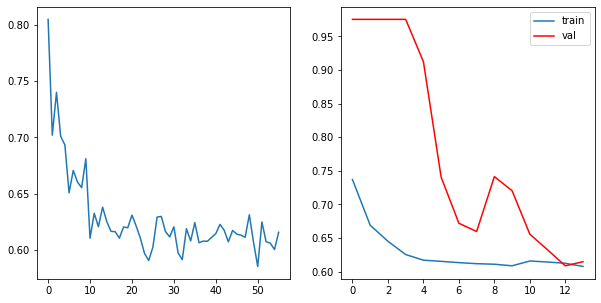

* Epoch 15/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5984, grad_fn=<MeanBackward0>)
tensor(0.6160, grad_fn=<MeanBackward0>)
tensor(0.6375, grad_fn=<MeanBackward0>)
tensor(0.6000, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 0.6129589974880219	         Validation Loss:0.6132297277450561	 \ LR:0.01


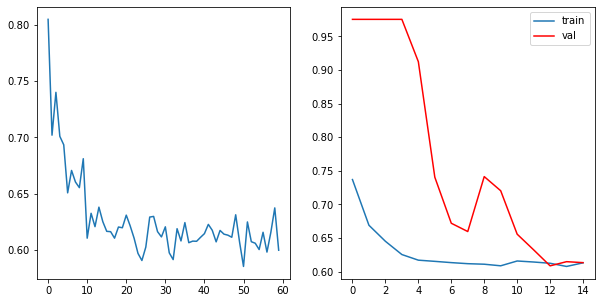

* Epoch 16/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5962, grad_fn=<MeanBackward0>)
tensor(0.6091, grad_fn=<MeanBackward0>)
tensor(0.6155, grad_fn=<MeanBackward0>)
tensor(0.6153, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 0.6090129464864731	         Validation Loss:0.6135912895202636	 \ LR:0.01


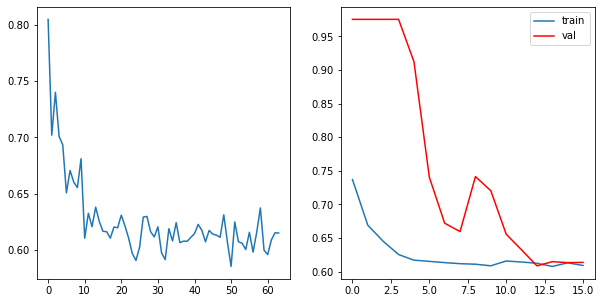

* Epoch 17/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6029, grad_fn=<MeanBackward0>)
tensor(0.6596, grad_fn=<MeanBackward0>)
tensor(0.6048, grad_fn=<MeanBackward0>)
tensor(0.5962, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 0.6158820539712906	         Validation Loss:0.6243814110755921	 \ LR:0.01


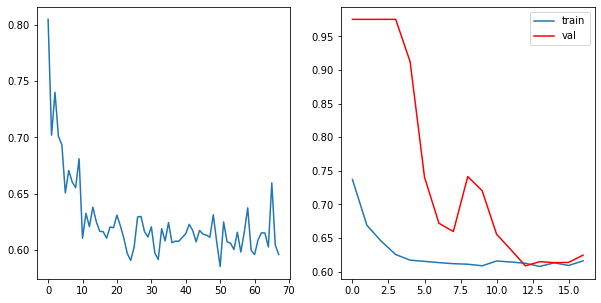

* Epoch 18/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5958, grad_fn=<MeanBackward0>)
tensor(0.5934, grad_fn=<MeanBackward0>)
tensor(0.6327, grad_fn=<MeanBackward0>)
tensor(0.6031, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 0.6062839031219482	         Validation Loss:0.6017433762550354	 \ LR:0.01


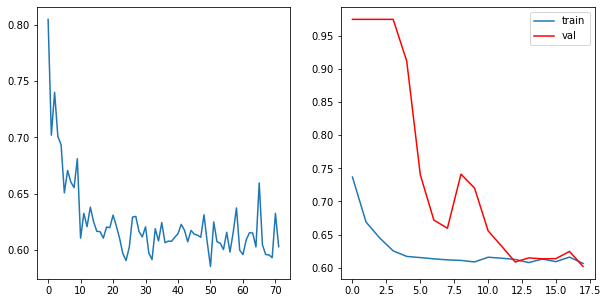

* Epoch 19/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6076, grad_fn=<MeanBackward0>)
tensor(0.5992, grad_fn=<MeanBackward0>)
tensor(0.6218, grad_fn=<MeanBackward0>)
tensor(0.5949, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 0.6058694869279861	         Validation Loss:0.6012233138084412	 \ LR:0.01


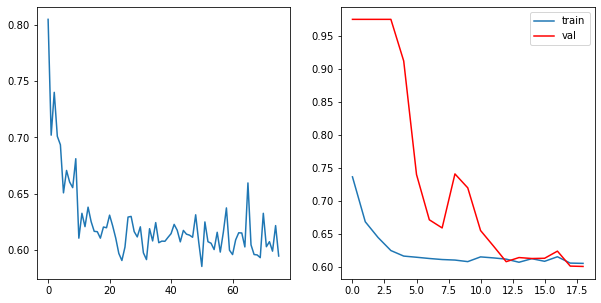

* Epoch 20/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6037, grad_fn=<MeanBackward0>)
tensor(0.6132, grad_fn=<MeanBackward0>)
tensor(0.5939, grad_fn=<MeanBackward0>)
tensor(0.5994, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 0.6025354713201523	         Validation Loss:0.6506633520126343	 \ LR:0.01


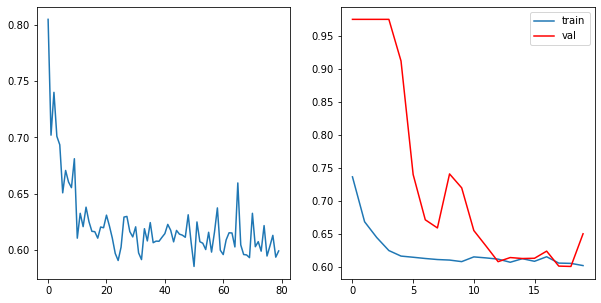

* Epoch 21/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6140, grad_fn=<MeanBackward0>)
tensor(0.5903, grad_fn=<MeanBackward0>)
tensor(0.6070, grad_fn=<MeanBackward0>)
tensor(0.6072, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 0.6046229004859924	         Validation Loss:0.6246308445930481	 \ LR:0.01


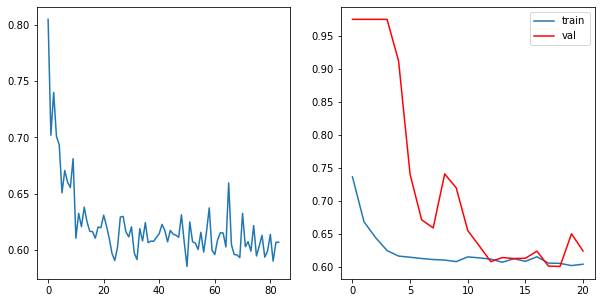

* Epoch 22/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5865, grad_fn=<MeanBackward0>)
tensor(0.6331, grad_fn=<MeanBackward0>)
tensor(0.6074, grad_fn=<MeanBackward0>)
tensor(0.6020, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 0.6072317212820053	         Validation Loss:0.6354345202445983	 \ LR:0.01


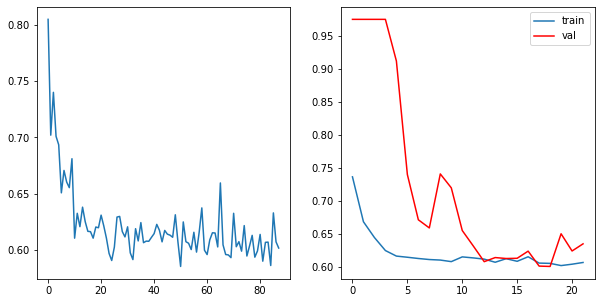

* Epoch 23/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6198, grad_fn=<MeanBackward0>)
tensor(0.6088, grad_fn=<MeanBackward0>)
tensor(0.6086, grad_fn=<MeanBackward0>)
tensor(0.5986, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 0.6089625358581543	         Validation Loss:0.6260748028755188	 \ LR:0.01


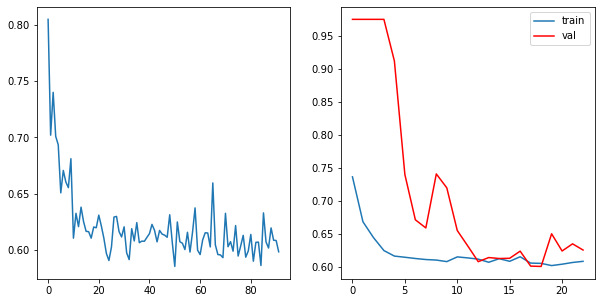

* Epoch 24/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6126, grad_fn=<MeanBackward0>)
tensor(0.6026, grad_fn=<MeanBackward0>)
tensor(0.6234, grad_fn=<MeanBackward0>)
tensor(0.5934, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 0.6079908609390259	         Validation Loss:0.6243083119392395	 \ LR:0.001


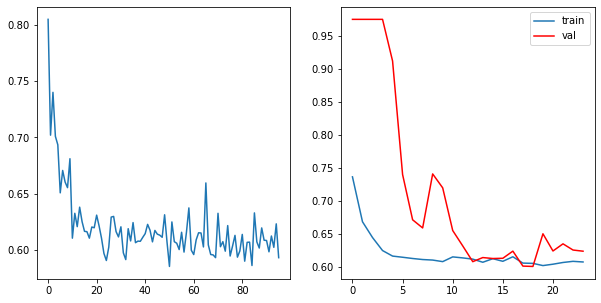

* Epoch 25/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6011, grad_fn=<MeanBackward0>)
tensor(0.5939, grad_fn=<MeanBackward0>)
tensor(0.6001, grad_fn=<MeanBackward0>)
tensor(0.6322, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 0.6068333983421326	         Validation Loss:0.6103010177612305	 \ LR:0.001


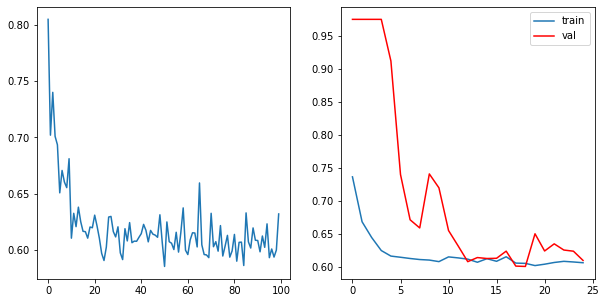

* Epoch 26/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6020, grad_fn=<MeanBackward0>)
tensor(0.6033, grad_fn=<MeanBackward0>)
tensor(0.5978, grad_fn=<MeanBackward0>)
tensor(0.6098, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25	 \Training Loss: 0.6031998544931412	         Validation Loss:0.6019277334213257	 \ LR:0.001


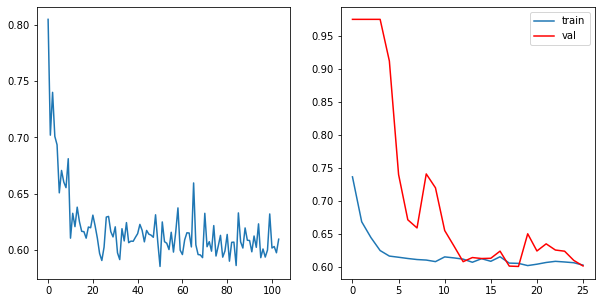

* Epoch 27/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6033, grad_fn=<MeanBackward0>)
tensor(0.6060, grad_fn=<MeanBackward0>)
tensor(0.5955, grad_fn=<MeanBackward0>)
tensor(0.6004, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26	 \Training Loss: 0.6012832522392273	         Validation Loss:0.5980262637138367	 \ LR:0.001


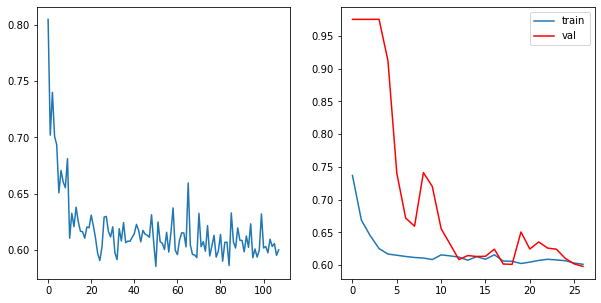

* Epoch 28/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6034, grad_fn=<MeanBackward0>)
tensor(0.5991, grad_fn=<MeanBackward0>)
tensor(0.5952, grad_fn=<MeanBackward0>)
tensor(0.6047, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27	 \Training Loss: 0.6006040275096893	         Validation Loss:0.5962146878242492	 \ LR:0.001


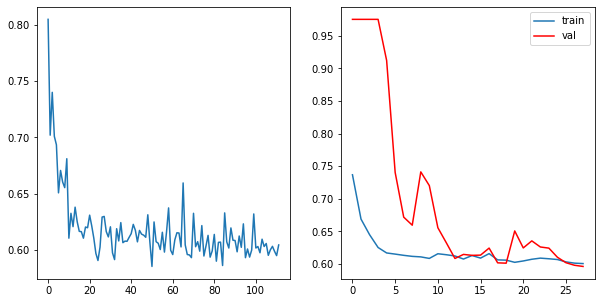

* Epoch 29/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5865, grad_fn=<MeanBackward0>)
tensor(0.6330, grad_fn=<MeanBackward0>)
tensor(0.5901, grad_fn=<MeanBackward0>)
tensor(0.6092, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28	 \Training Loss: 0.6047285497188568	         Validation Loss:0.5953397870063781	 \ LR:0.001


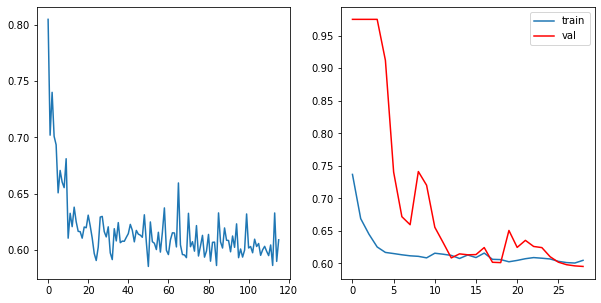

* Epoch 30/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6235, grad_fn=<MeanBackward0>)
tensor(0.5914, grad_fn=<MeanBackward0>)
tensor(0.5921, grad_fn=<MeanBackward0>)
tensor(0.5956, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29	 \Training Loss: 0.6006502956151962	         Validation Loss:0.5951983571052551	 \ LR:0.001


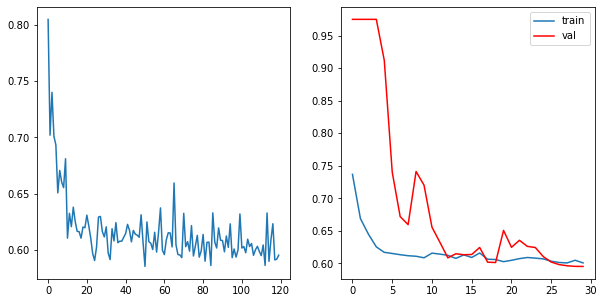

* Epoch 31/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5871, grad_fn=<MeanBackward0>)
tensor(0.5967, grad_fn=<MeanBackward0>)
tensor(0.6109, grad_fn=<MeanBackward0>)
tensor(0.6105, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30	 \Training Loss: 0.6013319492340088	         Validation Loss:0.5949144721031189	 \ LR:0.001


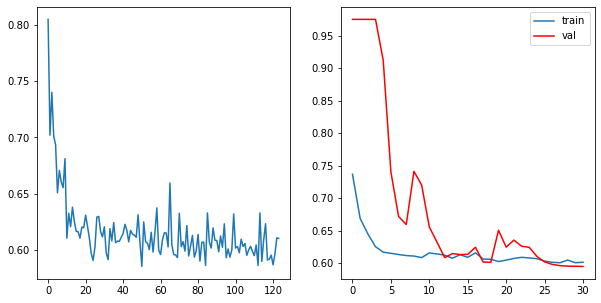

* Epoch 32/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6050, grad_fn=<MeanBackward0>)
tensor(0.6153, grad_fn=<MeanBackward0>)
tensor(0.5935, grad_fn=<MeanBackward0>)
tensor(0.5909, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31	 \Training Loss: 0.6011789590120316	         Validation Loss:0.5950809597969056	 \ LR:0.001


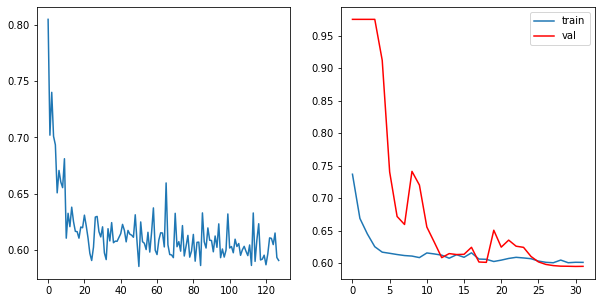

* Epoch 33/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6173, grad_fn=<MeanBackward0>)
tensor(0.5946, grad_fn=<MeanBackward0>)
tensor(0.5939, grad_fn=<MeanBackward0>)
tensor(0.5891, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32	 \Training Loss: 0.598737895488739	         Validation Loss:0.5949077367782593	 \ LR:0.001


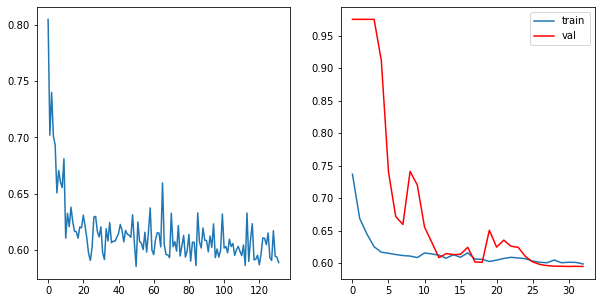

* Epoch 34/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5950, grad_fn=<MeanBackward0>)
tensor(0.6255, grad_fn=<MeanBackward0>)
tensor(0.5791, grad_fn=<MeanBackward0>)
tensor(0.6040, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33	 \Training Loss: 0.6008920222520828	         Validation Loss:0.5942805767059326	 \ LR:0.001


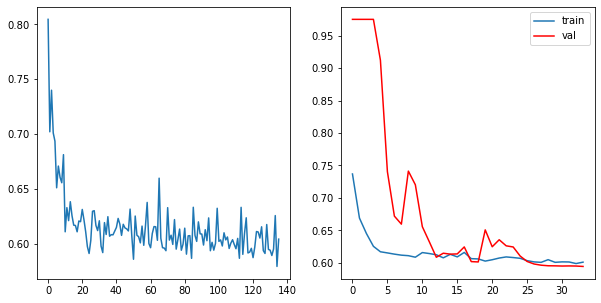

* Epoch 35/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6152, grad_fn=<MeanBackward0>)
tensor(0.5764, grad_fn=<MeanBackward0>)
tensor(0.6037, grad_fn=<MeanBackward0>)
tensor(0.6071, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34	 \Training Loss: 0.6005913466215134	         Validation Loss:0.5940019369125367	 \ LR:0.001


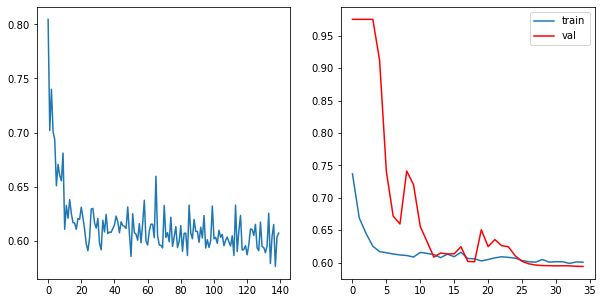

* Epoch 36/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5971, grad_fn=<MeanBackward0>)
tensor(0.6118, grad_fn=<MeanBackward0>)
tensor(0.5967, grad_fn=<MeanBackward0>)
tensor(0.5889, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35	 \Training Loss: 0.5986144542694092	         Validation Loss:0.5940688490867615	 \ LR:0.001


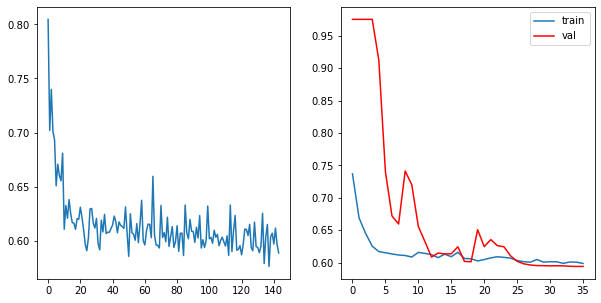

* Epoch 37/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6011, grad_fn=<MeanBackward0>)
tensor(0.6117, grad_fn=<MeanBackward0>)
tensor(0.5835, grad_fn=<MeanBackward0>)
tensor(0.5938, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36	 \Training Loss: 0.5975180715322495	         Validation Loss:0.5942127108573914	 \ LR:0.001


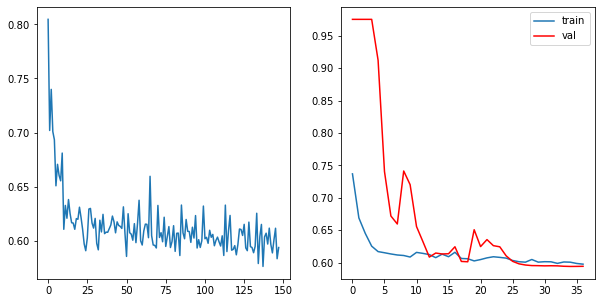

* Epoch 38/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6024, grad_fn=<MeanBackward0>)
tensor(0.5903, grad_fn=<MeanBackward0>)
tensor(0.5952, grad_fn=<MeanBackward0>)
tensor(0.6043, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37	 \Training Loss: 0.5980428606271744	         Validation Loss:0.5937260508537292	 \ LR:0.001


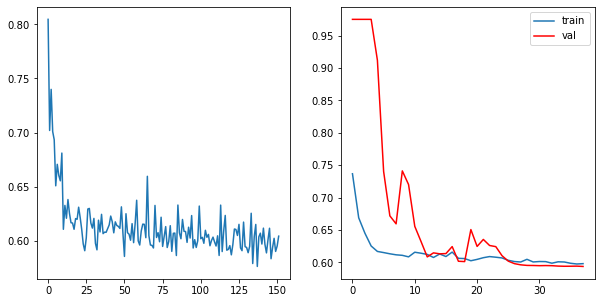

* Epoch 39/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6040, grad_fn=<MeanBackward0>)
tensor(0.6170, grad_fn=<MeanBackward0>)
tensor(0.5842, grad_fn=<MeanBackward0>)
tensor(0.5879, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38	 \Training Loss: 0.5982570499181747	         Validation Loss:0.5937000274658203	 \ LR:0.001


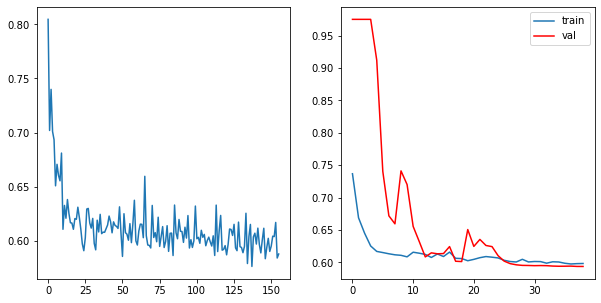

* Epoch 40/40


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6022, grad_fn=<MeanBackward0>)
tensor(0.5887, grad_fn=<MeanBackward0>)
tensor(0.6078, grad_fn=<MeanBackward0>)
tensor(0.5879, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39	 \Training Loss: 0.5966530591249466	         Validation Loss:0.5935006141662598	 \ LR:0.001


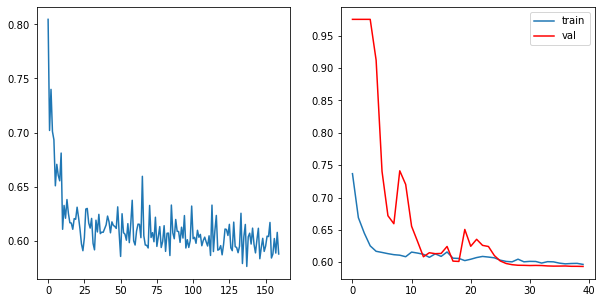

In [21]:
train(unet_model, optim, bce_loss, max_epochs, data_tr, data_val, scheduler)

In [23]:
score_model(unet_model, iou_pytorch, data_val)

0.7020000100135804

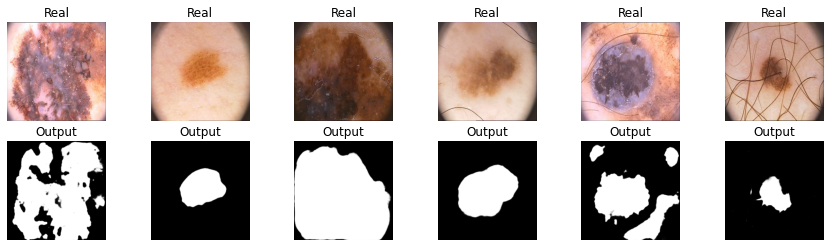

In [25]:
X_val, Y_val = next(iter(data_val))
unet_model.eval()  # testing mode
Y_hat = unet_model(X_val) # detach and put into cpu

        # Visualize tools
clear_output(wait=True)
for k in range(6):
    plt.subplot(2, 6, k+1)
    plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
    plt.title('Real')
    plt.axis('off')

    plt.subplot(2, 6, k+7)
    plt.imshow(Y_hat[k, 0].detach().numpy(), cmap='gray')
    plt.title('Output')
    plt.axis('off')
plt.show()

Возьмем focal loss

In [36]:
unet_model_focal = UNet()

In [37]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
max_epochs = 25
optim = torch.optim.Adam(unet_model_focal.parameters(), lr=0.01)
scheduler = ReduceLROnPlateau(optim, 'min', patience = 4)

  0%|          | 0/25 [00:00<?, ?it/s]

* Epoch 1/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5573, grad_fn=<MeanBackward0>)
tensor(0.7165, grad_fn=<MeanBackward0>)
tensor(0.5896, grad_fn=<MeanBackward0>)
tensor(0.5387, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 0.6005276143550873	         Validation Loss:nan	 \ LR:0.01


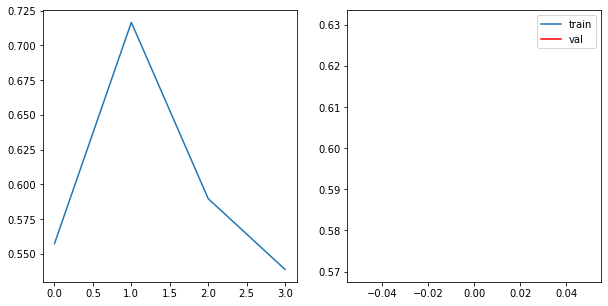

* Epoch 2/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.4614, grad_fn=<MeanBackward0>)
tensor(0.3336, grad_fn=<MeanBackward0>)
tensor(0.3130, grad_fn=<MeanBackward0>)
tensor(0.3163, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 0.3561101630330086	         Validation Loss:6.226705741882324	 \ LR:0.01


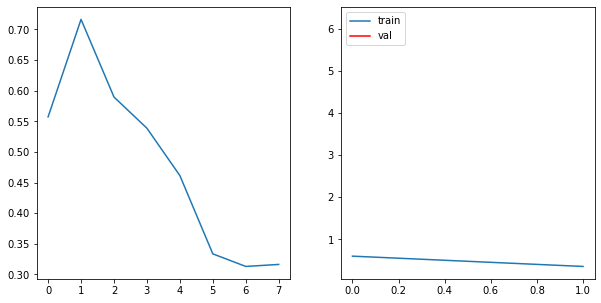

* Epoch 3/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2943, grad_fn=<MeanBackward0>)
tensor(0.3083, grad_fn=<MeanBackward0>)
tensor(0.3494, grad_fn=<MeanBackward0>)
tensor(0.2798, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 0.3079596683382988	         Validation Loss:6.22670545578003	 \ LR:0.01


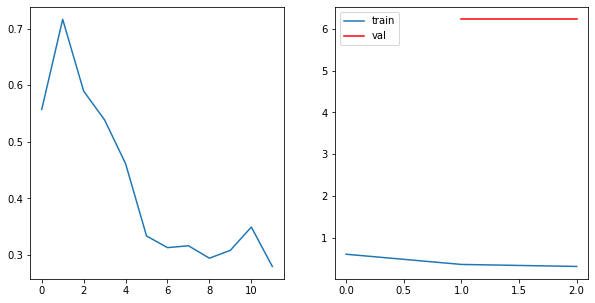

* Epoch 4/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2865, grad_fn=<MeanBackward0>)
tensor(0.2741, grad_fn=<MeanBackward0>)
tensor(0.2743, grad_fn=<MeanBackward0>)
tensor(0.2488, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 0.2709287144243717	         Validation Loss:6.216369199752807	 \ LR:0.01


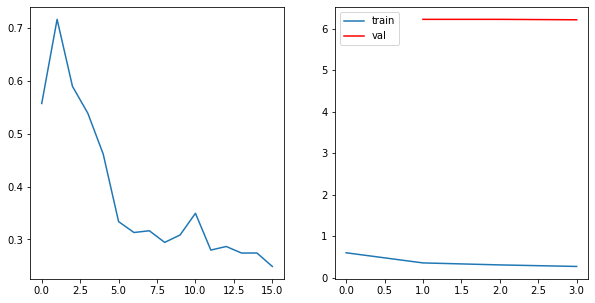

* Epoch 5/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2503, grad_fn=<MeanBackward0>)
tensor(0.2169, grad_fn=<MeanBackward0>)
tensor(0.2234, grad_fn=<MeanBackward0>)
tensor(0.2182, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 0.2271932139992714	         Validation Loss:5.7991156578063965	 \ LR:0.01


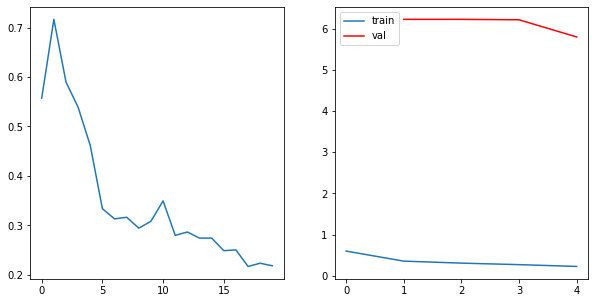

* Epoch 6/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2236, grad_fn=<MeanBackward0>)
tensor(0.1817, grad_fn=<MeanBackward0>)
tensor(0.2087, grad_fn=<MeanBackward0>)
tensor(0.1630, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 0.194227933883667	         Validation Loss:2.9520907402038574	 \ LR:0.01


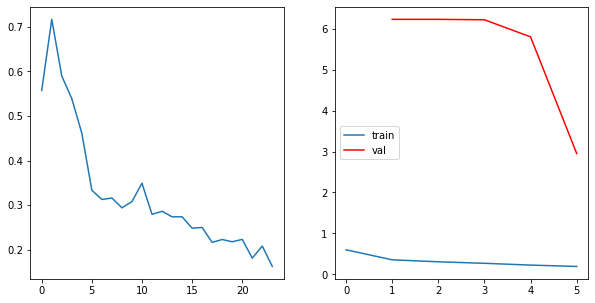

* Epoch 7/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1462, grad_fn=<MeanBackward0>)
tensor(0.2014, grad_fn=<MeanBackward0>)
tensor(0.1796, grad_fn=<MeanBackward0>)
tensor(0.1595, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 0.1716797649860382	         Validation Loss:0.8777316451072693	 \ LR:0.01


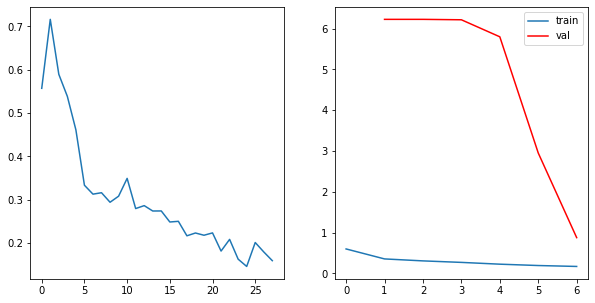

* Epoch 8/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1600, grad_fn=<MeanBackward0>)
tensor(0.1582, grad_fn=<MeanBackward0>)
tensor(0.1927, grad_fn=<MeanBackward0>)
tensor(0.2015, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 0.1781293973326683	         Validation Loss:0.4758034884929657	 \ LR:0.01


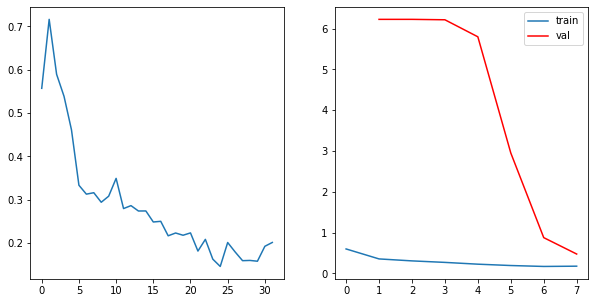

* Epoch 9/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.2036, grad_fn=<MeanBackward0>)
tensor(0.1551, grad_fn=<MeanBackward0>)
tensor(0.1862, grad_fn=<MeanBackward0>)
tensor(0.1611, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 0.1765148863196373	         Validation Loss:0.2512764990329742	 \ LR:0.01


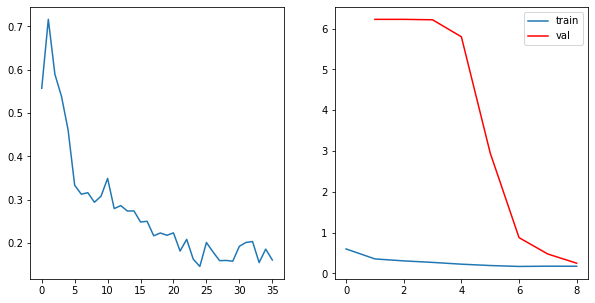

* Epoch 10/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1010, grad_fn=<MeanBackward0>)
tensor(0.1553, grad_fn=<MeanBackward0>)
tensor(0.1232, grad_fn=<MeanBackward0>)
tensor(0.1797, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 0.13978868909180164	         Validation Loss:0.3430231511592865	 \ LR:0.01


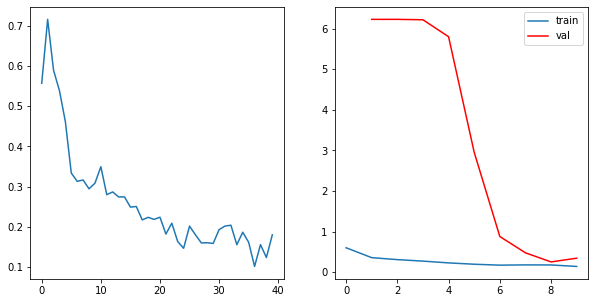

* Epoch 11/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1201, grad_fn=<MeanBackward0>)
tensor(0.1496, grad_fn=<MeanBackward0>)
tensor(0.1282, grad_fn=<MeanBackward0>)
tensor(0.1385, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 0.1341083124279976	         Validation Loss:0.17001979798078537	 \ LR:0.01


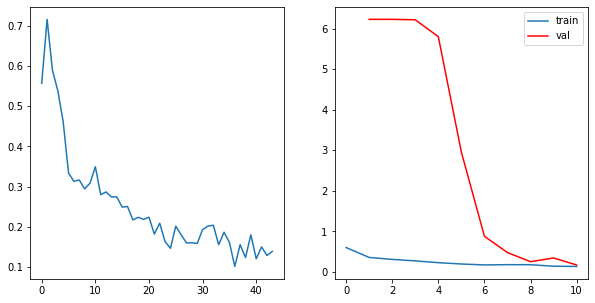

* Epoch 12/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1138, grad_fn=<MeanBackward0>)
tensor(0.1525, grad_fn=<MeanBackward0>)
tensor(0.1324, grad_fn=<MeanBackward0>)
tensor(0.1244, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 0.13080289214849472	         Validation Loss:0.1773562550544739	 \ LR:0.01


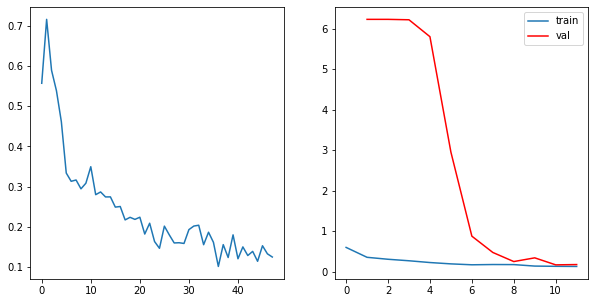

* Epoch 13/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0998, grad_fn=<MeanBackward0>)
tensor(0.1442, grad_fn=<MeanBackward0>)
tensor(0.1157, grad_fn=<MeanBackward0>)
tensor(0.2073, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 0.14177117869257927	         Validation Loss:0.22754722982645034	 \ LR:0.01


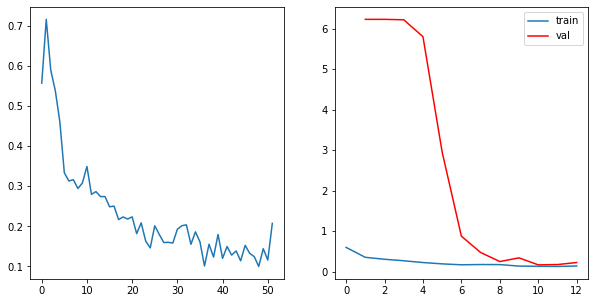

* Epoch 14/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1194, grad_fn=<MeanBackward0>)
tensor(0.1276, grad_fn=<MeanBackward0>)
tensor(0.1049, grad_fn=<MeanBackward0>)
tensor(0.1374, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 0.12233755178749561	         Validation Loss:0.14719596952199937	 \ LR:0.01


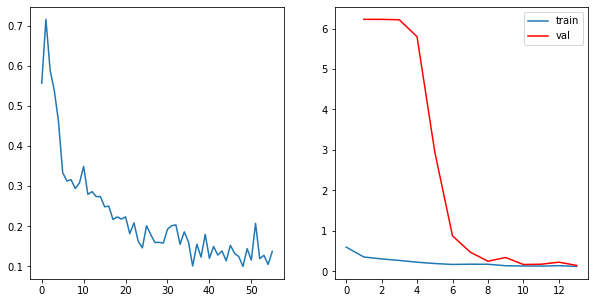

* Epoch 15/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0965, grad_fn=<MeanBackward0>)
tensor(0.1082, grad_fn=<MeanBackward0>)
tensor(0.1474, grad_fn=<MeanBackward0>)
tensor(0.1531, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 0.12630083784461021	         Validation Loss:0.13696815818548203	 \ LR:0.01


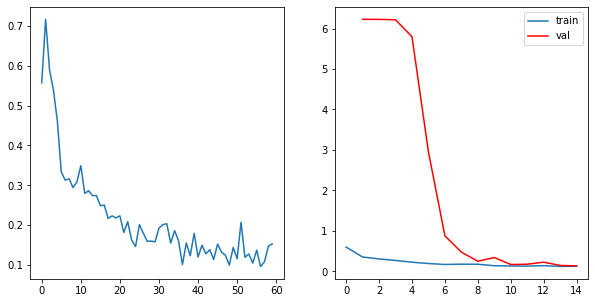

* Epoch 16/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1212, grad_fn=<MeanBackward0>)
tensor(0.1149, grad_fn=<MeanBackward0>)
tensor(0.0915, grad_fn=<MeanBackward0>)
tensor(0.1069, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 0.10861972160637379	         Validation Loss:0.201311919093132	 \ LR:0.01


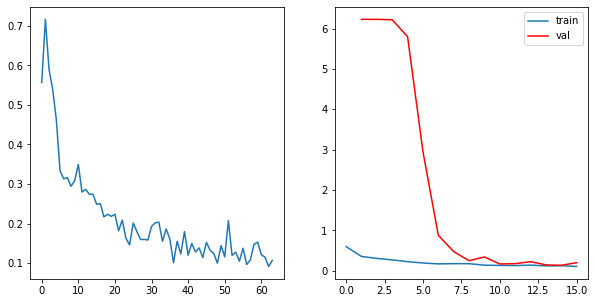

* Epoch 17/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1146, grad_fn=<MeanBackward0>)
tensor(0.1099, grad_fn=<MeanBackward0>)
tensor(0.0936, grad_fn=<MeanBackward0>)
tensor(0.1072, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 0.1063433513045311	         Validation Loss:0.1635594293475151	 \ LR:0.01


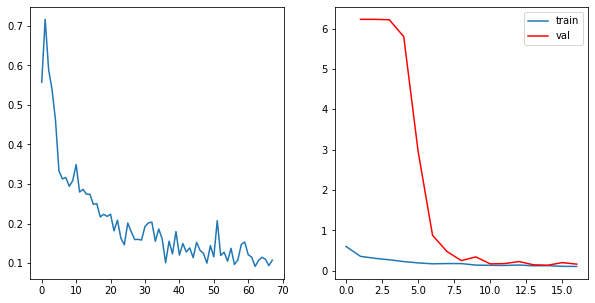

* Epoch 18/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0697, grad_fn=<MeanBackward0>)
tensor(0.1598, grad_fn=<MeanBackward0>)
tensor(0.1012, grad_fn=<MeanBackward0>)
tensor(0.1082, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 0.10975081846117973	         Validation Loss:0.18771862089633942	 \ LR:0.01


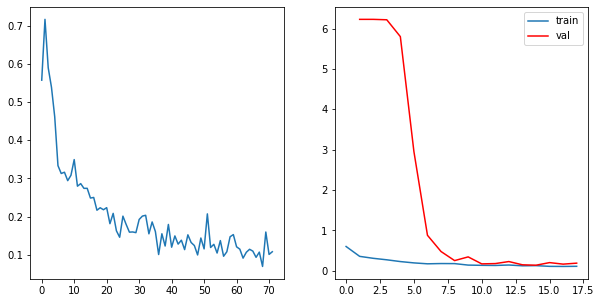

* Epoch 19/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0891, grad_fn=<MeanBackward0>)
tensor(0.0702, grad_fn=<MeanBackward0>)
tensor(0.1216, grad_fn=<MeanBackward0>)
tensor(0.1418, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 0.10567288473248482	         Validation Loss:0.16699810326099396	 \ LR:0.01


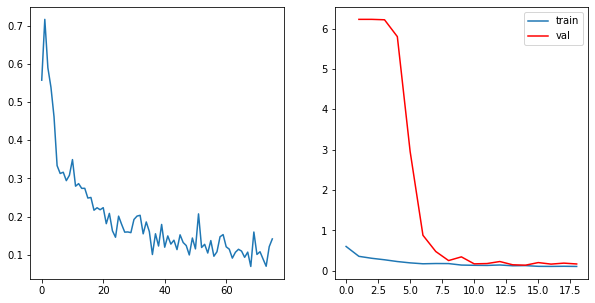

* Epoch 20/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.1162, grad_fn=<MeanBackward0>)
tensor(0.0980, grad_fn=<MeanBackward0>)
tensor(0.1099, grad_fn=<MeanBackward0>)
tensor(0.1004, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 0.10615058988332748	         Validation Loss:0.16975280940532683	 \ LR:0.001


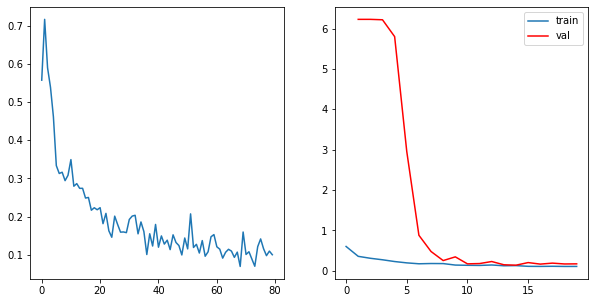

* Epoch 21/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0951, grad_fn=<MeanBackward0>)
tensor(0.0895, grad_fn=<MeanBackward0>)
tensor(0.1079, grad_fn=<MeanBackward0>)
tensor(0.0958, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20	 \Training Loss: 0.0970805175602436	         Validation Loss:0.13425385802984238	 \ LR:0.001


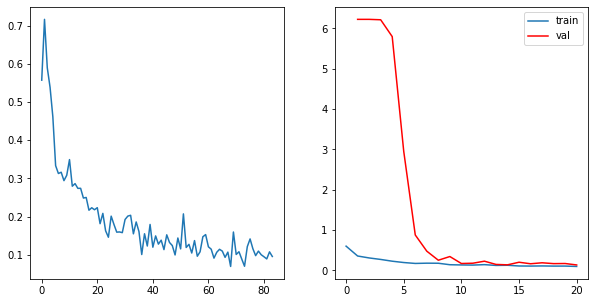

* Epoch 22/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0888, grad_fn=<MeanBackward0>)
tensor(0.0808, grad_fn=<MeanBackward0>)
tensor(0.0993, grad_fn=<MeanBackward0>)
tensor(0.1097, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21	 \Training Loss: 0.09466308727860451	         Validation Loss:0.12235576808452606	 \ LR:0.001


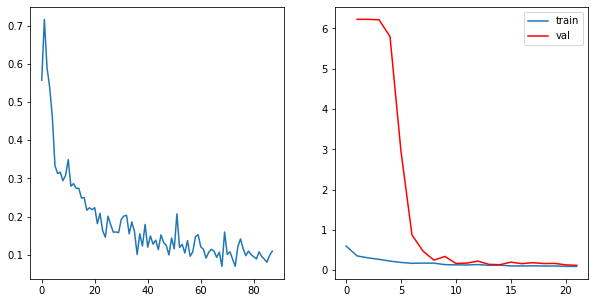

* Epoch 23/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0843, grad_fn=<MeanBackward0>)
tensor(0.0881, grad_fn=<MeanBackward0>)
tensor(0.0942, grad_fn=<MeanBackward0>)
tensor(0.1158, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22	 \Training Loss: 0.09559643641114235	         Validation Loss:0.12671093493700028	 \ LR:0.001


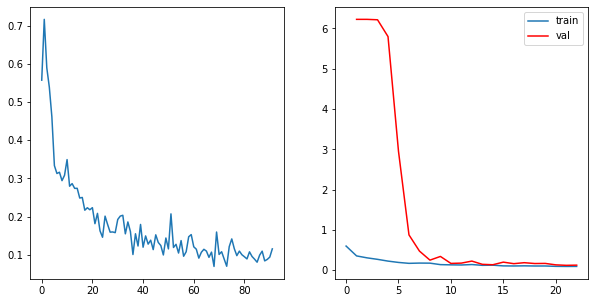

* Epoch 24/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0758, grad_fn=<MeanBackward0>)
tensor(0.0744, grad_fn=<MeanBackward0>)
tensor(0.0934, grad_fn=<MeanBackward0>)
tensor(0.0941, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23	 \Training Loss: 0.0844029150903225	         Validation Loss:0.13039381802082062	 \ LR:0.001


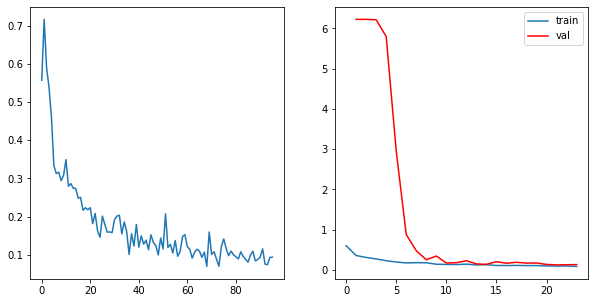

* Epoch 25/25


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.0734, grad_fn=<MeanBackward0>)
tensor(0.0767, grad_fn=<MeanBackward0>)
tensor(0.0863, grad_fn=<MeanBackward0>)
tensor(0.1002, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24	 \Training Loss: 0.08414182625710964	         Validation Loss:0.1336819753050804	 \ LR:0.001


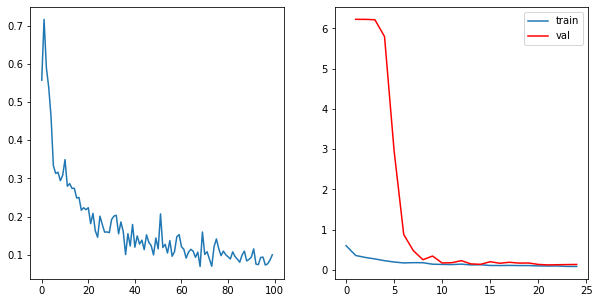

In [38]:
train(unet_model_focal, optim, focal_loss, max_epochs, data_tr, data_val, scheduler)

In [39]:
score_model(unet_model_focal, iou_pytorch, data_val)

0.6860000252723694

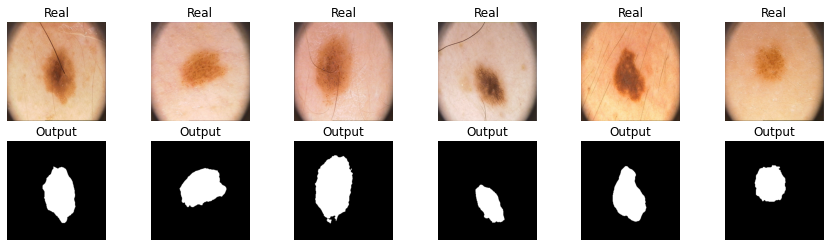

In [41]:
X_val, Y_val = next(iter(data_val))
unet_model_focal.eval()  # testing mode
Y_hat = unet_model_focal(X_val) # detach and put into cpu

        # Visualize tools
clear_output(wait=True)
for k in range(6):
    plt.subplot(2, 6, k+1)
    plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
    plt.title('Real')
    plt.axis('off')

    plt.subplot(2, 6, k+7)
    plt.imshow(torch.where(Y_hat>0.45, 1, 0)[k, 0].detach().numpy(), cmap='gray')
    plt.title('Output')
    plt.axis('off')
plt.show()

Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


In [42]:
class UNet2(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )
        self.Sigmoid = nn.Sigmoid()
        self.enc_conv0 = self.conv_block(in_channels=3, out_channels=32)
        self.pool0 = self.Pool_conv_block(in_channels=32, out_channels=32) # 256 -> 128
        self.enc_conv1 = self.conv_block(in_channels=32, out_channels=64)
        self.pool1 = self.Pool_conv_block(in_channels=64, out_channels=64)# 128 -> 64
        self.enc_conv2 = self.conv_block(in_channels=64, out_channels=128)
        self.pool2 = self.Pool_conv_block(in_channels=128, out_channels=128) # 64 -> 32
        self.enc_conv3 = self.conv_block(in_channels=128, out_channels=256)
        self.pool3 = self.Pool_conv_block(in_channels=256, out_channels=256) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = self.conv_block(in_channels=256, out_channels=512)

        # decoder (upsampling)
        self.upsample0 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=3, stride=2, padding=1, output_padding=1)  # 16 -> 32
        self.dec_conv0 = self.conv_block(in_channels=512, out_channels=256)
        self.upsample1 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1) # 32 -> 64
        self.dec_conv1 = self.conv_block(in_channels=256, out_channels=128)
        self.upsample2 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1) # 64 -> 128
        self.dec_conv2 = self.conv_block(in_channels=128, out_channels=64)
        self.upsample3 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1)  # 128 -> 256
        self.dec_conv3 = self.conv_block(in_channels=64, out_channels=32)
        self.dec_conv4 = nn.Conv2d(in_channels=32, out_channels=1, kernel_size=1, stride=1)

    def conv_block(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels),
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels))
        return block
    
    def Pool_conv_block(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=2, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels))
        return block
    
    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)
        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)
        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)
        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(p3)

        # decoder
        up0 = self.upsample0(b)
        d0 = self.dec_conv0(torch.cat((up0, e3), dim=1))
        up1 = self.upsample1(d0)
        d1 = self.dec_conv1(torch.cat((up1, e2), dim=1))
        up2 = self.upsample2(d1)
        d2 = self.dec_conv2(torch.cat((up2, e1), dim=1))
        up3 = self.upsample3(d2)
        d3 = self.dec_conv3(torch.cat((up3, e0), dim=1))
        d4 = self.Sigmoid(self.dec_conv4(d3))
        return d4


In [43]:
unet2_model = UNet()
from torchsummary import summary
summary(unet2_model, (3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 32, 256, 256]        --
|    └─Conv2d: 2-1                       [-1, 32, 256, 256]        896
|    └─ReLU: 2-2                         [-1, 32, 256, 256]        --
|    └─BatchNorm2d: 2-3                  [-1, 32, 256, 256]        64
|    └─Conv2d: 2-4                       [-1, 32, 256, 256]        9,248
|    └─ReLU: 2-5                         [-1, 32, 256, 256]        --
|    └─BatchNorm2d: 2-6                  [-1, 32, 256, 256]        64
├─MaxPool2d: 1-2                         [-1, 32, 128, 128]        --
├─Sequential: 1-3                        [-1, 64, 128, 128]        --
|    └─Conv2d: 2-7                       [-1, 64, 128, 128]        18,496
|    └─ReLU: 2-8                         [-1, 64, 128, 128]        --
|    └─BatchNorm2d: 2-9                  [-1, 64, 128, 128]        128
|    └─Conv2d: 2-10                      [-1, 64, 128, 128]        36,928
| 

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 32, 256, 256]        --
|    └─Conv2d: 2-1                       [-1, 32, 256, 256]        896
|    └─ReLU: 2-2                         [-1, 32, 256, 256]        --
|    └─BatchNorm2d: 2-3                  [-1, 32, 256, 256]        64
|    └─Conv2d: 2-4                       [-1, 32, 256, 256]        9,248
|    └─ReLU: 2-5                         [-1, 32, 256, 256]        --
|    └─BatchNorm2d: 2-6                  [-1, 32, 256, 256]        64
├─MaxPool2d: 1-2                         [-1, 32, 128, 128]        --
├─Sequential: 1-3                        [-1, 64, 128, 128]        --
|    └─Conv2d: 2-7                       [-1, 64, 128, 128]        18,496
|    └─ReLU: 2-8                         [-1, 64, 128, 128]        --
|    └─BatchNorm2d: 2-9                  [-1, 64, 128, 128]        128
|    └─Conv2d: 2-10                      [-1, 64, 128, 128]        36,928
| 

In [44]:
unet2_model = UNet2()

In [45]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
max_epochs = 20
optim = torch.optim.Adam(unet2_model.parameters(), lr=0.01)
scheduler = ReduceLROnPlateau(optim, 'min', patience = 4)

  0%|          | 0/20 [00:00<?, ?it/s]

* Epoch 1/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.8248, grad_fn=<MeanBackward0>)
tensor(0.8333, grad_fn=<MeanBackward0>)
tensor(0.7476, grad_fn=<MeanBackward0>)
tensor(0.7135, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0	 \Training Loss: 0.7798121571540833	         Validation Loss:0.9752338051795959	 \ LR:0.01


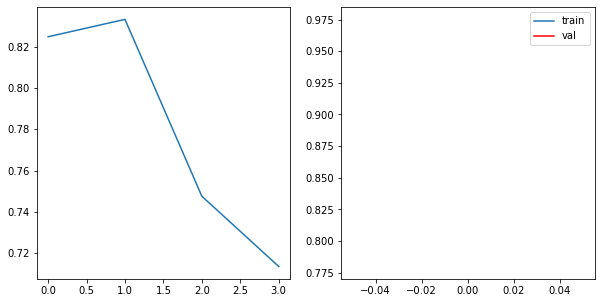

* Epoch 2/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.7282, grad_fn=<MeanBackward0>)
tensor(0.6558, grad_fn=<MeanBackward0>)
tensor(0.6688, grad_fn=<MeanBackward0>)
tensor(0.7158, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1	 \Training Loss: 0.6921505182981491	         Validation Loss:0.9752338171005249	 \ LR:0.01


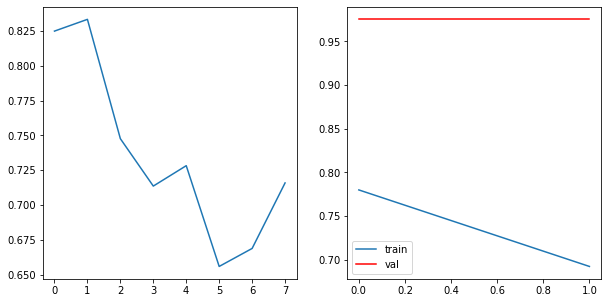

* Epoch 3/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6802, grad_fn=<MeanBackward0>)
tensor(0.6660, grad_fn=<MeanBackward0>)
tensor(0.6741, grad_fn=<MeanBackward0>)
tensor(0.6299, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2	 \Training Loss: 0.6625438332557678	         Validation Loss:0.975233793258667	 \ LR:0.01


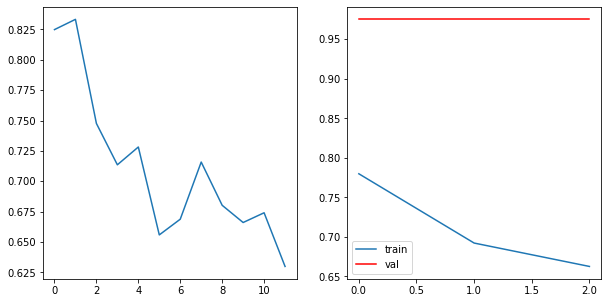

* Epoch 4/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6397, grad_fn=<MeanBackward0>)
tensor(0.6381, grad_fn=<MeanBackward0>)
tensor(0.6406, grad_fn=<MeanBackward0>)
tensor(0.6245, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3	 \Training Loss: 0.6357374489307404	         Validation Loss:0.9726843476295471	 \ LR:0.01


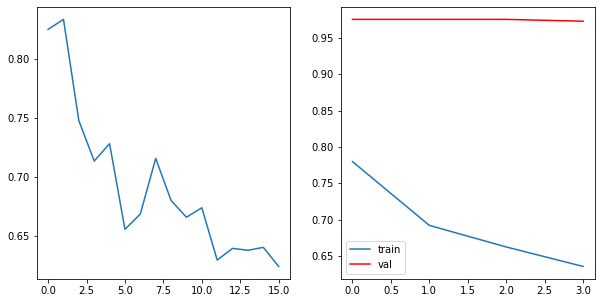

* Epoch 5/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6095, grad_fn=<MeanBackward0>)
tensor(0.6387, grad_fn=<MeanBackward0>)
tensor(0.6441, grad_fn=<MeanBackward0>)
tensor(0.6245, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4	 \Training Loss: 0.6292351335287094	         Validation Loss:0.8145994663238525	 \ LR:0.01


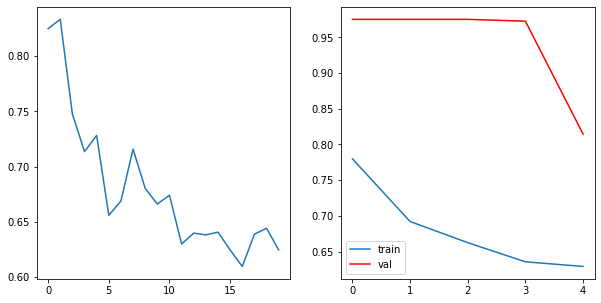

* Epoch 6/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6039, grad_fn=<MeanBackward0>)
tensor(0.6045, grad_fn=<MeanBackward0>)
tensor(0.6194, grad_fn=<MeanBackward0>)
tensor(0.6632, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5	 \Training Loss: 0.6227584630250931	         Validation Loss:0.7978339076042176	 \ LR:0.01


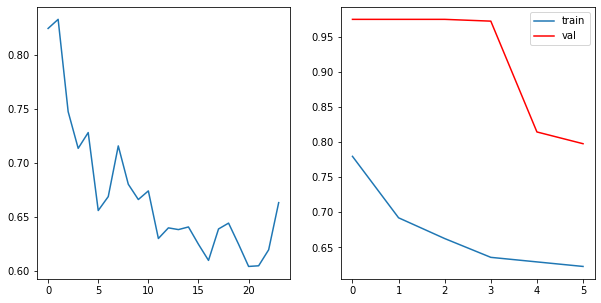

* Epoch 7/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6164, grad_fn=<MeanBackward0>)
tensor(0.6005, grad_fn=<MeanBackward0>)
tensor(0.6189, grad_fn=<MeanBackward0>)
tensor(0.6308, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6	 \Training Loss: 0.6166408807039261	         Validation Loss:0.6815750598907471	 \ LR:0.01


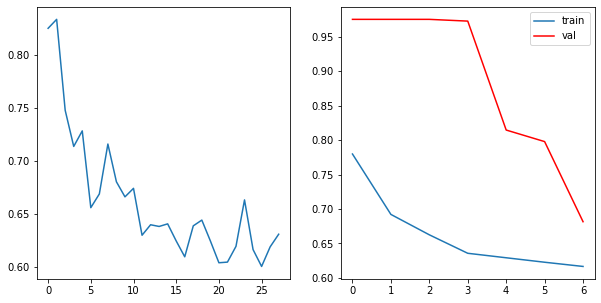

* Epoch 8/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6038, grad_fn=<MeanBackward0>)
tensor(0.6307, grad_fn=<MeanBackward0>)
tensor(0.6591, grad_fn=<MeanBackward0>)
tensor(0.5943, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7	 \Training Loss: 0.6219683438539505	         Validation Loss:0.6498912334442138	 \ LR:0.01


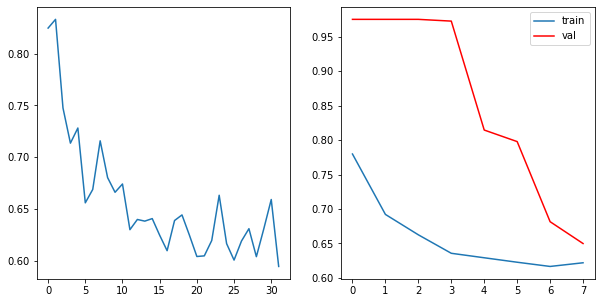

* Epoch 9/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6288, grad_fn=<MeanBackward0>)
tensor(0.6082, grad_fn=<MeanBackward0>)
tensor(0.6036, grad_fn=<MeanBackward0>)
tensor(0.6409, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8	 \Training Loss: 0.6203709095716476	         Validation Loss:0.6595370769500732	 \ LR:0.01


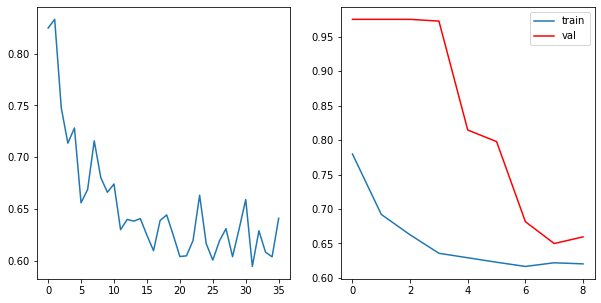

* Epoch 10/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6132, grad_fn=<MeanBackward0>)
tensor(0.6076, grad_fn=<MeanBackward0>)
tensor(0.6269, grad_fn=<MeanBackward0>)
tensor(0.6130, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9	 \Training Loss: 0.6151484251022339	         Validation Loss:0.6481650948524476	 \ LR:0.01


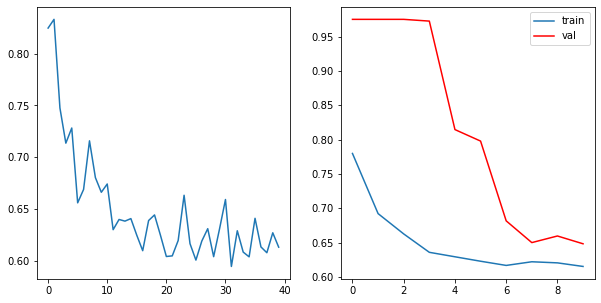

* Epoch 11/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6139, grad_fn=<MeanBackward0>)
tensor(0.6152, grad_fn=<MeanBackward0>)
tensor(0.6056, grad_fn=<MeanBackward0>)
tensor(0.6099, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10	 \Training Loss: 0.6111303120851517	         Validation Loss:0.6223981499671936	 \ LR:0.01


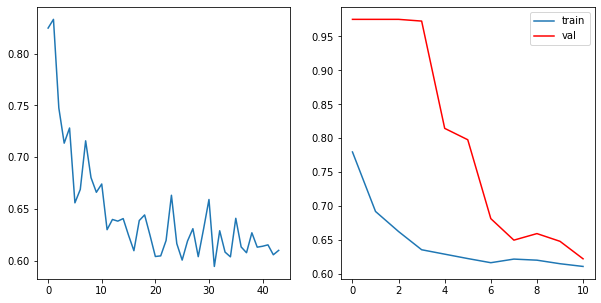

* Epoch 12/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6075, grad_fn=<MeanBackward0>)
tensor(0.6165, grad_fn=<MeanBackward0>)
tensor(0.6138, grad_fn=<MeanBackward0>)
tensor(0.6136, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11	 \Training Loss: 0.6128374934196472	         Validation Loss:0.6209018707275391	 \ LR:0.01


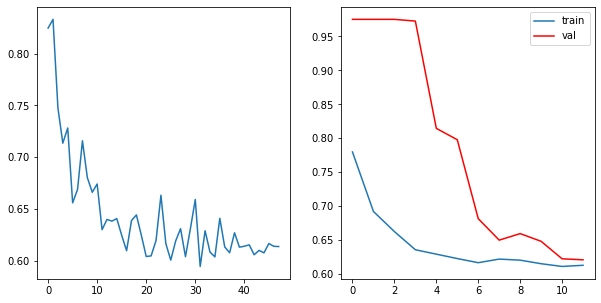

* Epoch 13/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6006, grad_fn=<MeanBackward0>)
tensor(0.6144, grad_fn=<MeanBackward0>)
tensor(0.6182, grad_fn=<MeanBackward0>)
tensor(0.6096, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12	 \Training Loss: 0.6106978505849838	         Validation Loss:0.6314773321151733	 \ LR:0.01


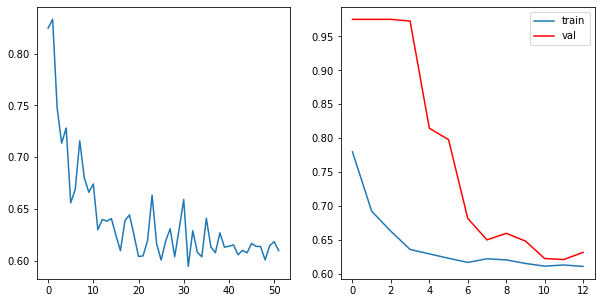

* Epoch 14/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6261, grad_fn=<MeanBackward0>)
tensor(0.6039, grad_fn=<MeanBackward0>)
tensor(0.6123, grad_fn=<MeanBackward0>)
tensor(0.6221, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13	 \Training Loss: 0.6161063611507416	         Validation Loss:0.6461081147193909	 \ LR:0.01


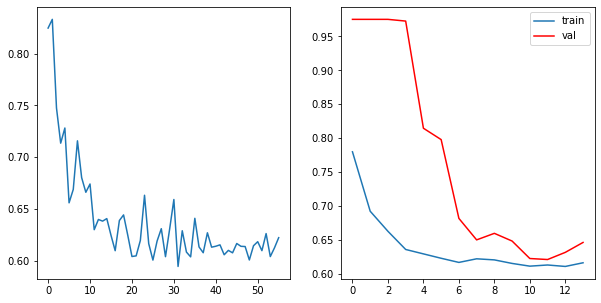

* Epoch 15/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6167, grad_fn=<MeanBackward0>)
tensor(0.5998, grad_fn=<MeanBackward0>)
tensor(0.6038, grad_fn=<MeanBackward0>)
tensor(0.6281, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14	 \Training Loss: 0.612116739153862	         Validation Loss:0.607187008857727	 \ LR:0.01


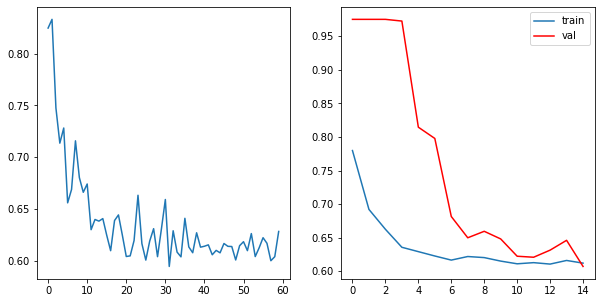

* Epoch 16/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6302, grad_fn=<MeanBackward0>)
tensor(0.5971, grad_fn=<MeanBackward0>)
tensor(0.6165, grad_fn=<MeanBackward0>)
tensor(0.6009, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15	 \Training Loss: 0.6111937612295151	         Validation Loss:0.6050301551818847	 \ LR:0.01


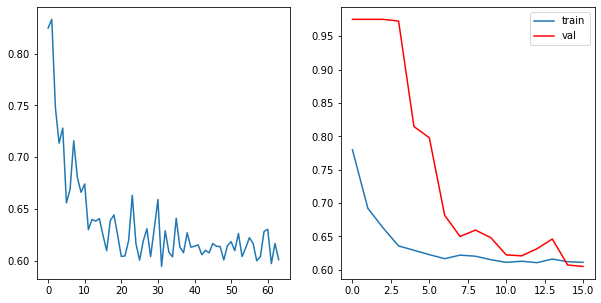

* Epoch 17/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6088, grad_fn=<MeanBackward0>)
tensor(0.5994, grad_fn=<MeanBackward0>)
tensor(0.6036, grad_fn=<MeanBackward0>)
tensor(0.6143, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16	 \Training Loss: 0.6065296530723572	         Validation Loss:0.6139999151229858	 \ LR:0.01


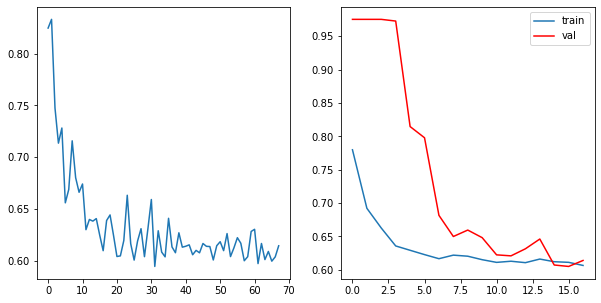

* Epoch 18/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6123, grad_fn=<MeanBackward0>)
tensor(0.6068, grad_fn=<MeanBackward0>)
tensor(0.6003, grad_fn=<MeanBackward0>)
tensor(0.6231, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17	 \Training Loss: 0.6106200665235519	         Validation Loss:0.6135994791984558	 \ LR:0.01


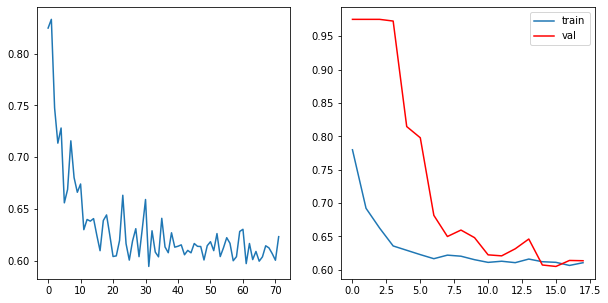

* Epoch 19/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.6018, grad_fn=<MeanBackward0>)
tensor(0.6077, grad_fn=<MeanBackward0>)
tensor(0.6133, grad_fn=<MeanBackward0>)
tensor(0.5999, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18	 \Training Loss: 0.6056890934705734	         Validation Loss:0.7150846958160401	 \ LR:0.01


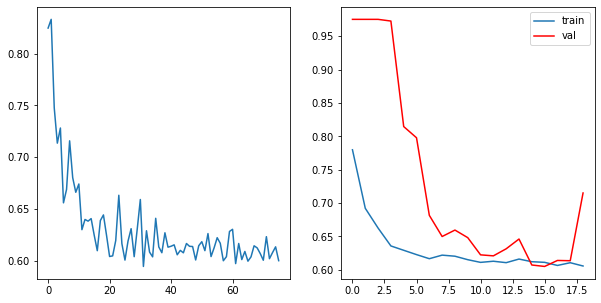

* Epoch 20/20


  0%|          | 0/4 [00:00<?, ?it/s]

tensor(0.5903, grad_fn=<MeanBackward0>)
tensor(0.6208, grad_fn=<MeanBackward0>)
tensor(0.6177, grad_fn=<MeanBackward0>)
tensor(0.6148, grad_fn=<MeanBackward0>)


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19	 \Training Loss: 0.6109181940555573	         Validation Loss:0.6532406568527221	 \ LR:0.01


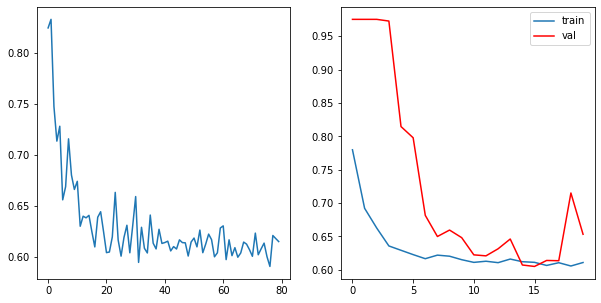

In [46]:
train(unet2_model, optim, bce_loss, max_epochs, data_tr, data_val, scheduler)

In [47]:
score_model(unet2_model, iou_pytorch, data_val)

0.4540000021457672

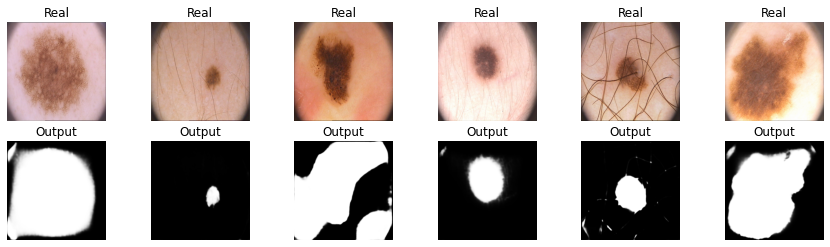

In [55]:
X_val, Y_val = next(iter(data_val))
unet2_model.eval()  # testing mode
Y_hat = unet2_model(X_val) # detach and put into cpu

        # Visualize tools
clear_output(wait=True)
for k in range(6):
    plt.subplot(2, 6, k+1)
    plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
    plt.title('Real')
    plt.axis('off')

    plt.subplot(2, 6, k+7)
    plt.imshow(Y_hat[k, 0].detach().numpy(), cmap='gray')
    plt.title('Output')
    plt.axis('off')
plt.show()

Сделайте вывод, какая из моделей лучше

# Отчет (6 баллов): 
Ниже предлагается написать отчет о проделанно работе и построить графики для лоссов, метрик на валидации и тесте. 
Если вы пропустили какую-то часть в задании выше, то вы все равно можете получить основную часть баллов в отчете, если правильно зададите проверяемые вами гипотезы.


Аккуратно сравните модели между собой и соберите наилучшую архитектуру. Проверьте каждую модель с различными лоссами. Мы не ограничиваем вас в формате отчета, но проверяющий должен отчетливо понять для чего построен каждый график, какие выводы вы из него сделали и какой общий вывод можно сделать на основании данных моделей. Если вы захотите добавить что-то еще, чтобы увеличить шансы получения максимального балла, то добавляйте отдельное сравнение.

Дополнительные комментарии: 

Пусть у вас есть N обученных моделей.
- Является ли отчетом N графиков с 1 линей? Да, но очень низкокачественным, потому что проверяющий не сможет сам сравнить их.

- Является ли отчетом 1 график с N линиями? Да, но скорее всего таким образом вы отразили лишь один эффект. Этого мало, чтобы сделать досточно суждений по поводу вашей работа.

- Я проверял метрики на трейне, и привел в результате таблицу с N числами, что не так? ключейвой момент тут, что вы измеряли на трейне ваши метрики, уверены ли вы, что заивисмости останутся такими же на отложенной выборке?

- Я сделал отчет содержащий график лоссов и метрик, и у меня нет ошибок в основной части, но за отчет не стоит максимум, почему? Естестественно максимум баллов за отчет можно получить не за 2 графика (даже при условии их полной правильности). Проверяющий хочет видеть больше сравнений моделей, чем метрики и лоссы (особенно, если они на трейне).

Советы: попробуйте правильно поставить вопрос на который вы себе отвечаете и продемонстрировать таблицу/график, помогающий проверяющему увидеть ответ на этот вопрос. Пример: Ваня хочет узнать, с каким из 4-х лоссов модель (например, U-Net) имеет наилучшее качество. Что нужно сделать Ване? Обучить 4 одинаковых модели с разными лосс функциями. И измерить итогововое качество. Продемонстрировать результаты своих измерений и итоговый вывод. (warning: конечно же, это не идеально ответит на наш вопрос, так как мы не учитываем в экспериментах возможные различные типы ошибок, но для первого приближения этого вполне достаточно).

Примерное время на подготовку отчета 1 час, он содержит сравнеение метрик, график лоссов, выбор лучших моделей из нескольких кластеров и выбор просто лучшей модели, небольшой вывод по всему дз, возможно сравнение результирующих сегментаций, времени или числа параметров модели, проявляйте креативность.

Было обучено несколько различных моделей. 4 Segnet с 4-мя различными лосс функциями, 2 Unet с upsample с функциями потерь BCE и Focal (выбрана, так как показала наилучшую точность на SegNet) и одна UNET с ConvTranspose2d. Каждая из моделей не перобучилась, о чем говорят графики лоссов при обучении. Однако было неплохо еще выводить графики метрик во время обучения, но об этом я подумал уже в самом конце, а переобучать заново модели не позволяют сроки. В этом же причина отсутствия экспериментов с Unet и всеми лосс функциями. 
Касательно лосс функций, лучше всего себя показала Focal. На SegNet в ее случает наивысшее качество. И по графику ведет она себя более предсказуемо, всплески на валидации являются следствием переобучения, однако это конралируется уменьшением LR. Это можно объяснить тем, что Focal учитывает несбалансированность классов на изображениях, что как раз присутствует в данной задаче.
Однако, если сравнивать уже модели, то Unet оказался лучше SegNet. Качество предсказания почти на 0,2 выше. Что было и ожидаемо. В ситуации несбалансированности классов и нечетких границ классов на изображениях Unet более чувствителен и точен. 
Результаты последних 2 испытаний можно объяснить тем, что обучалось меньше эпох, чем на Unet с BCE, из-за нехватки времени. Если дать поработь модели с Focal побольше, то качество на выходе наверняка перегонит качество модели с BCE. Касательно вариантов пулинга, я бы взял вариант пулинга из певого предложенного варианта, а upooling-а из второго варианта, ConvTranspose2d. Как минимум по тем статьям, что я смотрел, сейчас придерживаются именно этой позиции. 
В завершении можно сказать, что Unet действительно лучше всего подходит для некого baseline в задачах сегментации, особенно когда речь идет о задачах из области медицины